## Summary

1. [Data loading](#1-loading)

2. [Data cleaning](#2-cleaning)

    [2.1 Missing values](#21-nulls)

    [2.2 Duplicated rows](#22-duplicated)

    [2.3 Outliers](#23-outliers)

    [2.4 Exploring columns](#24-exploring)
        
    - 2.4.1 Claims
    - 2.4.2 Other columns

3. [Feature engineering](#3-fe)

    [3.1 Specialization, grouping and classification](#31-specialization-groupings-and-classification)

    [3.2 Working hours](#32-working-hours)

    [3.3 Ownership](#33-ownership)

    [3.4 Languages spoken](#34-languages-spoken)

    [3.5 Providers per county](#35-providers-per-county)

    [3.6 Date feature ](#36-date-feature)

    [3.7 Lagged variables](#37-lagged-variables)

    [3.8 Dropping features](#38-dropping-features)

4. [Encoding](#4-encoding)

5. [Prepare for modelling](#5-prep)

    [5.1 Checks of prepared data](#51-checks)
    
    [5.2 Splitting dataset](#52-split)

    [5.3 Scaling](#53-scaling)

    [5.4 Balancing](#54-balancing)

6. [Modelling](#6-modeling)

    [6.1 Defining functions](#61-functions)

    [6.5 Linear Regression](#lr)

    - [6.6.5 With Interaction variables - final model](#final-model)
    
    [6.7 Error Analysis](#67-error-analysis)

    - 6.7.1 Classifying the ratio of average error to average actual value by Specialization Group
    
7. [Predicting for 2021 Q1](#prediction)

    [7.1 Error Intervals for Predictions](#errors)

8. [Linking the Demand Prediction to the Supply Segmentation](#segmentation)

    [8.1 Evaluting Predictions by Provider Segment](#provider_segment)

    [8.2 Evaluting Error-Adjusted Provider Segment Predictions](#provider_segment_error)

9. [Further Examination of the Development in Demand](#supplier_characteristics)

    [9.1 Expected Development of Total Claims Demand](#claims_development)
    
    [9.2 Expected Development of Total Claims Demand by Supplier Characteristics](#claims_development_by_characteristic)

10. [Geographic Analysis of Demand](#geography)

11. [Appendix](#appendix)

    [6.2 Creating alternative datasets for X_train and X_test](#62-creating-alternative-datasets-for-x_train-and-x_test)

    - 6.2.1 Correlation threshold
    - 6.2.2 Dominant features
    - 6.2.3 PCA
    - 6.2.4 Correlation on top dominant features
    - 6.2.5 Filtering on my instincts

    [6.3 Random Forest Models](#63-random-forest-models)

    - 6.3.1 All features
    - 6.3.2 Correlation threshold
    - 6.3.3 Dominant features - 5
    - 6.3.4 Dominant features - 10
    - 6.3.5 Dominant features - 15
    - 6.3.6 Correlation on dominant features - 15
    - 6.3.7 With recursive filtering and random forest regressor
    - 6.3.8 With recursive filtering and random forest with other hyperparameters
    - 6.3.9 PCA  
    - 6.3.10 Removing other lag columns
    - 6.3.11 Tunning hyperparameters with 5 features
    - 6.3.12 Features with 0.5%+ importance
    - 6.3.13 Dropping the first lag of total claims
    - 6.3.14 Dropping the first and secong lag of total claims   
    - 6.3.15 Retrying with the best hyperparameters of a Random Forest model  
    - 6.3.16 Best hyperparameters of a Random Forest model - 15 dominant features   
    - 6.3.17 Best hyperparameters of a Random Forest model - 10 dominant features
    - 6.3.18 Best hyperparameters of a Random Forest model - 8 dominant features   
    - 6.3.19 Attempt to explain the RF model with SHAP values

    [6.4 XGBoost](#64-xgboost)

    - 6.4.1 With recursive filtering
    - 6.4.2 With hyperparameter optimizer
    - 6.4.3 Integrating a hybrid loss function   
    - 6.4.4 Log-transform the target
    - 6.4.5 Box-cox transformation on the target

    [6.5.v2 Other Linear Approaches](#linear)
    - 6.5.1 With recursive filtering
    - 6.5.2 With top 10 features

    [6.6 Linear regression without rows with original NaN values for lags](#66-no-nans)
        
    - 6.6.1 With scaling  
    - 6.6.2 With Lasso + additional manual feature selection 
    - 6.6.3 Without grouping_1_Laboratories  
    - 6.6.4 Experiment with RF for the data with non NaNs 

#### 1. Data loading <a id='loading'></a>

In [1]:
#!pip3 install ydata_profiling
#!pip3 install optuna
#!pip3 install shap
#!pip3 install numba==0.53.1
# #!pip3 install --upgrade llvmlite
#!pip3 uninstall -y shap numba llvmlite
#!pip3 install shap numba
#!pip3 uninstall -y numba llvmlite shap ydata_profiling
#!pip3 install shap numba ydata_profiling

In [2]:
import pandas as pd
pd.set_option('display.max_columns', 1000)

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
import plotly.express as px

#from ydata_profiling import ProfileReport

from sklearn.feature_selection import RFECV
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import cross_val_predict, KFold, train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.decomposition import PCA

from xgboost import XGBRegressor

import pickle
from joblib import dump, load
from functools import lru_cache
import itertools
import optuna
import ast
import scipy.stats as stats

#import shap

bold = "\033[1m"
reset = "\033[0m"

In [3]:
accenture_colors = ['#A100FF', '#000000']

Loading the data

In [4]:
data = pd.read_excel('datos_ie.xlsx')
data.head()

,npi,countyID,census_tract,zip5,service_year,service_quarter,standard_services_claims,tele_services_claims,total_claims,standard_services_patients,tele_services_patients,total_patients,standard_services_claims_year,tele_services_claims_year,total_claims_year,standard_services_patients_year,tele_services_patients_year,total_patients_year,standard_services_psychotherapy_claims,tele_services_psychotherapy_claims,total_psychotherapy_claims,standard_services_psychotherapy_patients,tele_services_psychotherapy_patients,total_psychotherapy_patients,standard_services_psychotherapy_claims_year,tele_services_psychotherapy_claims_year,total_psychotherapy_claims_year,standard_services_psychotherapy_patients_year,tele_services_psychotherapy_patients_year,total_psychotherapy_patients_year,NPI_Deactivation_Reason_Code,NPI_Deactivation_Date,NPI_Reactivation_Date,Healthcare_Provider_Taxonomy_Code_1,Grouping_1,Classification_1,Specialization_1,Display_Name_1,%psychotherapy_claims,%teleService_claims,%tele_psychotherapy_claims,%psychotherapy_patients,%stdService_patients,%teleService_patients,%tele_psychotherapy_patients,%psychotherapy_claims_year,%teleService_claims_year,%tele_psychotherapy_claims_year,%psychotherapy_patients_year,%stdService_patients_year,%teleService_patients_year,%tele_psychotherapy_patients_year,psychotherapy_provider_through_taxonomy,provided_psychotherapy,psychotherapy_provider,countyname,urbanity,lat,long,transport_access,broadband_access,total_medicaid_claims,total_medicaid_patients,provider_size,Entity_Type_Code,AH_Sign language services for the deaf and hard of hearing,EN_English,SP_Spanish,NX_American Indian or Alaska Native languages,FX_Other languages (excluding Spanish),F4_Arabic,F17_Any Chinese Language,F19_Creole,F25_Farsi,F28_French,F30_German,F31_Greek,F35_Hebrew,F36_Hindi,F37_Hmong,F42_Italian,F43_Japanese,F47_Korean,F66_Polish,F67_Portuguese,F70_Russian,F81_Tagalog,F92_Vietnamese,N24_Ojibwa,N40_Yupik,Spoken_Language_Accessibility,black_owned,latino_owned,lgbtq+_owned,veteran_owned,women_owned,owner_identification,planning_accepts_new_patients,business_status,working_hours_cleaned,Weekend Availability,Availability Before 8AM,Availability After 5PM,total_commercial_claims,total_commercial_patients,total_medicare_claims,total_medicare_patients,total_other_payers_claims,total_other_payers_patients,total_commercial_claims_year,total_commercial_patients_year,total_medicaid_claims_year,total_medicaid_patients_year,total_medicare_claims_year,total_medicare_patients_year,total_other_payers_claims_year,total_other_payers_patients_year
0,1,51,16.04,28348,2020,2,0,0,0,0,0,0,0,8,8,0,5,5,0,0,0,0,0,0,0,8,8,0,5,5,NaN,NaT,NaT,101YA0400X,Behavioral Health & Social Service Providers,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.000000,1.000000,1.0,0.000000,1.000000,1.000000,1,1,1,Cumberland,Urban,34.985025,-78.916585,0.9,0.89,0,0,Small,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Info Not Available,0,Info Not Available,Info Not Available,Info Not Available,Info Not Available,Info Not Available,0,0,0,0,8,2,0,0,0,0,0,0,16,4
1,1,51,16.04,28348,2020,1,0,0,0,0,0,0,0,8,8,0,5,5,0,0,0,0,0,0,0,8,8,0,5,5,NaN,NaT,NaT,101YA0400X,Behavioral Health & Social Service Providers,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.000000,1.000000,1.0,0.000000,1.000000,1.000000,1,1,1,Cumberland,Urban,34.985025,-78.916585,0.9,0.89,0,0,Small,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Info Not Available,0,Info Not Available,Info Not Available,Info Not Available,Info Not Available,Info Not Available,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,51,16.04,28348,2020,3,0,2,2,0,2,2,0,8,8,0,5,5,0,2,2,0,2,2,0,8,8,0,5,5,NaN,NaT,NaT,101YA0400X,Behavioral Health & Social Service Providers,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor,1.0,1.0,1.

Loading the dict with specialization mapping

In [5]:
# Read the content of the file
file_path = "specialization_dict.txt"

with open(file_path, "r") as file:
    dict_content = file.read()

In [6]:
specialization_dict = ast.literal_eval(dict_content)

#### 2. Data cleaning <a id='2-cleaning'></a>

In [7]:
# Overview of the Data
print(f"Shape of the DataFrame: {data.shape[0]} rows and {data.shape[1]} columns.\n")

Shape of the DataFrame: 85436 rows and 117 columns.



In [8]:
# Printing each column name and its data type
print("Columns and their data type:")
for column, dtype in data.dtypes.items():
    print(f"{bold+column+reset}: {dtype}")

Columns and their data type:
npi: int64
countyID: int64
census_tract: float64
zip5: int64
service_year: int64
service_quarter: int64
standard_services_claims: int64
tele_services_claims: int64
total_claims: int64
standard_services_patients: int64
tele_services_patients: int64
total_patients: int64
standard_services_claims_year: int64
tele_services_claims_year: int64
total_claims_year: int64
standard_services_patients_year: int64
tele_services_patients_year: int64
total_patients_year: int64
standard_services_psychotherapy_claims: int64
tele_services_psychotherapy_claims: int64
total_psychotherapy_claims: int64
standard_services_psychotherapy_patients: int64
tele_services_psychotherapy_patients: int64
total_psychotherapy_patients: int64
standard_services_psychotherapy_claims_year: int64
tele_services_psychotherapy_claims_year: int64
total_psychotherapy_claims_year: int64
standard_services_psychotherapy_patients_year: int64
tele_services_psychotherapy_patients_year: int64
total_psychother

#### 2.1 Nulls <a id='21-nulls'></a>

In [9]:
# Filtering the columns which have null values and printing them
nulls = data.isnull().sum()
null_columns = nulls[nulls > 0]
for col, null_count in null_columns.items():
    print(f'Column "{bold+col+reset}" has {null_count} null values.')

Column "NPI_Deactivation_Reason_Code" has 85436 null values.
Column "NPI_Deactivation_Date" has 85316 null values.
Column "NPI_Reactivation_Date" has 85316 null values.
Column "Specialization_1" has 32684 null values.


In [10]:
# Percentage of missing values in each column
print("\nPercentage of missing values in each column:")
null_percentage = data.isnull().mean() * 100
null_percentage = null_percentage[null_percentage > 0]
for col, percentage in null_percentage.items():
    print(f'Column "{bold+col+reset}" has {percentage:.2f}% missing values.')


Percentage of missing values in each column:
Column "NPI_Deactivation_Reason_Code" has 100.00% missing values.
Column "NPI_Deactivation_Date" has 99.86% missing values.
Column "NPI_Reactivation_Date" has 99.86% missing values.
Column "Specialization_1" has 38.26% missing values.


The first three columns can be removed because at least 99.5% of their data are null values.

In [11]:
data = data.drop(columns=["NPI_Deactivation_Reason_Code", "NPI_Deactivation_Date", "NPI_Reactivation_Date"], axis=1)

#### 2.2 Duplicated rows <a id='22-duplicated'></a>

In [12]:
# Checking for duplicates
print(f"Number of duplicate rows: {data.duplicated().sum()}")

Number of duplicate rows: 0


#### 2.3 Outliers <a id='23-outliers'></a>

In [13]:
# Exploring outliers in the data for each type of claim using plotly 
fig = go.Figure()
fig.add_trace(go.Box(y=data["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data["standard_services_claims"], name="Total Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data["tele_services_claims"], name="Total Tele Services Claims", marker_color="red"))
fig.update_layout(title="Boxplots of Claims", yaxis_title="Amount in Thousands", showlegend=False)
fig.show()

In [14]:
# Filtering 3 dataframes per service_year and plotting outliers 
data_2018 = data[data["service_year"] == 2018]
data_2019 = data[data["service_year"] == 2019]
data_2020 = data[data["service_year"] == 2020]

In [15]:
# Exploring outliers for the 3 years and 3 types of claims by plotting using plotly
fig = go.Figure()
fig.add_trace(go.Box(y=data_2018["total_claims"], name="2018 Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data_2019["total_claims"], name="2019 Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data_2020["total_claims"], name="2020 Total Claims", marker_color=accenture_colors[1]))
fig.update_layout(title="Total Claims for 2018, 2019, and 2020", yaxis_title="Total Claims", showlegend=False)

In [16]:
fig = go.Figure()
fig.add_trace(go.Box(y=data_2018["standard_services_claims"], name="2018 Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data_2019["standard_services_claims"], name="2019 Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data_2020["standard_services_claims"], name="2020 Standard Services Claims", marker_color=accenture_colors[0]))
fig.update_layout(title="Standard Services Claims for 2018, 2019, and 2020", yaxis_title="Standard Services Claims", showlegend=False)

In [17]:
fig = go.Figure()
fig.add_trace(go.Box(y=data_2018["tele_services_claims"], name="2018 Tele Services Claims", marker_color="red"))
fig.add_trace(go.Box(y=data_2019["tele_services_claims"], name="2019 Tele Services Claims", marker_color="red"))
fig.add_trace(go.Box(y=data_2020["tele_services_claims"], name="2020 Tele Services Claims", marker_color="red"))
fig.update_layout(title="Tele Services Claims for 2018, 2019, and 2020", yaxis_title="Tele Services Claims", showlegend=False)

#### 2.4 Exploring columns <a id='24-exploring'></a>

2.4.1 Claims

In [18]:
# Analyzing claims and standard services above 10,000 using plotly 
data_above_10000 = data[(data["total_claims"] > 10000) | (data["standard_services_claims"] > 10000) | (data["tele_services_claims"] > 10000)]
fig = go.Figure()
fig.add_trace(go.Box(y=data_above_10000["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data_above_10000["standard_services_claims"], name="Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data_above_10000["tele_services_claims"], name="Tele Services Claims", marker_color="red"))
fig.update_layout(title="Total Claims per Type above 10,000", yaxis_title="Claims", showlegend=False)

In [19]:
# Understanding the distribution of the data over the quarters and years

# Grouping the data by service_year and service_quarter to see the total claims per quarter/year
data_quarterly = data.groupby(["service_year", "service_quarter"]).sum().reset_index()
data_quarterly["service_year"] = data_quarterly["service_year"].astype(str)
data_quarterly["service_quarter"] = data_quarterly["service_quarter"].astype(str)
data_quarterly["service_year_quarter"] = data_quarterly["service_year"] + " Q" + data_quarterly["service_quarter"]
data_quarterly = data_quarterly.sort_values(by=["service_year", "service_quarter"])

# Plotting the total claims per quarter/year
fig = go.Figure()
fig.add_trace(go.Bar(x=data_quarterly["service_year_quarter"], y=data_quarterly["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.update_layout(title="Total Claims per Quarter/Year", xaxis_title="Quarter/Year", yaxis_title="Total Claims")

In [20]:
# Grouped bar chart for total claims, standard services claims, and tele services claims per quarter/year
fig = go.Figure()
fig.add_trace(go.Bar(x=data_quarterly["service_year_quarter"], y=data_quarterly["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Bar(x=data_quarterly["service_year_quarter"], y=data_quarterly["standard_services_claims"], name="Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Bar(x=data_quarterly["service_year_quarter"], y=data_quarterly["tele_services_claims"], name="Tele Services Claims", marker_color="red"))
fig.update_layout(title="Total, Standard Services, and Tele Services Claims per Quarter/Year", xaxis_title="Quarter/Year", yaxis_title="Claims")

Exploring Tele-services claim increase

In [21]:
# Filter the data for each year where 'tele_services_claims' is > 0
data_2018_filtered = data_2018[data_2018['tele_services_claims'] > 0]
data_2019_filtered = data_2019[data_2019['tele_services_claims'] > 0]
data_2020_filtered = data_2020[data_2020['tele_services_claims'] > 0]

# Calculate the percentage of quarters with non-zero 'tele_services_claims' for each year
percentage_2018 = (data_2018_filtered.shape[0] / data_2018.shape[0]) * 100
percentage_2019 = (data_2019_filtered.shape[0] / data_2019.shape[0]) * 100
percentage_2020 = (data_2020_filtered.shape[0] / data_2020.shape[0]) * 100

print(f"Percentage of quarters in 2018 with non-zero 'tele_services_claims': {round(percentage_2018,2)}%")
print(f"Percentage of quarters in 2019 with non-zero 'tele_services_claims': {round(percentage_2019,2)}%")
print(f"Percentage of quarters in 2020 with non-zero 'tele_services_claims': {round(percentage_2020,2)}%")

Percentage of quarters in 2018 with non-zero 'tele_services_claims': 5.67%
Percentage of quarters in 2019 with non-zero 'tele_services_claims': 6.51%
Percentage of quarters in 2020 with non-zero 'tele_services_claims': 63.9%


In [22]:
# Calculating the number of quarters where the 'tele_services_claims' exceeded 100
data_2018_exceeded = data_2018[data_2018['tele_services_claims'] > 100]
data_2019_exceeded = data_2019[data_2019['tele_services_claims'] > 100]
data_2020_exceeded = data_2020[data_2020['tele_services_claims'] > 100]

# Calculate the percentage of quarters where 'tele_services_claims' exceeded 100
percentage_exceeded_2018 = round((data_2018_exceeded.shape[0] / data_2018_filtered.shape[0]) * 100, 2)
percentage_exceeded_2019 = round((data_2019_exceeded.shape[0] / data_2019_filtered.shape[0]) * 100, 2)
percentage_exceeded_2020 = round((data_2020_exceeded.shape[0] / data_2020_filtered.shape[0]) * 100, 2)

# Print the percentages
print(f"Percentage of quarters in 2018 where 'tele_services_claims' exceeded 100: {percentage_exceeded_2018}% [{data_2018_exceeded.shape[0]}/{data_2018_filtered.shape[0]}]")
print(f"Percentage of quarters in 2019 where 'tele_services_claims' exceeded 100: {percentage_exceeded_2019}% [{data_2019_exceeded.shape[0]}/{data_2019_filtered.shape[0]}]")
print(f"Percentage of quarters in 2020 where 'tele_services_claims' exceeded 100: {percentage_exceeded_2020}% [{data_2020_exceeded.shape[0]}/{data_2020_filtered.shape[0]}]")

Percentage of quarters in 2018 where 'tele_services_claims' exceeded 100: 3.64% [45/1235]
Percentage of quarters in 2019 where 'tele_services_claims' exceeded 100: 1.98% [36/1820]
Percentage of quarters in 2020 where 'tele_services_claims' exceeded 100: 12.78% [2913/22801]


The code above shows that 63.9% of the quarters for 2020 had non-zero numbers of 'tele_services_claims', a drastic tenfold increase from the previous year. Additionally, the number of quarters with more than 100 tele claims soared a hundredfold, **suggesting a considerable increase of pressure on online systems and the need for online system optimization.**

In [23]:
# Calculate the sum of 'total_psychological_claims' and 'total_claims'
total_psychotherapy_claims_sum = data['total_psychotherapy_claims'].sum()
total_claims_sum = data['total_claims'].sum()

# Print results
print(f"Sum of total_psychotherapy_claims: {total_psychotherapy_claims_sum}")
print(f"Sum of total_claims: {total_claims_sum}")

Sum of total_psychotherapy_claims: 2820802
Sum of total_claims: 4510198


In [24]:
# Filter column names that contain 'claims', but do not contain '%' or 'year'
claims_columns = [col for col in data.columns if 'claims' in col and '%' not in col and 'year' not in col]
print(f"Columns with 'claims' in their name, but not '%' or 'year': {claims_columns}")

Columns with 'claims' in their name, but not '%' or 'year': ['standard_services_claims', 'tele_services_claims', 'total_claims', 'standard_services_psychotherapy_claims', 'tele_services_psychotherapy_claims', 'total_psychotherapy_claims', 'total_medicaid_claims', 'total_commercial_claims', 'total_medicare_claims', 'total_other_payers_claims']


In [25]:
# checking if any combination (2 or more) of any of the claims columns add up to the total_claims column 
for i in range(2, len(claims_columns)+1):
    for cols in itertools.combinations(claims_columns, i):
        if data[list(cols)].sum().sum() == total_claims_sum:
            print(f"Columns {cols} add up to total_claims")

Columns ('standard_services_claims', 'tele_services_claims') add up to total_claims


We have just verified that the standard_services_claims + tele_services_claims = total_claims. There is no other combination of claims that add up to total.

In [26]:
# Checking if the division of claims adds up to total claims
new_claims_columns = ['total_medicaid_claims',
                  'total_commercial_claims',
                  'total_medicare_claims',
                  'total_other_payers_claims']

# Calculate the sum
columns_sum = data[new_claims_columns].sum().sum()

# Print the comparison
print(f"Sum of 'total_medicaid_claims', 'total_commercial_claims', 'total_medicare_claims', 'total_other_payers_claims': {columns_sum}")
print(f"Sum of 'total_claims_sum': {total_claims_sum}")

Sum of 'total_medicaid_claims', 'total_commercial_claims', 'total_medicare_claims', 'total_other_payers_claims': 526053
Sum of 'total_claims_sum': 4510198


In [27]:
# Displaying the distribution of total vs. psychotherapy claims by specialization 
data_engineered = data.copy()
data_engineered = data[data['Specialization_1'].notna()]
grouped_total_claims_spec = data_engineered.groupby('Specialization_1')['total_claims'].sum()
grouped_total_psychotherapy_claims_spec = data_engineered.groupby('Specialization_1')['total_psychotherapy_claims'].sum()
grouped_total_psychotherapy_claims_spec 

Specialization_1
Addiction (Substance Use Disorder)       109509
Addiction Medicine                         1335
Addiction Psychiatry                        121
Adolescent Medicine                        1039
Adolescent and Children Mental Health     27246
                                          ...  
Substance Abuse Treatment, Children         788
Surgical                                     85
Urgent Care                                 240
VA                                         6573
Women's Health                               80
Name: total_psychotherapy_claims, Length: 128, dtype: int64

In [28]:
# Exploring the sums of total claims by classification instead of specialization since specialization nulls are not imputed yet
data_engineered = data[data['Classification_1'].notna()]
grouped_total_claims_class = data_engineered.groupby('Classification_1')['total_claims'].sum()
grouped_total_psychotherapy_claims_class = data_engineered.groupby('Classification_1')['total_psychotherapy_claims'].sum()
grouped_total_psychotherapy_claims_class

Classification_1
Advanced Practice Midwife                                           45
Allergy & Immunology                                               231
Alzheimer Center (Dementia Center)                                  33
Ambulance                                                          395
Anesthesiology                                                      41
                                                                  ... 
Speech-Language Pathologist                                       6415
Student in an Organized Health Care Education/Training Program    3473
Substance Abuse Rehabilitation Facility                           1027
Surgery                                                            303
Urology                                                              3
Name: total_psychotherapy_claims, Length: 97, dtype: int64

In [29]:
df_total_claims = grouped_total_claims_class.reset_index(name='Sum of Total Claims')
df_total_psychotherapy_claims = grouped_total_psychotherapy_claims_class.reset_index(name='Sum of Total Psychotherapy Claims')
df_merged = pd.merge(df_total_claims, df_total_psychotherapy_claims, on='Classification_1')

In [30]:
# Sum across individual sums of claims
sum_total_claims = df_merged['Sum of Total Claims'].sum()
sum_total_psychotherapy_claims = df_merged['Sum of Total Psychotherapy Claims'].sum()

print(f"Sum of 'Sum of Total Claims' column: {sum_total_claims}")
print(f"Sum of 'Sum of Total Psychotherapy Claims' column: {sum_total_psychotherapy_claims}")

Sum of 'Sum of Total Claims' column: 4510198
Sum of 'Sum of Total Psychotherapy Claims' column: 2820802


2.4.2 Other columns

In [31]:
data.describe()

,npi,countyID,census_tract,zip5,service_year,service_quarter,standard_services_claims,tele_services_claims,total_claims,standard_services_patients,tele_services_patients,total_patients,standard_services_claims_year,tele_services_claims_year,total_claims_year,standard_services_patients_year,tele_services_patients_year,total_patients_year,standard_services_psychotherapy_claims,tele_services_psychotherapy_claims,total_psychotherapy_claims,standard_services_psychotherapy_patients,tele_services_psychotherapy_patients,total_psychotherapy_patients,standard_services_psychotherapy_claims_year,tele_services_psychotherapy_claims_year,total_psychotherapy_claims_year,standard_services_psychotherapy_patients_year,tele_services_psychotherapy_patients_year,total_psychotherapy_patients_year,%psychotherapy_claims,%teleService_claims,%tele_psychotherapy_claims,%psychotherapy_patients,%stdService_patients,%teleService_patients,%tele_psychotherapy_patients,%psychotherapy_claims_year,%teleService_claims_year,%tele_psychotherapy_claims_year,%psychotherapy_patients_year,%stdService_patients_year,%teleService_patients_year,%tele_psychotherapy_patients_year,psychotherapy_provider_through_taxonomy,provided_psychotherapy,psychotherapy_provider,lat,long,transport_access,broadband_access,total_medicaid_claims,total_medicaid_patients,Entity_Type_Code,AH_Sign language services for the deaf and hard of hearing,EN_English,SP_Spanish,NX_American Indian or Alaska Native languages,FX_Other languages (excluding Spanish),F4_Arabic,F17_Any Chinese Language,F19_Creole,F25_Farsi,F28_French,F30_German,F31_Greek,F35_Hebrew,F36_Hindi,F37_Hmong,F42_Italian,F43_Japanese,F47_Korean,F66_Polish,F67_Portuguese,F70_Russian,F81_Tagalog,F92_Vietnamese,N24_Ojibwa,N40_Yupik,Spoken_Language_Accessibility,black_owned,latino_owned,lgbtq+_owned,veteran_owned,women_owned,planning_accepts_new_patients,total_commercial_claims,total_commercial_patients,total_medicare_claims,total_medicare_patients,total_other_payers_claims,total_other_payers_patients,total_commercial_claims_year,total_commercial_patients_year,total_medicaid_claims_year,total_medicaid_patients_year,total_medicare_claims_year,total_medicare_patients_year,total_other_payers_claims_year,total_other_payers_patients_year
count,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.0,85436.0,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000
mean,5697.912824,99.264994,1596.168509,28056.997097,2019.162648,2.500000,36.165504,16.624865,52.790369,10.643417,4.618404,15.261822,144.662016,66.499462,211.161478,23.920783,9.911794,33.832576,19.581792,13.434758,33.016550,4.668114,3.272227,7.940341,78.327169,53.739033,132.066202,10.092748,7.058102,17.150850,0.515274,0.167675,0.180434,0.526053,0.623559,0.170849,0.182856,0.700646,0.214836,0.257115,0.723820,0.786766,0.213234,0.248388,0.613371,

<Axes: >

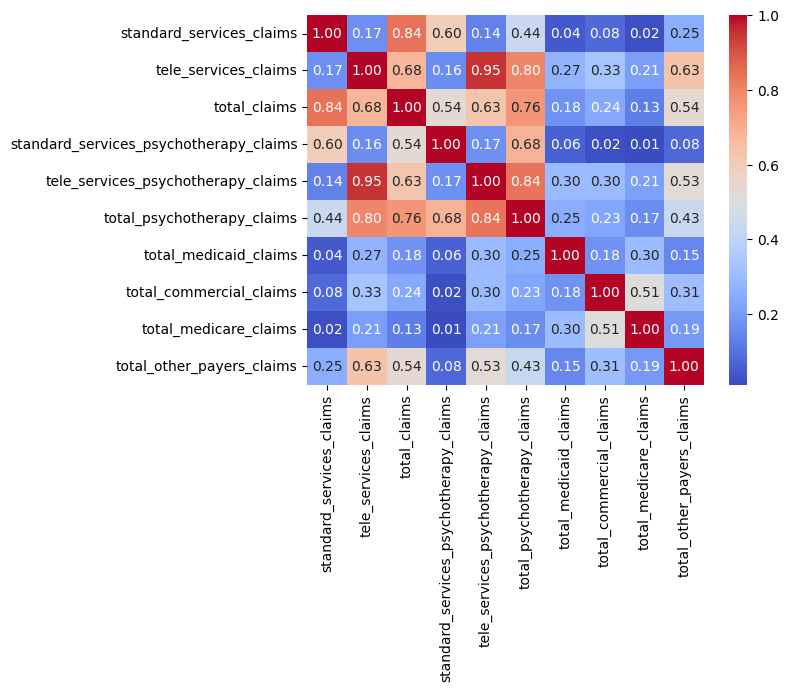

In [32]:
# exploring preliminary correlation matrix of columns
# columns with claims in the name 
corr_claims = data[claims_columns].corr()
sns.heatmap(corr_claims, cmap='coolwarm', fmt=".2f", annot=True)

<Axes: >

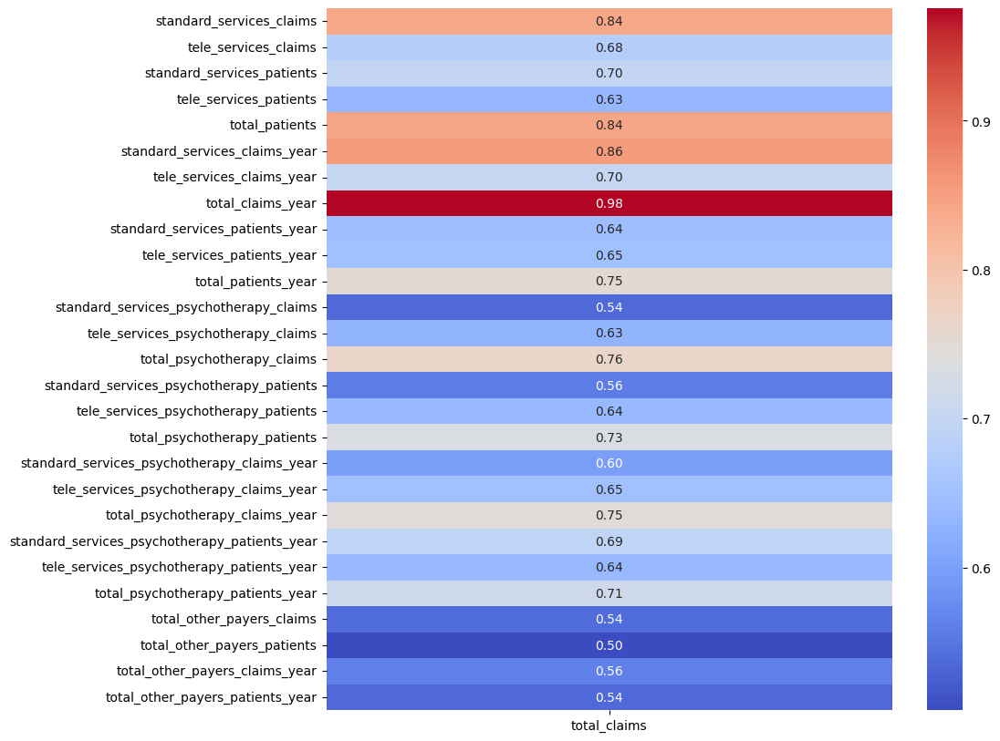

In [33]:
# exploring which columns are correlated with total_claims
numerical_cols = data.select_dtypes(include=np.number) #DO WE NEED THIS?
corr_total_claims = numerical_cols.corr()['total_claims']
corr_total_claims = corr_total_claims[corr_total_claims.abs() > 0.5]
corr_total_claims = corr_total_claims.drop('total_claims')
# make figure size bigger to see each cell clearly 
plt.figure(figsize=(10, 10))
sns.heatmap(corr_total_claims.to_frame(), cmap='coolwarm', annot=True, fmt=".2f")

In [34]:
categorical_cols = data.select_dtypes(include='object').columns
print(categorical_cols)

Index(['Healthcare_Provider_Taxonomy_Code_1', 'Grouping_1', 'Classification_1',
       'Specialization_1', 'Display_Name_1', 'countyname', 'urbanity',
       'provider_size', 'owner_identification', 'business_status',
       'working_hours_cleaned', 'Weekend Availability',
       'Availability Before 8AM', 'Availability After 5PM'],
      dtype='object')


## 3. Feature engineering <a id='3-fe'></a>

Exploring the specializations, classifications, and groupings.

In [35]:
grouped_specialization = data.groupby('Specialization_1')['total_claims'].sum()
grouped_specialization = grouped_specialization[grouped_specialization > grouped_specialization.mean()]

# makes the grouping as dataframes
df_specialization = grouped_specialization.reset_index(name='Sum of Total Claims')

Maybe we consider OHE the Grouping_1, Specialization_1, and Classification_1 columns with the top significant columns from each grouping, meaning they appear the most for total_claims breakdown.

In [36]:
top_specialization = df_specialization.sort_values(by='Sum of Total Claims', ascending=False).head(15)

#### 3.1 Specialization, groupings and classification

In [37]:
# Trying to impute the null values in the 'Specialization_1' column, we analyze the common text in the corresponding values of the first and third columns; if any part of the common text matches any of the existing specializations, we replace the null value with it; otherwise, we add the common text 

df_null_specialization_1 = data[data['Specialization_1'].isnull()][['Classification_1', 'Specialization_1', 'Display_Name_1']]

@lru_cache(maxsize=None)
def longest_common_substring(s1, s2):
    m = [[0] * (1 + len(s2)) for _ in range(1 + len(s1))]
    longest, x_longest = 0, 0
    for x in range(1, 1 + len(s1)):
        for y in range(1, 1 + len(s2)):
            if s1[x - 1] == s2[y - 1]:
                m[x][y] = m[x - 1][y - 1] + 1
                if m[x][y] > longest:
                    longest = m[x][y]
                    x_longest = x
            else:
                m[x][y] = 0
    return s1[x_longest - longest: x_longest]

unique_values = set(data['Specialization_1'].dropna().unique())

def common_substring(row):
    classification = str(row['Classification_1'])
    display_name = str(row['Display_Name_1'])
    common_string = longest_common_substring(classification, display_name)

    excluded_values = ['health', 'medical', 'registered', "children"]
    
    unique_values_matched = [value for value in unique_values
                             if value.lower() not in excluded_values
                             and value in common_string]
    if unique_values_matched:
        return ' '.join(unique_values_matched)  # if there are any matches within unique_values, we return them joined by a space
    else:
        return common_string  # else, we return the common_string itself

df_null_specialization_1['common_text'] = df_null_specialization_1.apply(common_substring, axis=1)
df_null_specialization_1['common_text'].head()

13           Family
14            Doula
18         Clinical
19    Social Worker
23       Pediatrics
Name: common_text, dtype: object

In [38]:
# Impute common_text values into Specialization_1 column of original data and output the new list of unique values
data_engineered = data.copy()
data_engineered.loc[df_null_specialization_1.index, 'Specialization_1'] = df_null_specialization_1['common_text']
unique_values_after_imputation = data_engineered['Specialization_1'].unique()

In [39]:
# Overview of the new specializations added
# Convert your arrays of unique values into sets
unique_values_after_imputation_set = set(unique_values_after_imputation)

# Get the new unique values after imputation by finding the set difference
new_unique_values = unique_values_after_imputation_set - unique_values

# Print the new unique values
print(list(new_unique_values))

['Respite Care', 'Nursing Facility/Intermediate Care Facility', 'Psychiatric Hospital', 'Dermatology', 'Chiropractor', 'Case Manager/Care Coordinator', 'Clinic/Center', 'Anesthesiology', 'Urology', 'Psychiatric Residential Treatment Facility', 'Non-Pharmacy Dispensing Site', 'Otolaryngology', 'Nutritionist', 'Occupational Therapy Assistant', 'Health Maintenance Organization', 'Exclusive Provider Organization', 'Developmentally Disabled Services', 'Surgery', 'Behavior Technician', 'Public Health or Welfare', 'Doula', 'General Acute Care Hospital', 'Respiratory Therapist', 'Developmental Therapist', 'Psychoanalyst', 'Psychiatric ', 'Internal Medicine', 'Ph.D. Medical Genetics', 'Pharmacist', 'Legal Medicine', 'Specialist', 'Dentist', 'Custodial Care Facility', 'Home Infusion', 'Medicare Defined Swing Bed ', 'Skilled Nursing Facility', 'Alzheimer Center (Dementia Center)', 'Optometrist', 'Advanced Practice Midwife', 'Health Educator', 'Military Hospital', 'Registered', 'Behavior', 'Studen

This list of values shows that the null values in the Specialization_1 column do not mean there was no Specialization for a reason, just that this information was missing.

In [40]:
# exploring Specialization_1 after imputation
grouped_specialization1 = data_engineered.groupby('Specialization_1')['total_claims'].sum()
# grouped_specialization1 = grouped_specialization1[grouped_specialization1 > grouped_specialization1.mean()]

df_specialization1 = grouped_specialization1.reset_index(name='Sum of Total Claims')

top_specialization1 = df_specialization1.sort_values(by='Sum of Total Claims', ascending=False).head(15)

In [41]:
# Comparing the ranking of significant specializations before and after imputations
for i in range(15):  # we are printing top 15, hence the range
    print(f"{i+1} | {bold}{top_specialization['Specialization_1'].iloc[i]}{reset}: {top_specialization['Sum of Total Claims'].iloc[i]} | {bold}{top_specialization1['Specialization_1'].iloc[i]}{reset}: {top_specialization1['Sum of Total Claims'].iloc[i]}")

1 | Clinical: 767474 | Clinical: 882715
2 | Mental Health: 547540 | Mental Health: 547540
3 | Professional: 475062 | Professional: 475062
4 | Psychiatry: 345573 | Psychiatry: 345573
5 | Addiction (Substance Use Disorder): 119066 | Family: 326884
6 | Pain Medicine: 43153 | Psychologist: 285669
7 | Adolescent and Children Mental Health: 38464 | Pediatrics: 153585
8 | Mental Health (Including Community Mental Health Center): 37101 | Counselor: 133788
9 | Counseling: 32075 | General Acute Care Hospital: 130204
10 | Family: 31065 | Addiction (Substance Use Disorder): 119066
11 | Psychiatric/Mental Health: 28853 | Community/Behavioral Health: 111725
12 | Pastoral: 25350 | Specialist: 79711
13 | VA: 24522 | Physician Assistant: 74433
14 | Child & Adolescent Psychiatry: 22451 | Internal Medicine: 73591
15 | Multi-Specialty: 21670 | Clinic/Center: 60295


Some values are similar and contain similar values like "Mental Health". Therefore, we explore the groups of values that share these words and then the others to see what other lists of values can be looked at.

In the overview of classifications above, we saw a high value of total claims for Counselor. Therefore, we explore the corresponding Specializations for this Classification below. Filter data where 'Classification_1' is 'Counselor'

In [42]:
filtered_data_counselor = data_engineered[data_engineered['Classification_1'] == 'Counselor'][['total_claims', 'Classification_1', 'Specialization_1','Display_Name_1']]

In [43]:
filtered_data_counselor.head()

,total_claims,Classification_1,Specialization_1,Display_Name_1
0,0,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor
1,0,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor
2,2,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor
3,6,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor
4,0,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor


In [44]:
# Get total sum of 'total_claims' for 'Counselor' classification
total_counselor_claims = filtered_data_counselor['total_claims'].sum()

# Group by 'Specialization_1' and sum 'total_claims'
grouped_specialization_claims = filtered_data_counselor.groupby('Specialization_1')['total_claims'].sum()

# Initialize an empty dictionary to hold the specializations and their percentages
specialization_percentages = {}

# Iterate over the grouped data
for specialization, total_specialization_claims in grouped_specialization_claims.items():
    # Calculate percentage
    percentage = (total_specialization_claims / total_counselor_claims) * 100

    # Add the specialization and its percentage to the dictionary
    specialization_percentages[specialization] = percentage

# Sort specialization_percentages by percentage, in descending order
sorted_specialization_percentages = dict(sorted(specialization_percentages.items(), key=lambda item: item[1], reverse=True))

# Print each specialization and its percentage
print("Specializations classified as 'Counselor':")
for specialization, percentage in sorted_specialization_percentages.items():
    print(f"{bold}{specialization}{reset}: {round(percentage,2)}%")

Specializations classified as 'Counselor':
Mental Health: 42.11%
Professional: 36.53%
Counselor: 10.29%
Addiction (Substance Use Disorder): 9.06%
Pastoral: 1.95%
School: 0.06%


This shows that the 'Counselor' classification applies to multiple categories, due to which we attribute all these specializations to Mental Health as well.

In [45]:
# Checking if the "Professional" specialization involves only counseling
filtered_df = data_engineered[(data_engineered['Specialization_1'] == 'Professional') &
                 (data_engineered['Classification_1'] != 'Counselor')]

In [46]:
# Checking if the "Addiction (Substance Use Disorder)" specialization involves only counseling
filtered_df1 = data[(data['Specialization_1'] == 'Addiction (Substance Use Disorder)') &
                    (data['Classification_1'] != 'Counselor')][['Classification_1','Specialization_1']]

filtered_df1.head()

,Classification_1,Specialization_1
6706,Psychologist,Addiction (Substance Use Disorder)
6750,Psychologist,Addiction (Substance Use Disorder)
11529,Psychologist,Addiction (Substance Use Disorder)
14970,Psychologist,Addiction (Substance Use Disorder)
17940,Psychologist,Addiction (Substance Use Disorder)


In [47]:
# Checking if the "Addiction Medicine" can also fall under Mental Health
filtered_df2 = data[data['Specialization_1'] == 'Addiction Medicine'][['Classification_1','Specialization_1']]
filtered_df2.head()

,Classification_1,Specialization_1
5908,Preventive Medicine,Addiction Medicine
6301,Preventive Medicine,Addiction Medicine
7260,Psychiatry & Neurology,Addiction Medicine
7486,Psychiatry & Neurology,Addiction Medicine
7492,Psychiatry & Neurology,Addiction Medicine


In [48]:
# Exploring the frequency of different specializations under Psychiatry & Neurology by calculating the % of total records each of them accounts for
filtered_df3 = data[data['Classification_1'] == 'Psychiatry & Neurology'][['Classification_1','Specialization_1','total_claims']]

total_records = filtered_df3.shape[0]

specialization_counts = filtered_df3['Specialization_1'].value_counts()
specialization_percentages = (specialization_counts / total_records) * 100
sorted_specialization_percentages = specialization_percentages.sort_values(ascending=False)

print("All specializations that are classified as Psychiatry & Neurology (with percentage of total records):")
for value, percentage in sorted_specialization_percentages.items():
    print(f"{bold}{value}{reset}: {round(percentage,2)}%")

All specializations that are classified as Psychiatry & Neurology (with percentage of total records):
Psychiatry: 77.68%
Child & Adolescent Psychiatry: 8.43%
Neurology: 6.42%
Addiction Medicine: 1.82%
Geriatric Psychiatry: 1.53%
Forensic Psychiatry: 0.96%
Addiction Psychiatry: 0.77%
Neuromuscular Medicine: 0.57%
Sleep Medicine: 0.57%
Clinical Neurophysiology: 0.48%
Neurology with Special Qualifications in Child Neurology: 0.38%
Pain Medicine: 0.29%
Psychosomatic Medicine: 0.1%


In [49]:
# Exploring the total claims per specialization under Psychiatry & Neurology
df3_total_claims = data[data['Classification_1'] == 'Psychiatry & Neurology'].groupby('Specialization_1')['total_claims'].sum()

sorted_total_claims = df3_total_claims.sort_values(ascending=False)

print("All specializations that are classified as Psychiatry & Neurology (with total claims):")
for specialization, total_claims in sorted_total_claims.items():
    print(f"{bold}{specialization}{reset}: {total_claims}")

All specializations that are classified as Psychiatry & Neurology (with total claims):
Psychiatry: 345573
Child & Adolescent Psychiatry: 22451
Addiction Medicine: 8067
Neurology: 6066
Geriatric Psychiatry: 4020
Addiction Psychiatry: 1408
Forensic Psychiatry: 1117
Sleep Medicine: 493
Neurology with Special Qualifications in Child Neurology: 311
Clinical Neurophysiology: 186
Pain Medicine: 135
Psychosomatic Medicine: 78
Neuromuscular Medicine: 66


The results above show that "Professional" involves counseling only, and "Addiction (Substance Use Disorder)" falls under counseling/psychology. Therefore, both specializations and could be also considered part of "Mental Health". Addiction Medicine could also be treated as "Mental Health", since in a vast majority of the cases, it is classified as Psychiatry & Neurology.

When we look at the Psychiatry & Neurology classification in general, we can see other specializations there like Neurology, Sleep Medicine, Pain Medicine, etc. Since it is hard to [draw the line between psychiatry and neurology](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1123428/), we consider all the specializations classified as such under Mental Health as well.

Finally, we include the following values under mental health: "Community/Behavioral Health", "Clinical Neurophysiology","Neurodevelopmental Disabilities", "Cognitive & Behavioral", "Behavior", "Behavior Technician", "Rehabilitation, Substance Use Disorder" ([Source1](https://www.thenationalcouncil.org/program/ccbhc-success-center/ccbhc-overview/), [Source2](https://www.kcl.ac.uk/research/mental-health-problems-in-neurodevelopmental-disorders#:~:text=Children%20and%20adolescents%20with%20neurodevelopmental,be%20recognized%2C%20diagnosed%20and%20treated.)). This is done below.

In [50]:
# In addition to combining different mental-health-related specializations, we look at the sorted number of total claims
# per specialization and the total mental-health-related claims vs. non-mental-health claims
# The phrases or string patterns we're looking for:
search_phrases = ["mental health", "psych", "professional", "counselor", "counseling", "addiction",
                  "community/behavioral health", "clinical neurophysiology", "neurodevelopmental disabilities",
                  "cognitive & behavioral", "behavior", "behavior technician", "rehabilitation, substance use disorder"]

# Initialize the lists for matching and non-matching values
matching_values = []
non_matching_values = []

# Iterate over all unique values
for value in unique_values_after_imputation:
    lower_value = str(value).lower()
    
    # Check if any of the phrases is in 'value'
    if any(phrase in lower_value for phrase in search_phrases):
        matching_values.append(value)
    else:
        non_matching_values.append(value)

# Add to matching_values where Classification_1 is Psychiatry & Neurology and not in exclude_specializations
more_matching_values = data_engineered[data_engineered['Classification_1'] == 'Psychiatry & Neurology']['Specialization_1'].unique()
matching_values.extend(more_matching_values)

non_matching_values = list(set(non_matching_values) - set(more_matching_values))

category_total_claims = {}
    
matching_sum = data_engineered[data_engineered['Specialization_1'].isin(matching_values)]['total_claims'].sum()
non_matching_sum = data_engineered[data_engineered['Specialization_1'].isin(non_matching_values)]['total_claims'].sum()

print(f"Sum of 'total_claims' for {bold}mental-health-related claims{reset}: {matching_sum} | {round(matching_sum/(matching_sum+non_matching_sum)*100,2)}% of total claims.")
print(f"Sum of 'total_claims' for {bold}non-mental-health claims{reset}: {non_matching_sum} | {round(non_matching_sum/(matching_sum+non_matching_sum)*100,2)}% of total claims.")

# Iterate over all matching values (mental health categories)
for category in matching_values:
    total_claims = data_engineered[data_engineered['Specialization_1'] == category]['total_claims'].sum()

    category_total_claims[category] = total_claims

sorted_category_total_claims = dict(sorted(category_total_claims.items(), key=lambda item: item[1], reverse=True))

print("\nBreakdown of mental health categories (total claims sum):")
for category, total_claims in sorted_category_total_claims.items():
    print(f"{bold}{category}{reset}: {total_claims}")

Sum of 'total_claims' for mental-health-related claims: 2300577 | 51.01% of total claims.
Sum of 'total_claims' for non-mental-health claims: 2209621 | 48.99% of total claims.

Breakdown of mental health categories (total claims sum):
Mental Health: 547540
Professional: 475062
Psychiatry: 345573
Psychologist: 285669
Counselor: 133788
Addiction (Substance Use Disorder): 119066
Community/Behavioral Health: 111725
Pain Medicine: 43153
Adolescent and Children Mental Health: 38464
Mental Health (Including Community Mental Health Center): 37101
Counseling: 32075
Psychiatric/Mental Health: 28853
Child & Adolescent Psychiatry: 22451
Psychiatric Hospital: 14578
Adult Mental Health: 11148
Psychiatric Residential Treatment Facility: 11098
Addiction Medicine: 8740
Neurology: 6066
Behavior: 6013
Psychiatric : 4471
Geriatric Psychiatry: 4020
Psychiatric/Mental Health, Adult: 2251
Behavior Technician: 1937
Rehabilitation, Substance Use Disorder: 1768
Group Psychotherapy: 1500
Addiction Psychiatry: 14

In [51]:
# Creating a Mental Health column
data_engineered['mental_health'] = data_engineered['Specialization_1'].isin(matching_values).astype(int)

In [52]:
data_engineered['mental_health'].value_counts()

mental_health
0    50724
1    34712
Name: count, dtype: int64

In [53]:
data_engineered['specialization_group'] = data_engineered['Specialization_1'].apply(lambda x: specialization_dict.get(x, 'mental_health'))

In [54]:
# Checking the number of claims per Specialization Group
grouped_claims = data_engineered.groupby('specialization_group')['total_claims'].sum()
sorted_grouped_claims = grouped_claims.sort_values(ascending=False)

for group, total in sorted_grouped_claims.items():
    print(f"{bold}{group}{reset}: {total}")

mental_health: 2300577
Multi-Specialty Groups and Organizations: 1010253
Primary Care and General Practice: 440515
Facility-Based Services: 279368
Pediatrics: 174327
Internal Medicine and Specialties: 93726
Community and Social Services: 58698
Specialized and Allied Health Services: 45400
Emergency and Critical Care: 42874
Rehabilitation and Therapy: 28955
Primary Care and General: 13408
Women Health: 10702
Surgery and Related Specialties: 6998
Public Health and Preventive Medicine: 2959
Medical Imaging and Radiology: 1438


#### 3.2 Working hours

In this section we'll deal with the columns "business_status", "Weekend Availability", "Availability Before 8AM", "Availability After 5PM"

Let's check the unavailable data.

In [55]:
columns = [
    "business_status",
    "Weekend Availability",
    "Availability Before 8AM",
    "Availability After 5PM"
]

unavailable_df = data_engineered[columns]

Checking if the rows where 'business_status' is 'Info Not Available' has the same value in the following columns as well:

In [56]:
info_not_available_df = data_engineered[data_engineered['business_status'] == 'Info Not Available']

columns_to_check = [
    "Weekend Availability",
    "Availability Before 8AM",
    "Availability After 5PM"
]

same_values = all(
    info_not_available_df[col].nunique() <= 1 for col in columns_to_check
)

print(f"All rows with 'Info Not Available' in 'business_status' have the same values in other indicated columns: {bold}{same_values}{reset}")

All rows with 'Info Not Available' in 'business_status' have the same values in other indicated columns: True


We create a separate column 'working_hours_owner_missing_info' that will correspond to all the rows for the four columns above

In [57]:
data_engineered['working_hours_owner_missing_info'] = (data_engineered['business_status'] == 'Info Not Available').astype(int)

In [58]:
data_engineered['working_hours_owner_missing_info'].value_counts()

working_hours_owner_missing_info
1    55560
0    29876
Name: count, dtype: int64

Lets make the column "business_status" more simple by joining "closed" status, since there are not a lot with "closed temporarily"

In [59]:
data_engineered["business_status"].value_counts()

business_status
Info Not Available    55560
OPERATIONAL           27584
CLOSED_PERMANENTLY     2188
CLOSED_TEMPORARILY      104
Name: count, dtype: int64

In [60]:
# Replace values
data_engineered['business_status'] = data_engineered['business_status'].replace({
    'CLOSED_PERMANENTLY': 'CLOSED',
    'CLOSED_TEMPORARILY': 'CLOSED'})

In [61]:
data_engineered['business_status'].value_counts()

business_status
Info Not Available    55560
OPERATIONAL           27584
CLOSED                 2292
Name: count, dtype: int64

Let's deal with the other columns

In [62]:
data_engineered["Availability Before 8AM"].value_counts()

Availability Before 8AM
Info Not Available    55560
No                    27972
Yes                    1904
Name: count, dtype: int64

In [63]:
data_engineered["Availability After 5PM"].value_counts()

Availability After 5PM
Info Not Available    55560
No                    24792
Yes                    5084
Name: count, dtype: int64

In [64]:
data_engineered["Weekend Availability"].value_counts()

Weekend Availability
Info Not Available    55560
No                    27244
Yes                    1372
Only Saturday          1244
Only Sunday              16
Name: count, dtype: int64

Since "Only Sunday" holds a few records, lets just turn everything into something like "partially" available

In [65]:
data_engineered['Weekend Availability'] = data_engineered['Weekend Availability'].replace({
    'Only Saturday': 'Partially',
    'Only Sunday': 'Partially'})

#### 3.3 Ownership

In [66]:
data_engineered['black_owned'].value_counts()

black_owned
0    85320
1      116
Name: count, dtype: int64

In [67]:
data_engineered['latino_owned'].value_counts()

latino_owned
0    85424
1       12
Name: count, dtype: int64

In [68]:
data_engineered['lgbtq+_owned'].value_counts()

lgbtq+_owned
0    85428
1        8
Name: count, dtype: int64

In [69]:
data_engineered['veteran_owned'].value_counts()

veteran_owned
0    85384
1       52
Name: count, dtype: int64

In [70]:
data_engineered['women_owned'].value_counts()

women_owned
0    84756
1      680
Name: count, dtype: int64

In [71]:
data_engineered['owner_identification'].value_counts()

owner_identification
Info Not Available           84724
Women Owned                    544
Black Women Owned              108
Veteran Owned                   24
Veteran Women Owned             24
Latino Owned                     4
Black Veteran Women Owned        4
Black Owned                      4
Name: count, dtype: int64

Checking the consistency in missing values between ownership and working hours

In [72]:
columns_to_check = ["owner_identification"]

same_values = all(
    info_not_available_df[col].nunique() <= 1 for col in columns_to_check
)

print(f"All rows with 'Info Not Available' in 'business_status' have the same values in other indicated columns: {bold}{same_values}{reset}")

All rows with 'Info Not Available' in 'business_status' have the same values in other indicated columns: True


Since we created the column with "is missing" for the working hours and it is consistent on those columns, I'll create a variable that tells if it is minority owned of not

In [73]:
data_engineered['minority_owned'] = data_engineered['owner_identification'].apply(
    lambda x: 0 if x == 'Info Not Available' else 1
)

In [74]:
data_engineered['minority_owned'].value_counts()

minority_owned
0    84724
1      712
Name: count, dtype: int64

#### 3.4 Languages spoken

The same happens with the number of languages. If the info is missing on the other columns, this value is 0 or 23, which is very weird. I believe it is an error, therefore I’ll correct 23 to 0 and treat as missing value.

In [75]:
check = data_engineered[['business_status', 'Spoken_Language_Accessibility']]

check = check.loc[check['business_status'] == 'Info Not Available', :]

check['Spoken_Language_Accessibility'].value_counts()

Spoken_Language_Accessibility
0     55176
23      384
Name: count, dtype: int64

In [76]:
data_engineered['Spoken_Language_Accessibility'].value_counts()

Spoken_Language_Accessibility
0     84356
23      660
1       372
2        40
3         8
Name: count, dtype: int64

Check if the ones that only speak 1 language is actually english.

In [77]:
check_2 = data_engineered.loc[data_engineered['Spoken_Language_Accessibility'] == 1, :]

In [78]:
check_2['EN_English'].value_counts()

EN_English
1    272
0    100
Name: count, dtype: int64

It is not the case, so I'll do the following: I'll subtract 1 from the "Spoken_Language_Accessibility" in the case of one of the languages being English and I'll convert 23 to 0, since I believe it is an error.

In [79]:
# Subtract 1 from Spoken_Language_Accessibility if EN_English is 1
data_engineered['extra_languages_spoken'] = data_engineered.apply(
    lambda row: row['Spoken_Language_Accessibility'] - 1 if row['EN_English'] == 1 else row['Spoken_Language_Accessibility'], 
    axis=1
)

In [80]:
data_engineered['extra_languages_spoken'] = data_engineered['extra_languages_spoken'].replace(23, 0)

#### 3.5 Providers per county

Creating providers per county (the number of providers per county for the year of the record: it would be the number of providers for the respective country for that year)

In [81]:
# Create grouped dataframes
provider_group = data_engineered.groupby('npi')
county_group = data_engineered.groupby('countyID')

In [82]:
# Get the number of providers per county for each year
providers_per_county_year = data_engineered.groupby(['countyID', 'service_year'])['npi'].nunique()

# This is a multi-index series (i.e., series with multiple indices: countyID and Year)
# So we will reset its index to make it a DataFrame, making it easier to merge with the original data
providers_per_county_year = providers_per_county_year.reset_index()
providers_per_county_year.rename(columns={'npi': 'providers_per_county'}, inplace=True)

# Merge this DataFrame with the original data to get the providers per county for the respective year in each record
data_engineered = pd.merge(data_engineered, providers_per_county_year, on=['countyID', 'service_year'], how='left')

In [83]:
# Checking if the new columns have been added to the DataFrame and view their first few rows:
data_engineered[['npi', 'countyID', 'providers_per_county']].head(10)

,npi,countyID,providers_per_county
0,1,51,461
1,1,51,461
2,1,51,461
3,1,51,461
4,1,51,332
5,1,51,332
6,7,101,80
7,8,119,1402
8,9,119,1402
9,10,49,74


In [84]:
# Statistical summaries of the new columns:
data_engineered[['providers_per_county']].describe()

,providers_per_county
count,85436.000000
mean,437.395805
std,392.314279
min,1.000000
25%,91.000000
50%,356.000000
75%,683.000000
max,1402.000000


In [85]:
# Manually checking whether Providers per county were calculated correctly, based on countyID 39
selected_data = data_engineered[(data_engineered['countyID'] == 39) & (data_engineered['service_year']==2020)][['npi', 'service_year', 'total_claims', 'total_patients', 'providers_per_county']]
selected_data.head(10)

,npi,service_year,total_claims,total_patients,providers_per_county
46,45,2020,0,0,8
145,45,2020,0,0,8
461,45,2020,0,0,8
1057,554,2020,0,0,8
1088,577,2020,0,0,8
1096,554,2020,0,0,8
1150,577,2020,0,0,8
1509,867,2020,0,0,8
1566,867,2020,0,0,8
2271,577,2020,0,0,8


In [86]:
# counting unique npi for selected_data 
print(f"Number of unique NPIs in the selected data: {selected_data['npi'].nunique()}")
print(f"Unique NPIs in the selected data: {selected_data['npi'].unique()}")

Number of unique NPIs in the selected data: 8
Unique NPIs in the selected data: [  45  554  577  867 3557 5356 5357 6460]


#### 3.6 Date feature

In [87]:
data_engineered['year_quarter'] = data_engineered['service_year'].astype(str) + ' Q' + data_engineered['service_quarter'].astype(str)

#### 3.7 Lagged variables

Total claims

In [88]:
# Ensure the DataFrame is sorted by 'npi' and 'year_quarter'
data_engineered = data_engineered.sort_values(by=['npi', 'year_quarter'])

# Create lagged variables for 'total_claims'
data_engineered['total_claims_lag1'] = data_engineered.groupby('npi')['total_claims'].shift(1)
data_engineered['total_claims_lag2'] = data_engineered.groupby('npi')['total_claims'].shift(2)

Confirming that the lag creation was performed correction for an example of a provider with 12 records

In [89]:
data_engineered[data_engineered["npi"] == 839][["service_year", "service_quarter","total_claims", "total_claims_lag1", "total_claims_lag2"]]

,service_year,service_quarter,total_claims,total_claims_lag1,total_claims_lag2
77350,2018,1,17,NaN,NaN
69247,2018,2,1,17.0,NaN
69185,2018,3,3,1.0,17.0
69356,2018,4,1,3.0,1.0
41334,2019,1,0,1.0,3.0
41236,2019,2,0,0.0,1.0
48813,2019,3,2,0.0,0.0
51521,2019,4,4,2.0,0.0
12407,2020,1,3,4.0,2.0
1476,2020,2,0,3.0,4.0


Teleservices and standard claims

We are trying to do this without vectors. If we use vectors, we could apply PCA or create embeddings.

In [90]:
# Create lagged variables for 'standard_services_claims'
data_engineered['standard_services_claims_lag1'] = data_engineered.groupby('npi')['standard_services_claims'].shift(1)
data_engineered['standard_services_claims_lag2'] = data_engineered.groupby('npi')['standard_services_claims'].shift(2)

In [91]:
# Create lagged variables for 'tele_services_claims'
data_engineered['tele_services_claims_lag1'] = data_engineered.groupby('npi')['tele_services_claims'].shift(1)
data_engineered['tele_services_claims_lag2'] = data_engineered.groupby('npi')['tele_services_claims'].shift(2)

In [92]:
# Create lagged variables for 'total_psychotherapy_claims'
data_engineered['total_psychotherapy_claims_lag1'] = data_engineered.groupby('npi')['total_psychotherapy_claims'].shift(1)
data_engineered['total_psychotherapy_claims_lag2'] = data_engineered.groupby('npi')['total_psychotherapy_claims'].shift(2)

In [93]:
# Create a column for total_non_psychotherapy_claims
data_engineered['total_non_psychotherapy_claims'] = data_engineered['total_claims'] - data_engineered['total_psychotherapy_claims']

In [94]:
# Create lagged variables for 'total_non_psychotherapy_claims'
data_engineered['total_non_psychotherapy_claims_lag1'] = data_engineered.groupby('npi')['total_non_psychotherapy_claims'].shift(1)
data_engineered['total_non_psychotherapy_claims_lag2'] = data_engineered.groupby('npi')['total_non_psychotherapy_claims'].shift(2)

In [95]:
# Create lagged variables for 'standard_services_psychotherapy_claims'
data_engineered['standard_services_psychotherapy_claims_lag1'] = data_engineered.groupby('npi')['standard_services_psychotherapy_claims'].shift(1)
data_engineered['standard_services_psychotherapy_claims_lag2'] = data_engineered.groupby('npi')['standard_services_psychotherapy_claims'].shift(2)

In [96]:
# Create lagged variables for 'tele_services_claims'
data_engineered['tele_services_psychotherapy_claims_lag1'] = data_engineered.groupby('npi')['tele_services_psychotherapy_claims'].shift(1)
data_engineered['tele_services_psychotherapy_claims_lag2'] = data_engineered.groupby('npi')['tele_services_psychotherapy_claims'].shift(2)

In [97]:
data_engineered[['tele_services_claims','tele_services_psychotherapy_claims',]]

,tele_services_claims,tele_services_psychotherapy_claims
199,0,0
130,0,0
165,0,0
331,0,0
54,2,2
...,...,...
85342,0,0
85410,588,0
85394,483,0
85396,529,0


#### 3.8 Dropping features

In [98]:
data_engineered_filtered = data_engineered.copy()

In [99]:
data_engineered_filtered.columns

Index(['npi', 'countyID', 'census_tract', 'zip5', 'service_year',
       'service_quarter', 'standard_services_claims', 'tele_services_claims',
       'total_claims', 'standard_services_patients',
       ...
       'tele_services_claims_lag2', 'total_psychotherapy_claims_lag1',
       'total_psychotherapy_claims_lag2', 'total_non_psychotherapy_claims',
       'total_non_psychotherapy_claims_lag1',
       'total_non_psychotherapy_claims_lag2',
       'standard_services_psychotherapy_claims_lag1',
       'standard_services_psychotherapy_claims_lag2',
       'tele_services_psychotherapy_claims_lag1',
       'tele_services_psychotherapy_claims_lag2'],
      dtype='object', length=136)

Dropping useless columns

In [100]:
data_engineered_filtered = data_engineered_filtered.drop(columns=[
    'owner_identification','countyID', 'zip5', 'Healthcare_Provider_Taxonomy_Code_1', 'Classification_1', 'Display_Name_1', 'standard_services_patients', 
    'tele_services_patients', '%psychotherapy_patients', '%stdService_patients', '%teleService_patients', '%tele_psychotherapy_patients', 
    'total_patients', 'standard_services_patients_year', 'tele_services_patients_year', 'total_patients_year', 'standard_services_psychotherapy_patients_year', 
    'tele_services_psychotherapy_patients_year', 'total_psychotherapy_patients_year', '%psychotherapy_patients_year', '%stdService_patients_year', '%teleService_patients_year', 'standard_services_psychotherapy_patients', 'tele_services_psychotherapy_patients', 'total_psychotherapy_patients', 'total_medicaid_patients',
    '%tele_psychotherapy_patients_year', 'psychotherapy_provider_through_taxonomy', 'provided_psychotherapy', 'psychotherapy_provider', 'lat', 'long', 'working_hours_cleaned', 'total_commercial_patients', 'total_medicare_patients', 
    'total_other_payers_patients', 'total_commercial_patients_year', 'total_medicaid_patients_year', 'total_medicare_patients_year', 'total_other_payers_patients_year'])

Dropping columns related to claims

In [101]:
data_saving_claims = data_engineered_filtered.copy()

In [102]:
data_engineered_filtered = data_engineered_filtered.drop(columns=['standard_services_psychotherapy_claims', 'tele_services_psychotherapy_claims', 'standard_services_claims_year', 
    'tele_services_claims_year', 'total_claims_year', 'total_psychotherapy_claims', 'total_non_psychotherapy_claims', 'standard_services_psychotherapy_claims_year', 'tele_services_psychotherapy_claims_year', 
    'total_psychotherapy_claims_year', 'total_commercial_claims_year', 'total_medicaid_claims_year', 'total_medicare_claims_year', 'total_other_payers_claims_year'])

Dropping columns related to % of claims

In [103]:
data_engineered_filtered = data_engineered_filtered.drop(columns=['%psychotherapy_claims', '%teleService_claims', '%tele_psychotherapy_claims',
    '%psychotherapy_claims_year', '%teleService_claims_year', '%tele_psychotherapy_claims_year'])

Dropping columns that we'll maybe use

In [104]:
data_engineered_filtered = data_engineered_filtered.drop(columns=['black_owned', 'latino_owned', 'lgbtq+_owned', 'veteran_owned', 'women_owned'])

In [105]:
data_engineered_filtered = data_engineered_filtered.drop(columns=[
    'AH_Sign language services for the deaf and hard of hearing', 'EN_English', 'SP_Spanish', 'NX_American Indian or Alaska Native languages', 
    'FX_Other languages (excluding Spanish)', 'F4_Arabic', 'F17_Any Chinese Language', 'F19_Creole', 'F25_Farsi', 'F28_French', 'F30_German', 'F31_Greek', 'F35_Hebrew', 
    'F36_Hindi', 'F37_Hmong', 'F42_Italian', 'F43_Japanese', 'F47_Korean', 'F66_Polish', 'F67_Portuguese', 'F70_Russian', 'F81_Tagalog', 'F92_Vietnamese', 
    'N24_Ojibwa', 'N40_Yupik', 'Spoken_Language_Accessibility'])

In [106]:
data_engineered_filtered = data_engineered_filtered.drop(columns=['census_tract', 'Specialization_1'])

In [107]:
# dropping the services original column
data_engineered_filtered = data_engineered_filtered.drop(columns=['tele_services_claims', 'standard_services_claims'])

Dropping inconsistent claim columns

In [108]:
data_engineered_filtered = data_engineered_filtered.drop(columns=['total_medicaid_claims', 'total_commercial_claims', 'total_medicare_claims', 'total_other_payers_claims'])

Checking the lagged variable columns

In [109]:
# Check how many rows have 0 on two lags for 'total_claims'
total_claims_lag1_zero = (data_engineered_filtered['total_claims_lag1'] == 0).sum()
total_claims_lag2_zero = (data_engineered_filtered['total_claims_lag2'] == 0).sum()
both_total_claims_lags_zero = ((data_engineered_filtered['total_claims_lag1'] == 0) & (data_engineered_filtered['total_claims_lag2'] == 0)).sum()

print(f"Rows with 0 on total_claims_lag1: {total_claims_lag1_zero}")
print(f"Rows with 0 on total_claims_lag2: {total_claims_lag2_zero}")
print(f"Rows with 0 on both total_claims_lags: {both_total_claims_lags_zero}")

Rows with 0 on total_claims_lag1: 14921
Rows with 0 on total_claims_lag2: 12382
Rows with 0 on both total_claims_lags: 6629


## 4. Encoding

In [110]:
data_encoded = data_engineered_filtered.copy()

In [111]:
# data_encoded = data_encoded.fillna(0) # to keep the rows with NaNs for lags but replace them with 0
data_encoded = data_encoded.dropna() # to drop the rows with NaNs for lags

In [112]:
data_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 62670 entries, 165 to 85408
Data columns (total 37 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   npi                                          62670 non-null  int64  
 1   service_year                                 62670 non-null  int64  
 2   service_quarter                              62670 non-null  int64  
 3   total_claims                                 62670 non-null  int64  
 4   Grouping_1                                   62670 non-null  object 
 5   countyname                                   62670 non-null  object 
 6   urbanity                                     62670 non-null  object 
 7   transport_access                             62670 non-null  float64
 8   broadband_access                             62670 non-null  float64
 9   provider_size                                62670 non-null  object 
 10  E

#### 4.1 Encoding categoricals

In [113]:
data_encoded['business_status'] = data_encoded['business_status'].replace({
    'Info Not Available': 0,
    'CLOSED': 0,
    'OPERATIONAL': 1})

In [114]:
data_encoded['weekend_availability'] = data_encoded['Weekend Availability'].replace({
    'Info Not Available': 0,
    'No': 0,
    'Partially': 1,
    'Yes': 2})

data_encoded = data_encoded.drop(columns='Weekend Availability')

# another option
#data_encoded['Weekend Availability'] = data_encoded['Weekend Availability'].replace({
#    'Info Not Available': 0,
#    'No': 0,
#    'Partially': 1,
#    'Yes': 1})

In [115]:
data_encoded['availability_after_5pm'] = data_encoded['Availability After 5PM'].replace({
    'Info Not Available': 0,
    'No': 0,
    'Yes': 1})

data_encoded = data_encoded.drop(columns='Availability After 5PM')

In [116]:
data_encoded['availability_before_8am'] = data_encoded['Availability Before 8AM'].replace({
    'Info Not Available': 0,
    'No': 0,
    'Yes': 1})

data_encoded = data_encoded.drop(columns='Availability Before 8AM')

In [117]:
data_encoded['provider_size'].value_counts()

provider_size
Small    61938
Big        732
Name: count, dtype: int64

In [118]:
data_encoded['provider_size'] = data_encoded['provider_size'].replace({
    'Small': 0,
    'Big': 1})

# another option
#data_encoded['provider_size'] = data_encoded['provider_size'].replace({
#    'Small': 1,
#    'Big': 2})

In [119]:
data_encoded = pd.get_dummies(data_encoded, columns=['Grouping_1'], prefix='grouping_1')

In [120]:
# we can dummy encode or leave it scalar as it is...

# data_encoded = pd.get_dummies(data_encoded, columns=['Entity_Type_Code'], prefix='Entity_Type_Code')

In [121]:
data_encoded = pd.get_dummies(data_encoded, columns=['urbanity'], prefix='urbanity')

In [122]:
data_encoded = pd.get_dummies(data_encoded, columns=['specialization_group'], prefix='specialization_group')

Renaming some columns for coherence

In [123]:
data_encoded = data_encoded.rename(columns={'Entity_Type_Code': 'entity_type_code', 'countyname': 'county_name'})

In [124]:
# encode county_name by target encoding - target is type of claim so we'll need to create a target vector or two models - and we can only do that when we have the target variable and know how to split in train and test
# also need to think how to drop rows.. should we really drop ones that had zeros on the lags?

Row analysis: We will see if the 0s are significant for any providers that are inactive, holding all 0s for all data. If any provider has all 0 values for claims across all the data, we will drop this provider and cross check with the inactive variable.

In [125]:
# grouping by npi and checking if any provider has zero claims for more than 74% of the quarters

zero_claims_percentage = data_encoded.groupby('npi')['total_claims'].apply(lambda x: (x == 0).mean())
zero_claims_percentage = zero_claims_percentage[zero_claims_percentage > 0.74]

print(f"Number of providers with zero claims for more than 74% of the quarters: {zero_claims_percentage.shape[0]}")

Number of providers with zero claims for more than 74% of the quarters: 882


In [126]:
# exploring if for the providers with zero claims for many quarters, if they have zero claims for the last quarter
zero_claims_last_quarter = data_encoded[(data_encoded['service_quarter'] == 'Q4') & (data_encoded['service_year']==2020)].groupby('npi')['total_claims'].sum()
zero_claims_last_quarter = zero_claims_last_quarter[zero_claims_last_quarter == 0]

print(f"Number of providers with zero claims for the last quarter: {zero_claims_last_quarter.shape[0]}")

Number of providers with zero claims for the last quarter: 0


In [127]:
# how many rows have 0 for total_claims 
zero_claims = (data_encoded['total_claims'] == 0).sum()
print(f"Rows with 0 on total_claims: {zero_claims}/{data_encoded.shape[0]}")

Rows with 0 on total_claims: 9588/62670


Reminder: 'Info Not Available' and 'CLOSED' = 0, 'OPERATIONAL' = 1 for business_status

In [128]:
# checking if rows of 0s for total_claims correspond to business_status variable 
zero_claims_business_status = data_encoded[data_encoded['total_claims'] == 0]['business_status'].value_counts()
print(f"Business status for rows with 0 on total_claims: {zero_claims_business_status}")

Business status for rows with 0 on total_claims: business_status
0    6751
1    2837
Name: count, dtype: int64


Is there ever a situation where the business is closed and then comes back to operational?

In [129]:
# parse through rows for each provider and see if business_status = 0 and then returns to 1 in a latter row (latter quarter and year)
# and if the total_claims are not 0?
# If so, we can assume that the provider was closed and then reopened, and the 0s are meaningful.

for npi in data_encoded['npi'].unique():
    provider_data = data_encoded[data_encoded['npi'] == npi]
    # make sure provider data is ordered by year and quarter
    provider_data = provider_data.sort_values(by=['service_year', 'service_quarter'])
    for i in range(1, len(provider_data)):
        if provider_data['business_status'].iloc[i-1] == 0 and provider_data['business_status'].iloc[i] == 1:
            print(f"Provider {npi} has business_status = 0 and then returns to 1 in a latter row")

Resetting the index to be the npi for modeling purposes.

In [130]:
data_encoded = data_encoded.set_index('npi')
data_encoded.head()

,service_year,service_quarter,total_claims,county_name,transport_access,broadband_access,provider_size,entity_type_code,planning_accepts_new_patients,business_status,mental_health,working_hours_owner_missing_info,minority_owned,extra_languages_spoken,providers_per_county,year_quarter,total_claims_lag1,total_claims_lag2,standard_services_claims_lag1,standard_services_claims_lag2,tele_services_claims_lag1,tele_services_claims_lag2,total_psychotherapy_claims_lag1,total_psychotherapy_claims_lag2,total_non_psychotherapy_claims_lag1,total_non_psychotherapy_claims_lag2,standard_services_psychotherapy_claims_lag1,standard_services_psychotherapy_claims_lag2,tele_services_psychotherapy_claims_lag1,tele_services_psychotherapy_claims_lag2,weekend_availability,availability_after_5pm,availability_before_8am,grouping_1_Agencies,grouping_1_Allopathic & Osteopathic Physicians,grouping_1_Ambulatory Health Care Facilities,grouping_1_Behavioral Health & Social Service Providers,grouping_1_Chiropractic Providers,grouping_1_Dental Providers,grouping_1_Dietary & Nutritional Service Providers,grouping_1_Eye and Vision Services Providers,grouping_1_Hospital Units,grouping_1_Hospitals,grouping_1_Laboratories,grouping_1_Managed Care Organizations,grouping_1_Nursing & Custodial Care Facilities,grouping_1_Nursing Service Providers,grouping_1_Nursing Service Related Providers,grouping_1_Other Service Providers,grouping_1_Pharmacy Service Providers,grouping_1_Physician Assistants & Advanced Practice Nursing Providers,grouping_1_Podiatric Medicine & Surgery Service Providers,grouping_1_Residential Treatment Facilities,"grouping_1_Respiratory, Developmental, Rehabilitative and Restorative Service Providers",grouping_1_Respite Care Facility,"grouping_1_Speech, Language and Hearing Service Providers","grouping_1_Student, Health Care",grouping_1_Suppliers,grouping_1_Transportation Services,urbanity_Rural,urbanity_Urban,specialization_group_Community and Social Services,specialization_group_Emergency and Critical Care,specialization_group_Facility-Based Services,specialization_group_Internal Medicine and Specialties,specialization_group_Medical Imaging and Radiology,specialization_group_Multi-Specialty Groups and Organizations,specialization_group_Pediatrics,specialization_group_Primary Care and General,specialization_group_Primary Care and General Practice,specialization_group_Public Health and Preventive Medicine,specialization_group_Rehabilitation and Therapy,specialization_group_Specialized and Allied Health Services,specialization_group_Surgery and Related Specialties,specialization_group_Women Health,specialization_group_mental_health
npi,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,2018,3,2,Cumberland,0.9,0.71,0,1,0,0,1,1,0,0,239,2018 Q3,1.0,8.0,1.0,8.0,0.0,0.0,1.0,8.0,0.0,0.0,1.0,8.0,0.0,0.0,0,0,0,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,2018,4,5,Cumberland,0.9,0.71,0,1,0,0,1,1,0,0,239,2018 Q4,2.0,1.0,2.0,1.0,0.0,0.0,2.0,1.0,0.0,0.0,2.0,1.0,0.0,0.0,0,0,0,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,2019,1,14,Cumberland,0.9,0.78,0,1,0,0,1,1,0,0,332,2019 Q1,5.0,2.0,5.0,2.0,0.0,0.0,5.0,2.0,0.0,0.0,5.0,2.0,0.0,0.0,0,0,0,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,2019,2,13,Cumberland,0.9,0.78,0,1,0,0,1,1,0,0,332,2019 Q2,14.0,5.0,12.0,5.0,2.0,0.0,14.0,5.0,0.0,0.0,12.0,5.0,2.0,0.0,0,0,0,False,False,F

## 5. Prepare for modelling <a id='5-prep'></a>

#### 5.1 Checks of prepared data <a id='51-checks'></a>

In [131]:
data_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 62670 entries, 1 to 11383
Data columns (total 76 columns):
 #   Column                                                                                   Non-Null Count  Dtype  
---  ------                                                                                   --------------  -----  
 0   service_year                                                                             62670 non-null  int64  
 1   service_quarter                                                                          62670 non-null  int64  
 2   total_claims                                                                             62670 non-null  int64  
 3   county_name                                                                              62670 non-null  object 
 4   transport_access                                                                         62670 non-null  float64
 5   broadband_access                                                 

In [132]:
data_encoded['year_quarter'].value_counts()

year_quarter
2020 Q3    8920
2020 Q4    8920
2019 Q3    6993
2019 Q4    6993
2020 Q1    5830
2020 Q2    5830
2018 Q3    5446
2018 Q4    5446
2019 Q1    4146
2019 Q2    4146
Name: count, dtype: int64

In [133]:
# we have this information in service_year and service_quarter so we can drop this column
data_encoded = data_encoded.drop(columns='year_quarter')

In [134]:
data_encoded.head()

,service_year,service_quarter,total_claims,county_name,transport_access,broadband_access,provider_size,entity_type_code,planning_accepts_new_patients,business_status,mental_health,working_hours_owner_missing_info,minority_owned,extra_languages_spoken,providers_per_county,total_claims_lag1,total_claims_lag2,standard_services_claims_lag1,standard_services_claims_lag2,tele_services_claims_lag1,tele_services_claims_lag2,total_psychotherapy_claims_lag1,total_psychotherapy_claims_lag2,total_non_psychotherapy_claims_lag1,total_non_psychotherapy_claims_lag2,standard_services_psychotherapy_claims_lag1,standard_services_psychotherapy_claims_lag2,tele_services_psychotherapy_claims_lag1,tele_services_psychotherapy_claims_lag2,weekend_availability,availability_after_5pm,availability_before_8am,grouping_1_Agencies,grouping_1_Allopathic & Osteopathic Physicians,grouping_1_Ambulatory Health Care Facilities,grouping_1_Behavioral Health & Social Service Providers,grouping_1_Chiropractic Providers,grouping_1_Dental Providers,grouping_1_Dietary & Nutritional Service Providers,grouping_1_Eye and Vision Services Providers,grouping_1_Hospital Units,grouping_1_Hospitals,grouping_1_Laboratories,grouping_1_Managed Care Organizations,grouping_1_Nursing & Custodial Care Facilities,grouping_1_Nursing Service Providers,grouping_1_Nursing Service Related Providers,grouping_1_Other Service Providers,grouping_1_Pharmacy Service Providers,grouping_1_Physician Assistants & Advanced Practice Nursing Providers,grouping_1_Podiatric Medicine & Surgery Service Providers,grouping_1_Residential Treatment Facilities,"grouping_1_Respiratory, Developmental, Rehabilitative and Restorative Service Providers",grouping_1_Respite Care Facility,"grouping_1_Speech, Language and Hearing Service Providers","grouping_1_Student, Health Care",grouping_1_Suppliers,grouping_1_Transportation Services,urbanity_Rural,urbanity_Urban,specialization_group_Community and Social Services,specialization_group_Emergency and Critical Care,specialization_group_Facility-Based Services,specialization_group_Internal Medicine and Specialties,specialization_group_Medical Imaging and Radiology,specialization_group_Multi-Specialty Groups and Organizations,specialization_group_Pediatrics,specialization_group_Primary Care and General,specialization_group_Primary Care and General Practice,specialization_group_Public Health and Preventive Medicine,specialization_group_Rehabilitation and Therapy,specialization_group_Specialized and Allied Health Services,specialization_group_Surgery and Related Specialties,specialization_group_Women Health,specialization_group_mental_health
npi,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,2018,3,2,Cumberland,0.9,0.71,0,1,0,0,1,1,0,0,239,1.0,8.0,1.0,8.0,0.0,0.0,1.0,8.0,0.0,0.0,1.0,8.0,0.0,0.0,0,0,0,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,2018,4,5,Cumberland,0.9,0.71,0,1,0,0,1,1,0,0,239,2.0,1.0,2.0,1.0,0.0,0.0,2.0,1.0,0.0,0.0,2.0,1.0,0.0,0.0,0,0,0,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,2019,1,14,Cumberland,0.9,0.78,0,1,0,0,1,1,0,0,332,5.0,2.0,5.0,2.0,0.0,0.0,5.0,2.0,0.0,0.0,5.0,2.0,0.0,0.0,0,0,0,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,2019,2,13,Cumberland,0.9,0.78,0,1,0,0,1,1,0,0,332,14.0,5.0,12.0,5.0,2.0,0.0,14.0,5.0,0.0,0.0,12.0,5.0,2.0,0.0,0,0,0,False,False,False,True,False,False,False,False,False,False,

#### 5.2 Splitting dataset <a id='52-splitting'></a>

In [135]:
# splitting data randomly
X = data_encoded.drop(columns='total_claims')
y = data_encoded['total_claims']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# checking if the split is correct
print(f"Training set shape: {X_train.shape}")
print(f"Testing set shape: {X_test.shape}")

Training set shape: (50136, 74)
Testing set shape: (12534, 74)


#### 5.3 Target-Encoding <a id='53-encoding'></a>

In [136]:
# target encoding the county_name column 
from category_encoders import TargetEncoder
target_encoder = TargetEncoder()
X_train['county_name'] = target_encoder.fit_transform(X_train['county_name'], y_train)
X_test['county_name'] = target_encoder.transform(X_test['county_name'])

# checking if the target encoding was successful with training set
X_train['county_name'].head()

npi
8303     62.702312
5990    102.163365
4455     62.720370
6380     42.886364
8211    102.163365
Name: county_name, dtype: float64

In [137]:
# checking if the target encoding was successful with test set
X_test['county_name'].head()

npi
10592     32.088378
10830    102.163365
8647      78.717193
7373      78.262690
9555      65.596271
Name: county_name, dtype: float64

## 6. Modelling <a id='6-modeling'></a>

#### 6.1 Defining functions <a id='61-functions'></a>

To output metrics for the models

In [138]:
''' 
Function to calculate regression metrics for a model.
'''
def orig_regression_metrics(y_true, y_pred):
    # Calculate R2 score
    r2 = r2_score(y_true, y_pred)
    # Calculate Mean Absolute Error
    mae = mean_absolute_error(y_true, y_pred)
    # Calculate Mean Squared Error
    mse = mean_squared_error(y_true, y_pred)
    # Calculate Root Mean Squared Error
    rmse = np.sqrt(mse)
    return r2, mae, mse, rmse

'''
Function to take the output of regression_metrics and print the results.
'''
def print_regression_metrics(y_true, y_pred):
    r2, mae, mse, rmse = orig_regression_metrics(y_true, y_pred)
    print(f"R2 Score: {r2}")
    print(f"Mean Absolute Error: {mae}")
    print(f"Mean Squared Error: {mse}")
    print(f"Root Mean Squared Error: {rmse}")

# Function to calculate regression metrics for a model
def regression_metrics(y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    print(f"R2 Score: {r2}")
    print(f"Mean Absolute Error: {mae}")
    print(f"Mean Squared Error: {mse}")
    print(f"Root Mean Squared Error: {rmse}")

In [139]:
def plot_feature_importances(model, feature_names, height):
    importances = model.feature_importances_
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    })
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    plt.figure(figsize=(10, height)) # increase the second value here for a taller/shorter figure
    sns.barplot(x='Importance', y='Feature', data=importance_df)
    plt.title('Feature importance')
    plt.tight_layout()

    return importance_df

To train and tune random forest models

In [140]:
def objective(trial, X, y):
    n_estimators = trial.suggest_int("n_estimators", 10, 150)
    max_depth = trial.suggest_int("max_depth", 10, 50)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 5)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 5)
    max_features = trial.suggest_float("max_features", 0.1, 1.0)
    bootstrap = trial.suggest_categorical("bootstrap", [True, False])

    rf = RandomForestRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        bootstrap=bootstrap,
        n_jobs=-1)

    score = cross_val_score(rf, X, y, cv=5, scoring="neg_mean_squared_error")
    return -1 * score.mean()

def random_forest_optuna(X_train, y_train, X_test, y_test, n_trials):
    study = optuna.create_study(direction="minimize")
    study.optimize(lambda trial:objective(trial, X_train, y_train), n_trials=n_trials)
    best_params = study.best_params

    model = RandomForestRegressor(**best_params, n_jobs=-1)
    model.fit(X_train, y_train)

    preds = model.predict(X_test)
    

    print(f"Best params: {best_params}")
    print_regression_metrics(y_test, preds)

    print(bold+"Manually calculated"+reset)
    regression_metrics(y_test, preds)

    return model

Plotting things

In [141]:
def plot_true_pred_claims(model, X_test, y_test, maximum):
    y_pred = model.predict(X_test)
    y_test_array = y_test.to_numpy()

    # Get the indices where y_test_array is 1000 or lower
    indices = np.where(y_test_array <= maximum)

    # Filter y_test_array and y_pred
    filtered_y_test = y_test_array[indices]
    filtered_y_pred = y_pred[indices]

    # Now, go ahead with your plotting
    plt.figure(figsize=(8, 8))

    plt.scatter(filtered_y_test, filtered_y_pred, alpha=0.5)
    plt.plot([min(filtered_y_test), max(filtered_y_test)], [min(filtered_y_test), max(filtered_y_test)],
             color='red')  # identity line

    plt.xlabel('True Total Claims')
    plt.ylabel('Predicted Total Claims')
    plt.title(f'True vs Predicted Total Claims (for True Values <= {maximum})')
    plt.show()

In [142]:
def plot_residuals(model, X_test, y_test):
    y_pred = model.predict(X_test)
    residuals = y_test - y_pred
    plt.figure(figsize=(8, 8))
    plt.scatter(y_test, residuals, alpha=0.5)
    plt.plot([min(y_test), max(y_test)], [0, 0], color='red')  
    plt.xlabel('True Total Claims')
    plt.ylabel('Residuals')
    plt.title('Residual Plot')
    plt.show()

In [143]:
def new_plot_true_pred_claims(y_pred, y_test, maximum):
    y_test_array = y_test.to_numpy()

    # Get the indices where y_test_array is 1000 or lower
    indices = np.where(y_test_array <= maximum)

    # Filter y_test_array and y_pred
    filtered_y_test = y_test_array[indices]
    filtered_y_pred = y_pred[indices]

    # Now, go ahead with your plotting
    plt.figure(figsize=(8, 8))

    plt.scatter(filtered_y_test, filtered_y_pred, alpha=0.5)
    plt.plot([min(filtered_y_test), max(filtered_y_test)], [min(filtered_y_test), max(filtered_y_test)],
             color='red')  # identity line

    plt.xlabel('True Total Claims')
    plt.ylabel('Predicted Total Claims')
    plt.title(f'True vs Predicted Total Claims (for True Values <= {maximum})')
    plt.show()

In [144]:
def new_plot_residuals(y_pred, y_test):
    residuals = y_test - y_pred
    plt.figure(figsize=(8, 8))
    plt.scatter(y_test, residuals, alpha=0.5)
    plt.plot([min(y_test), max(y_test)], [0, 0], color='red')  
    plt.xlabel('True Total Claims')
    plt.ylabel('Residuals')
    plt.title('Residual Plot')
    plt.show()

#### 6.5 Linear Regression <a id='lr'></a>

# SECOND_MODEL TEST SET = 2020 Q4 

In [145]:
def new_plot_true_pred_claims(y_pred, y_test, maximum):
    y_test_array = y_test.to_numpy()

    # Get the indices where y_test_array is 1000 or lower
    indices = np.where(y_test_array <= maximum)

    # Filter y_test_array and y_pred
    filtered_y_test = y_test_array[indices]
    filtered_y_pred = y_pred[indices]

    # Now, go ahead with your plotting
    plt.figure(figsize=(8, 8))

    plt.scatter(filtered_y_test, filtered_y_pred, alpha=0.5)
    plt.plot([min(filtered_y_test), max(filtered_y_test)], [min(filtered_y_test), max(filtered_y_test)],
             color='red')  # identity line

    plt.xlabel('True Total Claims')
    plt.ylabel('Predicted Total Claims')
    plt.title(f'True vs Predicted Total Claims (for True Values <= {maximum})')
    plt.show()

In [146]:
def new_plot_residuals(y_pred, y_test):
    residuals = y_test - y_pred
    plt.figure(figsize=(8, 8))
    plt.scatter(y_test, residuals, alpha=0.5)
    plt.plot([min(y_test), max(y_test)], [0, 0], color='red')  
    plt.xlabel('True Total Claims')
    plt.ylabel('Residuals')
    plt.title('Residual Plot')
    plt.show()

In [147]:
lasso_list = ['provider_size',  'total_claims_lag1', 'total_claims_lag2', 
              'tele_services_claims_lag2',
              'standard_services_psychotherapy_claims_lag1', 'grouping_1_Laboratories']

In [148]:
def regression_metrics(y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    print(f"R2 Score: {r2}")
    print(f"Mean Absolute Error: {mae}")
    print(f"Mean Squared Error: {mse}")
    print(f"Root Mean Squared Error: {rmse}")

In [149]:
data_encoded_with_index = data_encoded.copy()
data_encoded_with_index.reset_index(level='npi', inplace=True)

In [150]:
X = data_encoded_with_index.drop(columns='total_claims')
y = data_encoded_with_index['total_claims']

In [151]:
# Define the condition for the test set
test_condition = (data_encoded_with_index['service_year'] == 2020) & (data_encoded_with_index['service_quarter'] == 4)

# Split the data into train and test sets based on the condition
X_train = X[~test_condition]
X_test = X[test_condition]
y_train = y[~test_condition]
y_test = y[test_condition]

# Print the shapes of the resulting datasets to verify the split
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")
print(f"test size %: {y_test.shape[0] / y.shape[0] * 100}")

X_train shape: (53750, 75)
X_test shape: (8920, 75)
y_train shape: (53750,)
y_test shape: (8920,)
test size %: 14.233285463539175


In [152]:
# LASSO 

X_train_new = X_train[lasso_list]
X_test_new = X_test[lasso_list]

# Filter the columns where 'grouping_1_Laboratories' is not 1
non_labs_train = X_train['grouping_1_Laboratories'] != 1
non_labs_test = X_test['grouping_1_Laboratories'] != 1

# Drop 'grouping_1_Laboratories' column
X_train_new = X_train_new[non_labs_train].drop(['grouping_1_Laboratories'], axis=1)
X_test_new = X_test_new[non_labs_test].drop(['grouping_1_Laboratories'], axis=1)

# Filter y_train and y_test according to the same conditions
y_train = y_train[non_labs_train]
y_test = y_test[non_labs_test]

# Now that 'grouping_1_Laboratories' is already removed from the features, we can scale them
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train_new)

X_train_scaled = scaler.transform(X_train_new)
X_test_scaled = scaler.transform(X_test_new)

# Fit the model
from sklearn.linear_model import Lasso
model = Lasso(max_iter=6000, alpha=1.9) # adjust alpha as needed
model.fit(X_train_scaled, y_train)

# Predict
train_pred = model.predict(X_train_scaled)
y_pred = model.predict(X_test_scaled)
train_pred = np.clip(train_pred, a_min=0, a_max=None)
y_pred = np.clip(y_pred, a_min=0, a_max=None)

train_pred_rounded = np.round(train_pred)
y_pred_rounded = np.round(y_pred)

# Print metrics
print(bold + "Train metrics" + reset)
regression_metrics(y_train, train_pred_rounded)
print(bold + "Test metrics" + reset)
regression_metrics(y_test, y_pred_rounded)

# Extract and display coefficients
coefficients = model.coef_
features = X_train_new.columns

# Combine the feature names and coefficients into a DataFrame for better visualization
coeff_df = pd.DataFrame({
    'Feature': features,
    'Coefficient': coefficients
})

print("\nCoefficients for each feature:")
print(coeff_df)

Train metrics
R2 Score: 0.9464538552133659
Mean Absolute Error: 16.434018795943054
Mean Squared Error: 3144.2963059458452
Root Mean Squared Error: 56.074025234022976
Test metrics
R2 Score: 0.965924785643368
Mean Absolute Error: 17.265784456655826
Mean Squared Error: 3076.1378266233037
Root Mean Squared Error: 55.462941020318276

Coefficients for each feature:
                                       Feature  Coefficient
0                                provider_size     4.634398
1                            total_claims_lag1   217.629775
2                            total_claims_lag2    -0.000000
3                    tele_services_claims_lag2    -3.599667
4  standard_services_psychotherapy_claims_lag1    20.434020


#### Experiments with interaction terms

In [153]:
# LASSO 
from sklearn.linear_model import Lasso

# Define an empty list to store the names of interaction features
interaction_features = []

# Generate interaction features
for i in range(len(lasso_list)):
    for j in range(i+1, len(lasso_list)):
        # For interaction term, create a new column that is a product of two columns
        X_train[lasso_list[i] + "_" + lasso_list[j] + "_interaction"] = X_train[lasso_list[i]] * X_train[lasso_list[j]]
        X_test[lasso_list[i] + "_" + lasso_list[j] + "_interaction"] = X_test[lasso_list[i]] * X_test[lasso_list[j]]
        interaction_features.append(lasso_list[i] + "_" + lasso_list[j] + "_interaction")

# Add interaction features to lasso list
lasso_list_extended = lasso_list + interaction_features

# Filter the columns where 'grouping_1_Laboratories' is not 1
non_labs_train = X_train['grouping_1_Laboratories'] != 1
non_labs_test = X_test['grouping_1_Laboratories'] != 1

# Now update X_train and X_test with the selected features
X_train_new = X_train[non_labs_train][lasso_list_extended]
X_test_new = X_test[non_labs_test][lasso_list_extended]

# Filter y_train and y_test according to the same conditions
y_train = y_train[non_labs_train]
y_test = y_test[non_labs_test]

# Now that 'grouping_1_Laboratories' is already removed from the features, we can scale them
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train_new)

X_train_scaled = scaler.transform(X_train_new)
X_test_scaled = scaler.transform(X_test_new)

# Fit the model
# (Previous code remains the same...)

# Fit the model
model = Lasso(max_iter=6000, alpha=1.4)  # adjust alpha as needed
model.fit(X_train_scaled, y_train)

# (Predictions and metric printing code remains the same...)

# Extract and display coefficients
coefficients = model.coef_
features = X_train_new.columns

# Combine the feature names and coefficients into a DataFrame for better visualization
coeff_df = pd.DataFrame({
    'Feature': features,
    'Coefficient': coefficients
})
# Now, fit an OLS model using these exact same features and check their p-values
import statsmodels.api as sm

# First, add the constant column to the scaled train data
X2 = sm.add_constant(X_train_scaled)

# Fit the OLS model
est = sm.OLS(y_train, X2)
est2 = est.fit()

# Generate a sorted DataFrame of features and their respective p-values
p_values_df = pd.DataFrame({
    'Feature': features,
    'p_value': est2.pvalues[1:]  # Skip the constant
})

/var/folders/7y/t8btrxkx6f5_40cdmkbv66gr0000gn/T/ipykernel_52942/1575371519.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/7y/t8btrxkx6f5_40cdmkbv66gr0000gn/T/ipykernel_52942/1575371519.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/7y/t8btrxkx6f5_40cdmkbv66gr0000gn/T/ipykernel_52942/1575371519.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

In [154]:
# Features with 'significant' p-values (under 0.05 threshold)
significant_features = p_values_df[p_values_df['p_value'] <= 0.05]['Feature']

# Prepare a mask for coefficients that are both non-zero and absolute value above 0.001
# Only include the significant features based on the p_values
coef_mask = (model.coef_ != 0) & (np.abs(model.coef_) > 0.001) & np.isin(X_train_new.columns, significant_features)

# Use the mask to get the name of Features and corresponding coefficients
significant_coef = model.coef_[coef_mask]
significant_feature_names = X_train_new.columns[coef_mask]

# Filter the p_values_df for only those rows where the feature is in the list of significant_feature_names
significant_pvalues_df = p_values_df[p_values_df['Feature'].isin(significant_feature_names)]

print("\nSignificant p-values for features with absolute coefficients above 0.001:")
print(significant_pvalues_df)


Significant p-values for features with absolute coefficients above 0.001:
                                               Feature        p_value
x2                                   total_claims_lag1   0.000000e+00
x4                           tele_services_claims_lag2  2.815586e-208
x5         standard_services_psychotherapy_claims_lag1   6.205725e-79
x7         provider_size_total_claims_lag1_interaction  2.966770e-298
x14  total_claims_lag1_standard_services_psychother...   2.413782e-06


The latter interaction does not make logical sense, even though it is important. Therefore, we will only consider the first one between provider_size and total_claims_lag1

# WITH_INTERACTION - FINAL MODEL <a id='final-model'></a>

This is our final model that we plan to use for the predictions.

## Assumptions of a LASSO Model

When using a LASSO (Least Absolute Shrinkage and Selection Operator) regression model, several key assumptions need to be considered to ensure the model's reliability:

1. **Linearity**: 
   - The relationship between the predictors (independent variables) and the response (dependent variable) is assumed to be linear.
   - LASSO is a linear regression model that applies L1 regularization, so the underlying relationship should ideally be linear. We have proven this above.

2. **Independence**: 
   - The observations in the dataset should be independent of each other.
   - This means that the residuals (errors) should be uncorrelated with each other.

3. **Homoscedasticity**: 
   - The variance of the residuals should be constant across all levels of the independent variables.
   - In other words, the spread of the residuals should be roughly the same for all predicted values.

4. **Normality of Residuals**: 
   - For inference purposes (such as hypothesis testing), it is often assumed that the residuals of the model are normally distributed (this is more critical for constructing confidence intervals and performing statistical tests than for prediction).

5. **No Multicollinearity**: 
   - Multicollinearity refers to the situation where two or more predictor variables in a model are highly correlated.
   - LASSO can handle some degree of multicollinearity by selecting one variable from a group of highly correlated variables and shrinking the others to zero (as seen in our model).

6. **Sparsity**: 
   - LASSO assumes that the true underlying model is sparse, meaning that only a subset of the predictor variables have a significant effect on the response variable.
   - This is because LASSO performs both variable selection and regularization.

7. **Feature Scaling**: 
   - LASSO regression requires that the predictors be standardized (mean = 0 and standard deviation = 1) because the regularization term is scale-dependent.
   - Without standardization, the penalty applied to the coefficients can disproportionately affect variables with larger scales.

In [155]:
lasso_list1 = ['provider_size','total_claims_lag1', 'total_claims_lag2', 'tele_services_claims_lag2', 'standard_services_psychotherapy_claims_lag1', 'provider_size_total_claims_lag1_interaction', 'grouping_1_Laboratories']

In [156]:
# Search CV to identify the optimal alpha for the Lasso regression
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform

X_train_new = X_train[lasso_list1]
X_test_new = X_test[lasso_list1]

# Filter the columns where 'grouping_1_Laboratories' is not 1
non_labs_train = X_train['grouping_1_Laboratories'] != 1
non_labs_test = X_test['grouping_1_Laboratories'] != 1

# Drop 'grouping_1_Laboratories' column
X_train_new = X_train_new[non_labs_train].drop(['grouping_1_Laboratories'], axis=1)
X_test_new = X_test_new[non_labs_test].drop(['grouping_1_Laboratories'], axis=1)

# Filter y_train and y_test according to the same conditions
y_train = y_train[non_labs_train]
y_test = y_test[non_labs_test]

# Now that 'grouping_1_Laboratories' is already removed from the features, we can scale them
scaler = StandardScaler()
scaler.fit(X_train_new)

X_train_scaled = scaler.transform(X_train_new)
X_test_scaled = scaler.transform(X_test_new)

# Define the parameter distribution for alpha
param_dist = {'alpha': uniform(loc=1.25, scale=0.75)}

# Initialize the Lasso model
lasso = Lasso(max_iter=6000)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(lasso, param_distributions=param_dist, n_iter=5, cv=5, scoring='neg_mean_squared_error', random_state=8)

# Fit RandomizedSearchCV
random_search.fit(X_train_scaled, y_train)

# Get the best model
best_lasso = random_search.best_estimator_
best_alpha = random_search.best_params_['alpha']
print(random_search.best_params_)

{'alpha': 1.424546245982968}


In [157]:
# LASSO 
X_train_new = X_train[lasso_list1]
X_test_new = X_test[lasso_list1]

# Filter the columns where 'grouping_1_Laboratories' is not 1
non_labs_train = X_train['grouping_1_Laboratories'] != 1
non_labs_test = X_test['grouping_1_Laboratories'] != 1

# Drop 'grouping_1_Laboratories' column
X_train_new = X_train_new[non_labs_train].drop(['grouping_1_Laboratories'], axis=1)
X_test_new = X_test_new[non_labs_test].drop(['grouping_1_Laboratories'], axis=1)

# Filter y_train and y_test according to the same conditions
y_train = y_train[non_labs_train]
y_test = y_test[non_labs_test]

# Now that 'grouping_1_Laboratories' is already removed from the features, we can scale them
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train_new)

X_train_scaled = scaler.transform(X_train_new)
X_test_scaled = scaler.transform(X_test_new)

# Fit the model
from sklearn.linear_model import Lasso
model = Lasso(max_iter=6000, alpha=best_alpha) # adjust alpha as needed
model.fit(X_train_scaled, y_train)

# Predict
train_pred = model.predict(X_train_scaled)
y_pred = model.predict(X_test_scaled)
train_pred = np.clip(train_pred, a_min=0, a_max=None)
y_pred = np.clip(y_pred, a_min=0, a_max=None)

train_pred_rounded = np.round(train_pred)
y_pred_rounded = np.round(y_pred)

# Print metrics
print(bold + "Train metrics" + reset)
regression_metrics(y_train, train_pred_rounded)
print(bold + "Test metrics" + reset)
regression_metrics(y_test, y_pred_rounded)

# Extract and display coefficients
coefficients = model.coef_
features = X_train_new.columns

# Combine the feature names and coefficients into a DataFrame for better visualization
coeff_df = pd.DataFrame({
    'Feature': features,
    'Coefficient': coefficients
})

print("\nCoefficients for each feature:")
print(coeff_df)

Train metrics
R2 Score: 0.9482495920220568
Mean Absolute Error: 16.853354424490554
Mean Squared Error: 3038.848404205825
Root Mean Squared Error: 55.12575082668557
Test metrics
R2 Score: 0.9680358748577732
Mean Absolute Error: 17.625098127172816
Mean Squared Error: 2885.5593809577213
Root Mean Squared Error: 53.71740296177507

Coefficients for each feature:
                                       Feature  Coefficient
0                                provider_size     0.000000
1                            total_claims_lag1   195.500186
2                            total_claims_lag2    -0.000000
3                    tele_services_claims_lag2    -3.754325
4  standard_services_psychotherapy_claims_lag1    22.458474
5  provider_size_total_claims_lag1_interaction    26.497272


In [158]:
# save the model using pickle 
import pickle
with open('lasso_model.pkl', 'wb') as f:
    pickle.dump(model, f)

In [159]:
# Extract coefficients
import statsmodels.api as sm

# Add a constant to the features, because statsmodels' OLS method does not add it by default
X_with_constant = sm.add_constant(X_train_scaled)

# Fit the OLS model
ols_model = sm.OLS(y_train, X_with_constant)
ols_results = ols_model.fit()

# Create a mask for non-zero coefficients
non_zero_coef_mask = coefficients!=0

# Extract coefficients and pvalues, and match to the feature names
coefficients = pd.Series(ols_results.params, index=["Intercept"]+list(X_train_new.columns))
p_values = pd.Series(ols_results.pvalues, index=["Intercept"]+list(X_train_new.columns))

# Combine the feature names, coefficients and pvalues into a DataFrame for better visualization
results_df = pd.DataFrame({
    'Feature': ["Intercept"]+list(X_train_new.columns),
    'P-value': ols_results.pvalues
})

print("\nCoefficients and P-values for each feature (showing that all features are significant):")
results_df


Coefficients and P-values for each feature (showing that all features are significant):


,Feature,P-value
const,Intercept,0.000000e+00
x1,provider_size,8.381214e-04
x2,total_claims_lag1,0.000000e+00
x3,total_claims_lag2,2.217829e-166
x4,tele_services_claims_lag2,6.120726e-69
x5,standard_services_psychotherapy_claims_lag1,0.000000e+00
x6,provider_size_total_claims_lag1_interaction,0.000000e+00


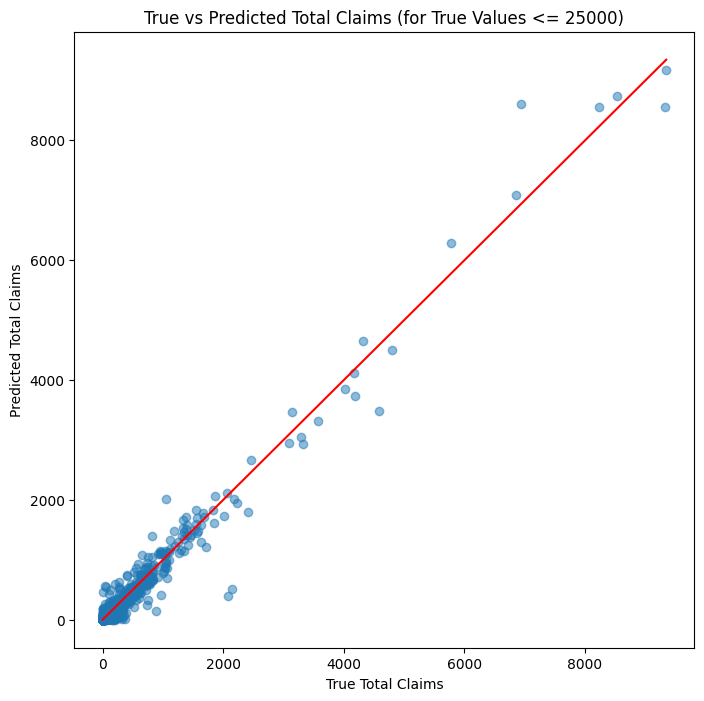

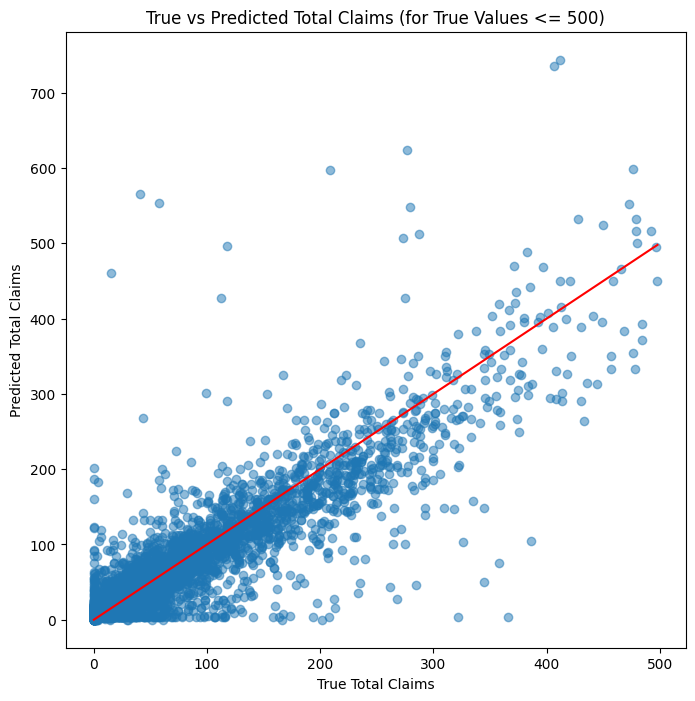

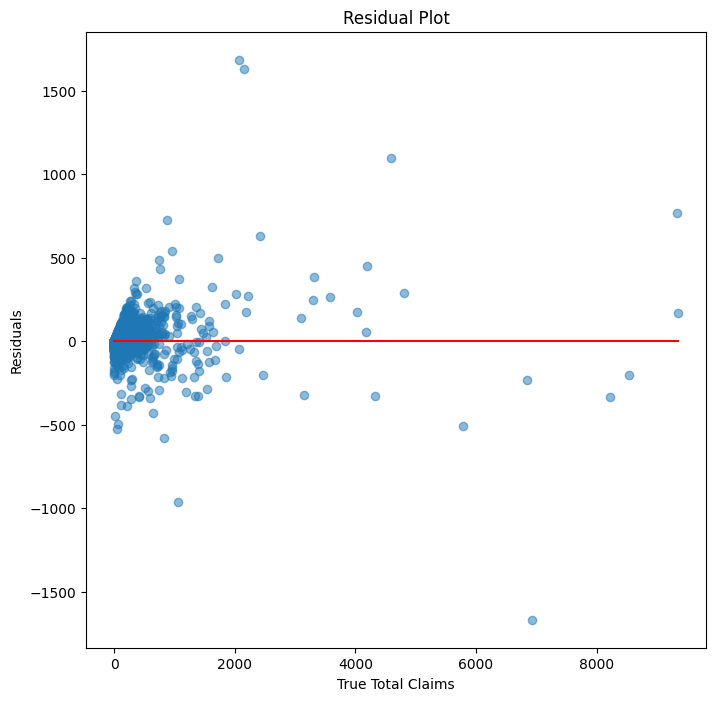

In [160]:
new_plot_true_pred_claims(y_pred_rounded, y_test, 25000)
new_plot_true_pred_claims(y_pred_rounded, y_test, 500)
new_plot_residuals(y_pred_rounded, y_test)

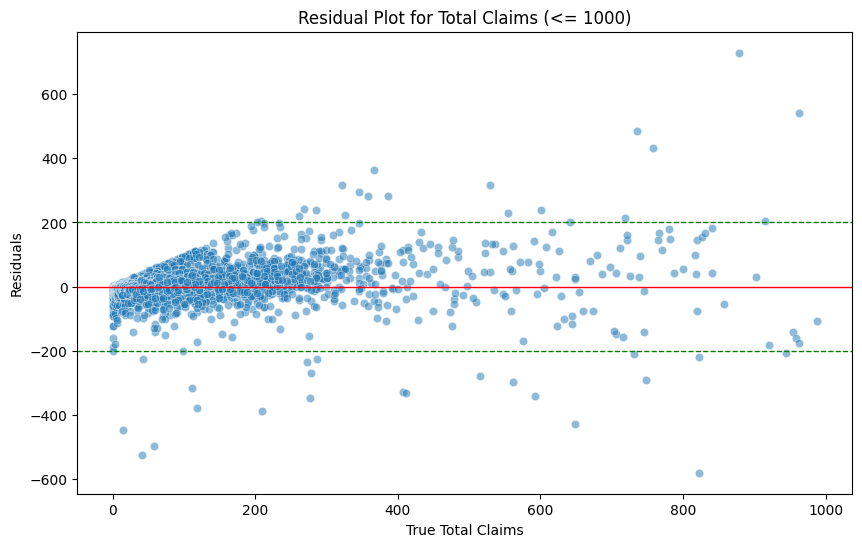

In [161]:
# DataFrame with actual and predicted values
df_residuals = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_pred_rounded
})

# Calculate residuals
df_residuals['Residuals'] = df_residuals['Actual'] - df_residuals['Predicted']

df_residuals = pd.merge(df_residuals.reset_index(), X_test['npi'].reset_index()).set_index('npi').drop(columns='index')

# Residual plot of selected claims values
plt.figure(figsize=(10, 6))
filtered_data = df_residuals[df_residuals['Actual'] <= 1000]
sns.scatterplot(x=filtered_data['Actual'], y=filtered_data['Residuals'], alpha=0.5)
plt.axhline(0, color='red', linewidth=1)
plt.axhline(200, color='green', linestyle='--', linewidth=1)
plt.axhline(-200, color='green', linestyle='--', linewidth=1)
plt.xlabel('True Total Claims')
plt.ylabel('Residuals')
plt.title('Residual Plot for Total Claims (<= 1000)')
plt.show()

Initial "cone" shape in the above plot is due to the predictions being clipped at 0 such that no negative predictions are made. Knowing this, the spread of the residuals is roughly the same for all predicted values, suggesting homoscedasticity.

In [162]:
# Filter rows where the absolute value of residuals is more than 500
df_above_500 = df_residuals[df_residuals['Residuals'].abs() > 500]
df_above_200 = df_residuals[df_residuals['Residuals'].abs() > 200]

print(len(df_above_200))
print(len(df_above_500))
df_above_500

81
13


,Actual,Predicted,Residuals
npi,,,
2347,41,566.0,-525.0
8740,962,420.0,542.0
8742,2152,520.0,1632.0
8743,878,149.0,729.0
8789,1058,2018.0,-960.0
8849,823,1403.0,-580.0
8853,1721,1220.0,501.0
8862,2076,390.0,1686.0
8879,2418,1790.0,628.0


Shapiro test for residuals: p-value 0.0
The residuals do not seem to be normally distributed (reject H0)


/Users/philipdias/anaconda3/envs/pda_ie_env/lib/python3.11/site-packages/scipy/stats/_morestats.py:1882: UserWarning:

p-value may not be accurate for N > 5000.



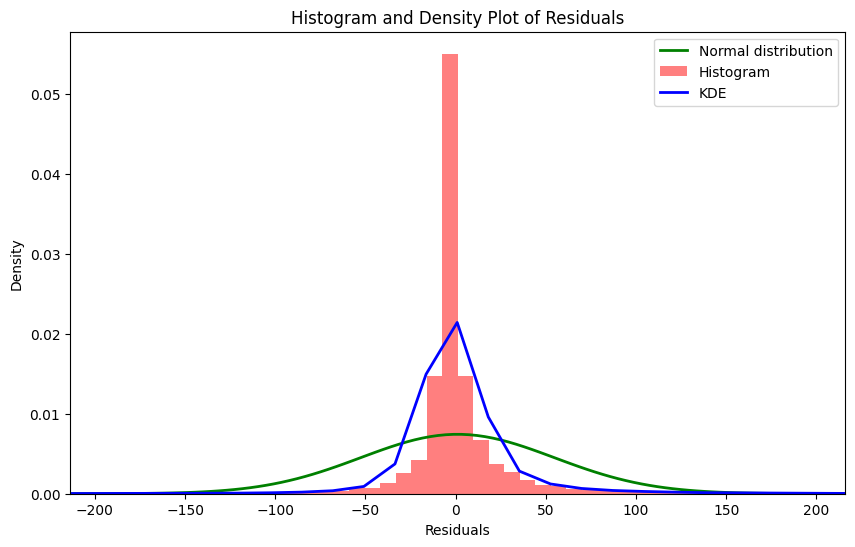

In [163]:
# Evaluating the distribution of the residuals
residuals = df_residuals['Residuals']

# Perform the Shapiro-Wilk test for normality
shapiro_test = stats.shapiro(residuals)
print("Shapiro test for residuals: p-value", shapiro_test[1])

alpha = 0.05
if shapiro_test[1] > alpha:
    print('The residuals seem to be normally distributed (fail to reject H0)')
else:
    print('The residuals do not seem to be normally distributed (reject H0)')

# Calculate mean and standard deviation of residuals
mean = np.mean(residuals)
std = np.std(residuals)

# Define the normal distribution based on the residuals' mean and std deviation
x = np.linspace(mean - 4*std, mean + 4*std, 100)
pdf = stats.norm.pdf(x, mean, std)

# Plot the normal distribution and the residuals histogram
plt.figure(figsize=(10, 6))

# Plot normal distribution curve
plt.plot(x, pdf, lw=2, color="g", label='Normal distribution')

# Plot histogram of residuals
plt.hist(residuals, density=True, bins=50, range=(mean - 4*std, mean + 4*std), color="r", alpha=0.5, label='Histogram')

# Plot KDE of residuals
sns.kdeplot(residuals, bw_adjust=1.5, color="blue", lw=2, label='KDE')

# Set plot limits
plt.xlim(mean - 4*std, mean + 4*std)

# Plot
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.title('Histogram and Density Plot of Residuals')
plt.legend()
plt.show()

While the residuals are not normally distributed according to the formal Shapiro test, it can be seen from the plot that the residual distribution is fairly normal. 

# 7. Creating Predictions for 2021 Q1 <a id='prediction'></a>

When making the predictions for the next quarter, we want the model to have been trained on all the data available up until that point. Therefore, we refit our model to the whole dataset including the observations relating to 2020 Q4, which represented the test set when we developed our model. Then we use the refitted model to make predictions for 2021 Q1. 

Since we are predicting into the future, the true values for 2021 Q1 are not known at the time of prediction. We will therefore not be able to evaluate the performance of our predictions for 2021 Q1 but will instead have to rely on our performance metrics and error analysis relating to making predictions for 2020 Q4 based on prior quarters. We found that using 2020 Q4 as the test set was the "best" simulation of the task we were assigned: to predict the next quarter based on data from prior quarters.

In [164]:
# Generate interaction features for the whole dataset 
for i in range(len(lasso_list)):
    for j in range(i+1, len(lasso_list)):
        # For interaction term, create a new column that is a product of two columns
        X[lasso_list[i] + "_" + lasso_list[j] + "_interaction"] = X[lasso_list[i]] * X[lasso_list[j]]

X_new = X[lasso_list1]

# Filter the columns where 'grouping_1_Laboratories' is not 1
non_labs = X['grouping_1_Laboratories'] != 1

# Drop 'grouping_1_Laboratories' column
X_new = X_new[non_labs].drop(['grouping_1_Laboratories'], axis=1)

# Filter y_train and y_test according to the same conditions
y_new = y[non_labs]

# Now that 'grouping_1_Laboratories' is already removed from the features, we can scale them
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_new)

X_scaled = scaler.transform(X_new)

with open('lasso_model.pkl', 'rb') as f:
    model_refit = pickle.load(f)

model_refit.fit(X_scaled, y_new)

# save the refitted model
with open('lasso_model_refitted.pkl', 'wb') as f:
    pickle.dump(model_refit, f)

Having refitted the model to the whole dataset, we now prepare the input data to make prediction for 2021 Q1.

In [165]:
X_test_new.columns

Index(['provider_size', 'total_claims_lag1', 'total_claims_lag2',
       'tele_services_claims_lag2',
       'standard_services_psychotherapy_claims_lag1',
       'provider_size_total_claims_lag1_interaction'],
      dtype='object')

In [166]:
X_test.columns

Index(['npi', 'service_year', 'service_quarter', 'county_name',
       'transport_access', 'broadband_access', 'provider_size',
       'entity_type_code', 'planning_accepts_new_patients', 'business_status',
       'mental_health', 'working_hours_owner_missing_info', 'minority_owned',
       'extra_languages_spoken', 'providers_per_county', 'total_claims_lag1',
       'total_claims_lag2', 'standard_services_claims_lag1',
       'standard_services_claims_lag2', 'tele_services_claims_lag1',
       'tele_services_claims_lag2', 'total_psychotherapy_claims_lag1',
       'total_psychotherapy_claims_lag2',
       'total_non_psychotherapy_claims_lag1',
       'total_non_psychotherapy_claims_lag2',
       'standard_services_psychotherapy_claims_lag1',
       'standard_services_psychotherapy_claims_lag2',
       'tele_services_psychotherapy_claims_lag1',
       'tele_services_psychotherapy_claims_lag2', 'weekend_availability',
       'availability_after_5pm', 'availability_before_8am',
       'gr

Steps to create the testing set:

The columns that the train and test set had for the model are:
```python 
['provider_size', 
'total_claims_lag1', 
'total_claims_lag2',
'tele_services_claims_lag2',
'standard_services_psychotherapy_claims_lag1',
'provider_size_total_claims_lag1_interaction']
```
For creating the 2021 Q1 set for predictions, we need to recreate these values for the providers still available during 2020 Q3 and Q4.

In [167]:
# Want to use the 2020 Q4 values to predict the 2021 Q1 values (with no ground truth)

# creating a dataframe for the providers that existed in 2020 Q4 by duplicating the test set 
X_2021Q1 = X_test_new.copy()
X_2021Q1.head()

,provider_size,total_claims_lag1,total_claims_lag2,tele_services_claims_lag2,standard_services_psychotherapy_claims_lag1,provider_size_total_claims_lag1_interaction
9,0,2.0,0.0,0.0,0.0,0.0
11,0,4.0,8.0,8.0,0.0,0.0
21,0,0.0,0.0,0.0,0.0,0.0
27,0,0.0,0.0,0.0,0.0,0.0
37,0,0.0,1.0,1.0,0.0,0.0


In [168]:
# 'provider_size should be the same provider_size as in 2020 Q4 - DONE

# 'total_claims_lag1' should be total_claims from 2020 Q4  - add columns from y_test 
X_2021Q1['total_claims_lag1'] = y_test

# 'total_claims_lag2' should be total_claims from 2020 Q3 - add column matching npi from 2020 Q3
X_2021Q1['total_claims_lag2'] = X_test_new['total_claims_lag1']

# 'tele_services_claims_lag2' should be tele_services_claims from 2020 Q3 - add column matching npi from 2020 Q3
X_2021Q1['tele_services_claims_lag2'] = X_test['tele_services_claims_lag1']

# 'standard_services_psychotherapy_claims_lag1' should be standard_services_psychotherapy_claims from 2020 Q4 - add column matching npi from 2020 Q4
X_2021Q1['standard_services_psychotherapy_claims_lag1'] = data_saving_claims['standard_services_psychotherapy_claims']

# 'provider_size_total_claims_lag1_interaction' should be from 2020 Q4 - add column matching npi from 2020 Q4
X_2021Q1['provider_size_total_claims_lag1_interaction'] = X_test_new['provider_size'] * y_test

In [169]:
# NPI is set as the index for the prediction dataset
X_2021Q1 = pd.merge(X_2021Q1.reset_index(), X_test['npi'].reset_index()).set_index('npi').drop(columns='index')
X_2021Q1.head()

,provider_size,total_claims_lag1,total_claims_lag2,tele_services_claims_lag2,standard_services_psychotherapy_claims_lag1,provider_size_total_claims_lag1_interaction
npi,,,,,,
1,0,6,2.0,2.0,0,0
2,0,0,4.0,4.0,0,0
3,0,0,0.0,0.0,0,0
4,0,0,0.0,0.0,0,0
5,0,0,0.0,0.0,0,0


Now that we have prepared the prediction dataset, we want to make predictions for 2021 Q1 for all existing providers.

In [170]:
# Load refitted model
with open('lasso_model_refitted.pkl', 'rb') as f:
    model = pickle.load(f)

# Scale using the same scaler trained on the model data
X_2021Q1_scaled = scaler.transform(X_2021Q1)

# Predict
y_2021Q1_pred = model.predict(X_2021Q1_scaled)

# Clip the predictions to be non-negative
y_2021Q1_pred = np.clip(y_2021Q1_pred, a_min=0, a_max=None)

# Round the predictions
y_2021Q1_pred_rounded = np.round(y_2021Q1_pred)

# Save the predictions to a CSV file
df_2021Q1_pred = pd.DataFrame({
    'npi': X_2021Q1.index,
    'quarter': '2021Q1', # '2021Q1' for all rows
    'total_claims': y_2021Q1_pred_rounded
})

In [171]:
df_2021Q1_pred.head()

,npi,quarter,total_claims
0,1,2021Q1,9.0
1,2,2021Q1,4.0
2,3,2021Q1,4.0
3,4,2021Q1,4.0
4,5,2021Q1,4.0


## 7.1 Analyzing Ranges of total_claims based on the errors present in our model <a id='errors'></a>

We will now use the model errors to be able to construct intervals of confidence to give for our predictions, to give providers a better range of claims to expect in the next quarter.

In [172]:
# Using predicted values from before, we will split into quantiles to find RMSE relative to these 4 quantiles to offer better intervals in the solution
quantiles = df_residuals['Predicted'].quantile([0.25, 0.5, 0.75]).values

# Segment data based on quantiles
low_segment = df_residuals[df_residuals['Predicted'] <= quantiles[0]]
mid_low_segment = df_residuals[(df_residuals['Predicted'] > quantiles[0]) & (df_residuals['Predicted'] <= quantiles[1])]
mid_high_segment = df_residuals[(df_residuals['Predicted'] > quantiles[1]) & (df_residuals['Predicted'] <= quantiles[2])]
high_segment = df_residuals[df_residuals['Predicted'] > quantiles[2]]

# Calculate RMSE for each segment
def calculate_rmse(segment):
    return np.sqrt(mean_squared_error(segment['Actual'], segment['Predicted']))

rmse_low = calculate_rmse(low_segment)
rmse_mid_low = calculate_rmse(mid_low_segment)
rmse_mid_high = calculate_rmse(mid_high_segment)
rmse_high = calculate_rmse(high_segment)

print(f'RMSE for Low Segment: {rmse_low}')
print(f'RMSE for Mid-Low Segment: {rmse_mid_low}')
print(f'RMSE for Mid-High Segment: {rmse_mid_high}')
print(f'RMSE for High Segment: {rmse_high}')

RMSE for Low Segment: 17.566590630597013
RMSE for Mid-Low Segment: 12.352871043584644
RMSE for Mid-High Segment: 21.9767318813796
RMSE for High Segment: 103.06440839216864


In [173]:
# Define a function to assign RMSE based on the quantiles
def get_rmse_for_prediction(prediction, quantiles, rmse_low, rmse_mid_low, rmse_mid_high, rmse_high):
    if prediction <= quantiles[0]:
        return rmse_low
    elif prediction <= quantiles[1]:
        return rmse_mid_low
    elif prediction <= quantiles[2]:
        return rmse_mid_high
    else:
        return rmse_high

# Calculate prediction intervals for each prediction
z_score = 1.96  # For 95% confidence interval
intervals = []

for pred in y_2021Q1_pred_rounded:
    rmse = get_rmse_for_prediction(pred, quantiles, rmse_low, rmse_mid_low, rmse_mid_high, rmse_high)
    lower_bound = round(max(0, pred - (z_score * rmse))) # want to calculate lower_bound with a floor of 0
    upper_bound = round(pred + (z_score * rmse))
    intervals.append((pred, lower_bound, upper_bound))

# Create the dataframe with predictions and intervals
df_2021Q1_pred = pd.DataFrame(intervals, columns=['total_claims', 'lower_bound_95ci', 'upper_bound_95ci'])
df_2021Q1_pred['npi'] = X_2021Q1.index  # Assuming X_2021Q1 is defined and has the correct index
df_2021Q1_pred['quarter'] = '2021Q1'

# Reorder columns for better readability
df_2021Q1_pred = df_2021Q1_pred[['npi', 'quarter', 'total_claims', 'lower_bound_95ci', 'upper_bound_95ci']]

# Display the dataframe
df_2021Q1_pred

,npi,quarter,total_claims,lower_bound_95ci,upper_bound_95ci
0,1,2021Q1,9.0,0,33
1,2,2021Q1,4.0,0,38
2,3,2021Q1,4.0,0,38
3,4,2021Q1,4.0,0,38
4,5,2021Q1,4.0,0,38
...,...,...,...,...,...
8912,8915,2021Q1,1464.0,1262,1666
8913,8916,2021Q1,5313.0,5111,5515
8914,8917,2021Q1,8713.0,8511,8915
8915,8918,2021Q1,9118.0,8916,9320


In [174]:
df_2021Q1_pred.to_csv('2021Q1_predictions.csv', index=False)

## 8. Linking the Demand Prediction to the Supply Segmentation <a id='segmentation'></a>

In [175]:
# loading the dataset containing NPIs and cluster classification
segmentation = pd.read_csv('segmentation.csv')

In [176]:
print(df_2021Q1_pred.columns)
print(segmentation.columns)

Index(['npi', 'quarter', 'total_claims', 'lower_bound_95ci',
       'upper_bound_95ci'],
      dtype='object')
Index(['npi', 'kmeans_cluster'], dtype='object')


In [177]:
# the dataset with the predictions is merged with the cluster dataset by performing an inner join on NPI 
df_2021Q1_pred_with_segments = pd.merge(df_2021Q1_pred, segmentation, on='npi')
df_2021Q1_pred_with_segments = df_2021Q1_pred_with_segments.rename(columns={'total_claims': 'total_claims_pred_2021Q1'})
df_2021Q1_pred_with_segments.drop(columns='quarter')
df_2021Q1_pred_with_segments.head()

,npi,quarter,total_claims_pred_2021Q1,lower_bound_95ci,upper_bound_95ci,kmeans_cluster
0,1,2021Q1,9.0,0,33,1
1,2,2021Q1,4.0,0,38,3
2,3,2021Q1,4.0,0,38,5
3,4,2021Q1,4.0,0,38,4
4,5,2021Q1,4.0,0,38,4


In [178]:
# to enable a claims comparison, the claims by provider for 2020 Q4 are merged with the above daatframe
claims_2020Q4 = pd.merge(y_test.reset_index(), X_test['npi'].reset_index()).drop(columns='index') # reestablish NPI in y_test
claims_2020Q4 = claims_2020Q4.rename(columns={'total_claims': 'total_claims_2020Q4'}) # rename for clarity
df_2021Q1_pred_with_segments = pd.merge(df_2021Q1_pred_with_segments, claims_2020Q4, on='npi')
df_2021Q1_pred_with_segments.head()

,npi,quarter,total_claims_pred_2021Q1,lower_bound_95ci,upper_bound_95ci,kmeans_cluster,total_claims_2020Q4
0,1,2021Q1,9.0,0,33,1,6
1,2,2021Q1,4.0,0,38,3,0
2,3,2021Q1,4.0,0,38,5,0
3,4,2021Q1,4.0,0,38,4,0
4,5,2021Q1,4.0,0,38,4,0


In [179]:
# exploring changes in total claims
print(f"Total claims predicted in 2021 Q1: {df_2021Q1_pred_with_segments.total_claims_pred_2021Q1.sum()}")
print(f"Total claims in 2020 Q4: {df_2021Q1_pred_with_segments.total_claims_2020Q4.sum()}")
print(f"Absolute difference: {df_2021Q1_pred_with_segments.total_claims_pred_2021Q1.sum() - df_2021Q1_pred_with_segments.total_claims_2020Q4.sum()}")
print(f"Percentage difference: {round((df_2021Q1_pred_with_segments.total_claims_pred_2021Q1.sum() - df_2021Q1_pred_with_segments.total_claims_2020Q4.sum()) / df_2021Q1_pred_with_segments.total_claims_2020Q4.sum() * 100, 4)}%")

Total claims predicted in 2021 Q1: 587569.0
Total claims in 2020 Q4: 613720
Absolute difference: -26151.0
Percentage difference: -4.2611%


#### 8.1 Evaluating predictions by provider segment <a id='provider_segment'></a>

In [180]:
# exploring the predicted changes in claims from 2020 Q4 to 2021 Q1 by provider segment
grouped_segments_claims_sum = df_2021Q1_pred_with_segments.groupby('kmeans_cluster')[['total_claims_2020Q4', 'total_claims_pred_2021Q1']].sum()
grouped_segments_claims_sum['Absolute Change'] = grouped_segments_claims_sum['total_claims_pred_2021Q1'] - grouped_segments_claims_sum['total_claims_2020Q4']
grouped_segments_claims_sum['Percentage Change'] = (grouped_segments_claims_sum['total_claims_pred_2021Q1'] - grouped_segments_claims_sum['total_claims_2020Q4']) / grouped_segments_claims_sum['total_claims_2020Q4'] * 100
grouped_segments_claims_sum

,total_claims_2020Q4,total_claims_pred_2021Q1,Absolute Change,Percentage Change
kmeans_cluster,,,,
1,294457,265079.0,-29378.0,-9.977009
2,138243,130568.0,-7675.0,-5.551818
3,29952,28956.0,-996.0,-3.325321
4,104028,108746.0,4718.0,4.535317
5,47040,54220.0,7180.0,15.263605


In [181]:
# creating a dataframe with total claims for each provider from 2020Q1 to 2021Q1 (pred) and the cluster classification of each provider
segments_over_time = df_2021Q1_pred_with_segments.drop(columns=['lower_bound_95ci', 'upper_bound_95ci', 'quarter'])
data2020Q1 = data[(data['service_year'] == 2020) & (data['service_quarter'] == 1)][['npi', 'total_claims']].rename(columns={'total_claims': 'total_claims_2020Q1'})
data2020Q2 = data[(data['service_year'] == 2020) & (data['service_quarter'] == 2)][['npi', 'total_claims']].rename(columns={'total_claims': 'total_claims_2020Q2'})
data2020Q3 = data[(data['service_year'] == 2020) & (data['service_quarter'] == 3)][['npi', 'total_claims']].rename(columns={'total_claims': 'total_claims_2020Q3'})
segments_over_time = pd.merge(segments_over_time, data2020Q1, on='npi')
segments_over_time = pd.merge(segments_over_time, data2020Q2, on='npi')
segments_over_time = pd.merge(segments_over_time, data2020Q3, on='npi')
segments_over_time = segments_over_time[['npi', 'kmeans_cluster', 'total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1']]
segments_over_time.head()

,npi,kmeans_cluster,total_claims_2020Q1,total_claims_2020Q2,total_claims_2020Q3,total_claims_2020Q4,total_claims_pred_2021Q1
0,1,1,0,0,2,6,9.0
1,2,3,0,8,4,0,4.0
2,3,5,4,0,0,0,4.0
3,4,4,9,0,0,0,4.0
4,5,4,0,1,0,0,4.0


In [182]:
grouped_segments_claims_time = segments_over_time.groupby('kmeans_cluster')[['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1']].sum()
grouped_segments_claims_time['Absolute Change (full year)'] = grouped_segments_claims_time['total_claims_pred_2021Q1'] - grouped_segments_claims_time['total_claims_2020Q1']
grouped_segments_claims_time['Percentage Change (full year)'] = (grouped_segments_claims_time['total_claims_pred_2021Q1'] - grouped_segments_claims_time['total_claims_2020Q1']) / grouped_segments_claims_time['total_claims_2020Q1'] * 100
grouped_segments_claims_time['CQGR'] = ((grouped_segments_claims_time['total_claims_pred_2021Q1'] / grouped_segments_claims_time['total_claims_2020Q1'])**(1/4) - 1) * 100
grouped_segments_claims_time['Absolute Change (last quarter)'] = grouped_segments_claims_time['total_claims_pred_2021Q1'] - grouped_segments_claims_time['total_claims_2020Q4']
grouped_segments_claims_time['Percentage Change (last quarter)'] = (grouped_segments_claims_time['total_claims_pred_2021Q1'] - grouped_segments_claims_time['total_claims_2020Q4']) / grouped_segments_claims_time['total_claims_2020Q4'] * 100
grouped_segments_claims_time.head()

,total_claims_2020Q1,total_claims_2020Q2,total_claims_2020Q3,total_claims_2020Q4,total_claims_pred_2021Q1,Absolute Change (full year),Percentage Change (full year),CQGR,Absolute Change (last quarter),Percentage Change (last quarter)
kmeans_cluster,,,,,,,,,,
1,239786,301008,318255,294457,265079.0,25293.0,10.548155,2.538716,-29378.0,-9.977009
2,107040,136665,143570,138243,130568.0,23528.0,21.980568,5.092727,-7675.0,-5.551818
3,22591,27536,29553,29952,28956.0,6365.0,28.174937,6.402242,-996.0,-3.325321
4,92271,93139,102132,104028,108746.0,16475.0,17.855014,4.192634,4718.0,4.535317
5,42951,41312,45874,47040,54220.0,11269.0,26.236875,5.997728,7180.0,15.263605


In [183]:
# Plotting the development in demand by provider segment
# Grouping the claims by provider segment over time
grouped_segments_claims_time = segments_over_time.groupby('kmeans_cluster')[['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1']].sum()
grouped_segments_claims_time = grouped_segments_claims_time.reset_index()
grouped_segments_claims_time_melted = grouped_segments_claims_time.melt(id_vars='kmeans_cluster', 
                                                                        value_vars=['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1'],
                                                                        var_name='Time', 
                                                                        value_name='Total Claims')

# Quarterly percentage change calculation
grouped_segments_claims_time_melted['Percentage Change'] = grouped_segments_claims_time_melted.groupby('kmeans_cluster')['Total Claims'].pct_change() * 100

# Mapping time periods to make x-axis more readable
time_mapping = {
    'total_claims_2020Q1': '2020 Q1',
    'total_claims_2020Q2': '2020 Q2',
    'total_claims_2020Q3': '2020 Q3',
    'total_claims_2020Q4': '2020 Q4',
    'total_claims_pred_2021Q1': '2021 Q1 (predicted)'
}
grouped_segments_claims_time_melted['Time'] = grouped_segments_claims_time_melted['Time'].map(time_mapping)

# Creating the plot
fig = go.Figure()

for cluster in grouped_segments_claims_time_melted['kmeans_cluster'].unique():
    cluster_data = grouped_segments_claims_time_melted[grouped_segments_claims_time_melted['kmeans_cluster'] == cluster]
    fig.add_trace(go.Scatter(
        x=cluster_data['Time'],
        y=cluster_data['Total Claims'],
        mode='lines+markers+text',
        name=f'Cluster {cluster}',
        text=cluster_data['Percentage Change'].apply(lambda x: f'{x:.1f}%' if not pd.isna(x) else ''),
        textposition='top center'
    ))

fig.update_layout(
    title='Predicted Changes in Claims from 2020 Q1 to 2021 Q1 by Provider Segment',
    xaxis_title='Time',
    yaxis_title='Total Claims',
    legend_title='Provider Segment (Cluster)',
    template='plotly_white',
    width=1200,  
    height=800   
)

fig.show()

#### 8.2 Creating and evaluting error-adjusted provider segment predictions <a id='provider_segment_error'></a>

In [184]:
segments_error_analysis = pd.merge(segments_over_time, df_residuals['Residuals'].reset_index(), on='npi') # merge claims with segments and residuals
segments_error_analysis = segments_error_analysis.rename(columns={'Residuals': 'error_2020Q4_pred'}) # rename for clarity
segments_error_analysis.head()

,npi,kmeans_cluster,total_claims_2020Q1,total_claims_2020Q2,total_claims_2020Q3,total_claims_2020Q4,total_claims_pred_2021Q1,error_2020Q4_pred
0,1,1,0,0,2,6,9.0,0.0
1,2,3,0,8,4,0,4.0,-6.0
2,3,5,4,0,0,0,4.0,-4.0
3,4,4,9,0,0,0,4.0,-4.0
4,5,4,0,1,0,0,4.0,-4.0


In [185]:
grouped_segments_error_analysis = segments_error_analysis.groupby('kmeans_cluster')[['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1', 'error_2020Q4_pred']].sum()
grouped_segments_error_analysis['%error_2020Q4_pred'] = grouped_segments_error_analysis['error_2020Q4_pred'] / grouped_segments_error_analysis['total_claims_2020Q4'] * 100
grouped_segments_error_analysis['total_claims_pred_2021Q1_error_adj'] = round(grouped_segments_error_analysis['total_claims_pred_2021Q1'] * (1 + (grouped_segments_error_analysis['%error_2020Q4_pred']) / 100))
grouped_segments_error_analysis['Absolute Change (full year)'] = grouped_segments_error_analysis['total_claims_pred_2021Q1_error_adj'] - grouped_segments_error_analysis['total_claims_2020Q1']
grouped_segments_error_analysis['Percentage Change (full year)'] = (grouped_segments_error_analysis['total_claims_pred_2021Q1_error_adj'] - grouped_segments_error_analysis['total_claims_2020Q1']) / grouped_segments_error_analysis['total_claims_2020Q1'] * 100
grouped_segments_error_analysis['CQGR'] = ((grouped_segments_error_analysis['total_claims_pred_2021Q1_error_adj'] / grouped_segments_error_analysis['total_claims_2020Q1'])**(1/4) - 1) * 100
grouped_segments_error_analysis['Absolute Change (last quarter)'] = grouped_segments_error_analysis['total_claims_pred_2021Q1_error_adj'] - grouped_segments_error_analysis['total_claims_2020Q4']
grouped_segments_error_analysis['Percentage Change (last quarter)'] = (grouped_segments_error_analysis['total_claims_pred_2021Q1_error_adj'] - grouped_segments_error_analysis['total_claims_2020Q4']) / grouped_segments_error_analysis['total_claims_2020Q4'] * 100
grouped_segments_error_analysis = grouped_segments_error_analysis[['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1_error_adj', 'Absolute Change (full year)', 'Percentage Change (full year)', 'CQGR', 'Absolute Change (last quarter)', 'Percentage Change (last quarter)', '%error_2020Q4_pred', 'error_2020Q4_pred']]
grouped_segments_error_analysis.head()

,total_claims_2020Q1,total_claims_2020Q2,total_claims_2020Q3,total_claims_2020Q4,total_claims_pred_2021Q1_error_adj,Absolute Change (full year),Percentage Change (full year),CQGR,Absolute Change (last quarter),Percentage Change (last quarter),%error_2020Q4_pred,error_2020Q4_pred
kmeans_cluster,,,,,,,,,,,,
1,239786,301008,318255,294457,272305.0,32519.0,13.561676,3.230480,-22152.0,-7.523000,2.726035,8027.0
2,107040,136665,143570,138243,132646.0,25606.0,23.921898,5.508394,-5597.0,-4.048668,1.591401,2200.0
3,22591,27536,29553,29952,30849.0,8258.0,36.554380,8.100178,897.0,2.994792,6.537126,1958.0
4,92271,93139,102132,104028,107952.0,15681.0,16.994505,4.001922,3924.0,3.772061,-0.730573,-760.0
5,42951,41312,45874,47040,51917.0,8966.0,20.874951,4.853777,4877.0,10.367772,-4.247449,-1998.0


In [186]:
# Plotting the development in demand by provider segment (error adjusted)
# Grouping the claims by provider segment over time
grouped_segments_error_analysis_time = grouped_segments_error_analysis.groupby('kmeans_cluster')[['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1_error_adj']].sum()
grouped_segments_error_analysis_time = grouped_segments_error_analysis_time.reset_index()
grouped_segments_error_analysis_time_melted = grouped_segments_error_analysis_time.melt(id_vars='kmeans_cluster', 
                                                                                        value_vars=['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1_error_adj'],
                                                                                        var_name='Time', 
                                                                                        value_name='Total Claims')

# Quarterly percentage change calculation
grouped_segments_error_analysis_time_melted['Percentage Change'] = grouped_segments_error_analysis_time_melted.groupby('kmeans_cluster')['Total Claims'].pct_change() * 100

# Mapping time periods to make x-axis more readable
time_mapping = {
    'total_claims_2020Q1': '2020 Q1',
    'total_claims_2020Q2': '2020 Q2',
    'total_claims_2020Q3': '2020 Q3',
    'total_claims_2020Q4': '2020 Q4',
    'total_claims_pred_2021Q1_error_adj': '2021 Q1 (error-adjusted prediction)'
}
grouped_segments_error_analysis_time_melted['Time'] = grouped_segments_error_analysis_time_melted['Time'].map(time_mapping)

# Creating the plot
fig = go.Figure()

for cluster in grouped_segments_error_analysis_time_melted['kmeans_cluster'].unique():
    cluster_data = grouped_segments_error_analysis_time_melted[grouped_segments_error_analysis_time_melted['kmeans_cluster'] == cluster]
    fig.add_trace(go.Scatter(
        x=cluster_data['Time'],
        y=cluster_data['Total Claims'],
        mode='lines+markers+text',
        name=f'Cluster {cluster}',
        text=cluster_data['Percentage Change'].apply(lambda x: f'{x:.1f}%' if not pd.isna(x) else ''),
        textposition='top center'
    ))

fig.update_layout(
    title='Predicted Changes in Claims from 2020 Q1 to 2021 Q1 by Provider Segment (Error-adjusted)',
    xaxis_title='Time',
    yaxis_title='Total Claims',
    legend_title='Provider Segment (Cluster)',
    template='plotly_white',
    width=1200,  
    height=800   
)

fig.show()

## 9. Further Examination of the Development in Demand  <a id='supplier_characteristics'></a>


#### 9.1 Expected Development of Total Claims Demand <a id='claims_development'></a>

Firstly, we will create some plots to understand the expected development in total claims. Secondly, we will analyze the total number of claims by supplier characteristics in order to generate insights for the state of North Carolina.

In [187]:
claims_df = segments_error_analysis.copy()
claims_df['total_claims_pred_2021Q1_error_adj'] = claims_df['total_claims_pred_2021Q1'] - claims_df['error_2020Q4_pred']
claims_df = claims_df[['npi', 'kmeans_cluster', 'total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1', 'total_claims_pred_2021Q1_error_adj', 'error_2020Q4_pred']]

In [188]:
claims_df_melted = claims_df.melt(id_vars=['npi'], 
                    value_vars=['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 
                                'total_claims_2020Q4', 'total_claims_pred_2021Q1'], 
                    var_name='Quarter', 
                    value_name='Total Claims')

# Aggregate the claims by quarter
aggregated_claims_df = claims_df_melted.groupby('Quarter', as_index=False)['Total Claims'].sum()

# Calculate percentage change
aggregated_claims_df['Percentage Change'] = aggregated_claims_df['Total Claims'].pct_change() * 100

# Create bar plot
fig = px.bar(aggregated_claims_df, x='Quarter', y='Total Claims', 
             title='Development in Total Claims per Quarter')

# Add lines and annotations for percentage change
for i in range(1, len(aggregated_claims_df)):
    fig.add_trace(go.Scatter(
        x=[aggregated_claims_df['Quarter'][i-1], aggregated_claims_df['Quarter'][i]],
        y=[aggregated_claims_df['Total Claims'][i-1], aggregated_claims_df['Total Claims'][i]],
        mode='lines',
        line=dict(color='black', width=2),
        showlegend=False
    ))
    fig.add_annotation(
        x=aggregated_claims_df['Quarter'][i],
        y=aggregated_claims_df['Total Claims'][i],
        text=f"{aggregated_claims_df['Percentage Change'][i]:.2f}%",
        showarrow=True,
        arrowhead=2,
        ax=-40,
        ay=-40
    )

fig.show()

In [189]:
claims_df_melted = claims_df.melt(id_vars=['npi'], 
                    value_vars=['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 
                                'total_claims_2020Q4', 'total_claims_pred_2021Q1_error_adj'], 
                    var_name='Quarter', 
                    value_name='Total Claims')

# Aggregate the claims by quarter
aggregated_claims_df = claims_df_melted.groupby('Quarter', as_index=False)['Total Claims'].sum()

# Calculate percentage change
aggregated_claims_df['Percentage Change'] = aggregated_claims_df['Total Claims'].pct_change() * 100

# Create bar plot
fig = px.bar(aggregated_claims_df, x='Quarter', y='Total Claims', 
             title='Development in Total Claims per Quarter (error-adjusted)')

# Add lines and annotations for percentage change
for i in range(1, len(aggregated_claims_df)):
    fig.add_trace(go.Scatter(
        x=[aggregated_claims_df['Quarter'][i-1], aggregated_claims_df['Quarter'][i]],
        y=[aggregated_claims_df['Total Claims'][i-1], aggregated_claims_df['Total Claims'][i]],
        mode='lines',
        line=dict(color='black', width=2),
        showlegend=False
    ))
    fig.add_annotation(
        x=aggregated_claims_df['Quarter'][i],
        y=aggregated_claims_df['Total Claims'][i],
        text=f"{aggregated_claims_df['Percentage Change'][i]:.2f}%",
        showarrow=True,
        arrowhead=2,
        ax=-40,
        ay=-40
    )

fig.show()

#### 9.2 Expected Development of Total Claims Demand by Supplier Characteristics <a id='claims_development_by_characteristic'></a>

In [190]:
# creating a dataframe filtering for observations in 2020
df2020 = data_engineered[(data_engineered['service_year'] == 2020)].copy() 
df2020 = df2020.reset_index()

In [191]:
# specifying aggregation function for various supplier characteristics

agg_funcs = {
    'countyID': 'last', 
    'census_tract': 'last',
    'zip5': 'last',
    'Grouping_1': 'last',
    'Classification_1': 'last',
    'Specialization_1': 'last',
    'Display_Name_1': 'last',
    '%psychotherapy_patients': 'mean',
    '%stdService_patients': 'mean',
    '%teleService_patients': 'mean',
    '%tele_psychotherapy_patients': 'mean',
    'psychotherapy_provider_through_taxonomy': 'last',
    'countyname': 'last',
    'urbanity': 'last',
    'lat': 'last',
    'long': 'last',
    'transport_access': 'last',
    'broadband_access': 'last',
    'total_medicaid_claims': 'mean',
    'provider_size': 'last',
    'planning_accepts_new_patients': 'last',
    'business_status': 'last',
    'working_hours_cleaned': 'last',
    'Weekend Availability': 'last',
    'Availability Before 8AM': 'last',
    'Availability After 5PM': 'last',
    'total_commercial_claims': 'mean',
    'total_medicare_claims': 'mean',
    'total_other_payers_claims': 'mean',
    'mental_health': 'last', 
    'specialization_group': 'last',
    'working_hours_owner_missing_info': 'last', 
    'minority_owned': 'last',
    'extra_languages_spoken': 'last',
    'providers_per_county': 'mean'
}

# Aggregate the data
df_aggregated = df2020.groupby('npi').agg(agg_funcs).reset_index()
df_aggregated.head()

,npi,countyID,census_tract,zip5,Grouping_1,Classification_1,Specialization_1,Display_Name_1,%psychotherapy_patients,%stdService_patients,%teleService_patients,%tele_psychotherapy_patients,psychotherapy_provider_through_taxonomy,countyname,urbanity,lat,long,transport_access,broadband_access,total_medicaid_claims,provider_size,planning_accepts_new_patients,business_status,working_hours_cleaned,Weekend Availability,Availability Before 8AM,Availability After 5PM,total_commercial_claims,total_medicare_claims,total_other_payers_claims,mental_health,specialization_group,working_hours_owner_missing_info,minority_owned,extra_languages_spoken,providers_per_county
0,1,51,16.04,28348,Behavioral Health & Social Service Providers,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor,0.50,0.000,0.500,0.500,1,Cumberland,Urban,34.985025,-78.916585,0.900,0.89,0.0,Small,0,Info Not Available,Info Not Available,Info Not Available,Info Not Available,Info Not Available,0.0,0.0,2.75,1,mental_health,1,0,0,461.0
1,2,71,328.00,28052,Behavioral Health & Social Service Providers,Social Worker,Clinical,Clinical Social Worker,0.50,0.000,0.500,0.500,1,Gaston,Urban,35.258674,-81.180363,0.697,0.26,0.0,Small,0,OPERATIONAL,Info Not Available,No,No,No,0.0,0.0,0.00,0,Multi-Specialty Groups and Organizations,0,0,0,139.0
2,3,81,153.02,27377,Allopathic & Osteopathic Physicians,Family Medicine,Sports Medicine,Sports Medicine (Family Medicine) Physician,0.25,0.125,0.125,0.125,0,Guilford,Urban,36.063693,-79.599605,1.000,0.60,0.0,Small,1,OPERATIONAL,Info Not Available,No,No,No,0.0,0.0,2.25,0,Specialized and Allied Health Services,0,0,0,400.0
3,4,119,23.00,28211,Behavioral Health & Social Service Providers,Counselor,Mental Health,Mental Health Counselor,0.25,0.250,0.000,0.000,1,Mecklenburg,Urban,35.190731,-80.803579,0.985,0.53,0.0,Small,0,Info Not Available,Info Not Available,Info Not Available,Info Not Available,Info Not Available,0.0,0.0,0.00,1,mental_health,1,0,0,1402.0
4,5,183,537.23,27615,Behavioral Health & Social Service Providers,Counselor,Professional,Professional Counselor,0.25,0.000,0.250,0.250,1,Wake,Urban,35.897085,-78.650301,0.895,0.87,0.0,Small,0,Info Not Available,Info Not Available,Info Not Available,Info Not Available,Info Not Available,0.0,0.0,0.00,1,mental_health,1,0,0,829.0


In [192]:
claims_df_characteristics = pd.merge(claims_df, df_aggregated, on='npi') # merge the aggregated df with the claims df
claims_df_characteristics.columns # this df can be used to understand the development in demand by supplier characteristics

Index(['npi', 'kmeans_cluster', 'total_claims_2020Q1', 'total_claims_2020Q2',
       'total_claims_2020Q3', 'total_claims_2020Q4',
       'total_claims_pred_2021Q1', 'total_claims_pred_2021Q1_error_adj',
       'error_2020Q4_pred', 'countyID', 'census_tract', 'zip5', 'Grouping_1',
       'Classification_1', 'Specialization_1', 'Display_Name_1',
       '%psychotherapy_patients', '%stdService_patients',
       '%teleService_patients', '%tele_psychotherapy_patients',
       'psychotherapy_provider_through_taxonomy', 'countyname', 'urbanity',
       'lat', 'long', 'transport_access', 'broadband_access',
       'total_medicaid_claims', 'provider_size',
       'planning_accepts_new_patients', 'business_status',
       'working_hours_cleaned', 'Weekend Availability',
       'Availability Before 8AM', 'Availability After 5PM',
       'total_commercial_claims', 'total_medicare_claims',
       'total_other_payers_claims', 'mental_health', 'specialization_group',
       'working_hours_owner_missi

Below, we will define functions to explore the development in demand by supplier characteristic 

In [193]:
# function to understand development of demand by supplier characteristic
def demand_by_supplier_characteristic(df, group_col):
    # Group by the specified column
    grouped_df = df.groupby(group_col)[['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1', 'error_2020Q4_pred']].sum()
    
    # Filter out groups with zero claims across all specified columns
    grouped_df = grouped_df[(grouped_df['total_claims_2020Q1'] > 0) & 
                            (grouped_df['total_claims_2020Q2'] > 0) & 
                            (grouped_df['total_claims_2020Q3'] > 0) & 
                            (grouped_df['total_claims_2020Q4'] > 0) & 
                            (grouped_df['total_claims_pred_2021Q1'] > 0)]
    
    # Calculate necessary columns
    # Non-error adjusted
    grouped_df['Absolute Change (full year)'] = grouped_df['total_claims_pred_2021Q1'] - grouped_df['total_claims_2020Q1']
    grouped_df['Percentage Change (full year)'] = (grouped_df['total_claims_pred_2021Q1'] - grouped_df['total_claims_2020Q1']) / grouped_df['total_claims_2020Q1'] * 100
    grouped_df['CQGR'] = ((grouped_df['total_claims_pred_2021Q1'] / grouped_df['total_claims_2020Q1'])**(1/4) - 1) * 100
    grouped_df['Absolute Change (last quarter)'] = grouped_df['total_claims_pred_2021Q1'] - grouped_df['total_claims_2020Q4']
    grouped_df['Percentage Change (last quarter)'] = (grouped_df['total_claims_pred_2021Q1'] - grouped_df['total_claims_2020Q4']) / grouped_df['total_claims_2020Q4'] * 100
    
    # Error adjusted
    grouped_df['%error_2020Q4_pred'] = grouped_df['error_2020Q4_pred'] / grouped_df['total_claims_2020Q4'] * 100
    grouped_df['total_claims_pred_2021Q1_error_adj'] = round(grouped_df['total_claims_pred_2021Q1'] * (1 + (grouped_df['%error_2020Q4_pred']) / 100))
    grouped_df['Absolute Error-Adj Change (full year)'] = grouped_df['total_claims_pred_2021Q1_error_adj'] - grouped_df['total_claims_2020Q1']
    grouped_df['Percentage Error-Adj Change (full year)'] = (grouped_df['total_claims_pred_2021Q1_error_adj'] - grouped_df['total_claims_2020Q1']) / grouped_df['total_claims_2020Q1'] * 100
    grouped_df['CQGR (Error-Adj)'] = ((grouped_df['total_claims_pred_2021Q1_error_adj'] / grouped_df['total_claims_2020Q1'])**(1/4) - 1) * 100
    grouped_df['Absolute Error-Adj Change (last quarter)'] = grouped_df['total_claims_pred_2021Q1_error_adj'] - grouped_df['total_claims_2020Q4']
    grouped_df['Percentage Error-Adj Change (last quarter)'] = (grouped_df['total_claims_pred_2021Q1_error_adj'] - grouped_df['total_claims_2020Q4']) / grouped_df['total_claims_2020Q4'] * 100
    
    # Reorder columns
    grouped_df = grouped_df[['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1', 'total_claims_pred_2021Q1_error_adj', 
                             'Absolute Change (full year)', 'Absolute Error-Adj Change (full year)', 'Percentage Change (full year)', 'Percentage Error-Adj Change (full year)', 
                             'CQGR', 'CQGR (Error-Adj)', 'Absolute Change (last quarter)', 'Absolute Error-Adj Change (last quarter)',
                             'Percentage Change (last quarter)', 'Percentage Error-Adj Change (last quarter)', '%error_2020Q4_pred', 'error_2020Q4_pred']]
    
    # Sort by total_claims_pred_2021Q1
    grouped_df = grouped_df.sort_values('total_claims_pred_2021Q1', ascending=False)
    #grouped_df = grouped_df.reindex(grouped_df['Percentage Change (last quarter)'].abs().sort_values(ascending=False).index)

    return grouped_df

In [194]:
# function for plotting demand development by characteristic
def plot_top5_by_characteristic(df, group_col):
    # Group by the specified column and calculate sums for each time period
    grouped_df = df.groupby(group_col)[['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1', 'error_2020Q4_pred']].sum()

    # Reset index for melting and sorting
    grouped_df = grouped_df.reset_index()

    # Sort by total_claims_pred_2021Q1 and get top 5 categories
    top_5_categories = grouped_df.nlargest(5, 'total_claims_pred_2021Q1')

    # Melt the dataframe for easier plotting
    grouped_df_melted = top_5_categories.melt(id_vars=group_col, value_vars=['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1'],
                                              var_name='Time', value_name='Total Claims')

    # Calculate quarterly percentage change
    grouped_df_melted['Percentage Change'] = grouped_df_melted.groupby(group_col)['Total Claims'].pct_change() * 100

    # Mapping time periods for readability
    time_mapping = {
        'total_claims_2020Q1': '2020 Q1',
        'total_claims_2020Q2': '2020 Q2',
        'total_claims_2020Q3': '2020 Q3',
        'total_claims_2020Q4': '2020 Q4',
        'total_claims_pred_2021Q1': '2021 Q1 (prediction)'
    }
    grouped_df_melted['Time'] = grouped_df_melted['Time'].map(time_mapping)

    # Creating the plot
    fig = go.Figure()

    for group in grouped_df_melted[group_col].unique():
        group_data = grouped_df_melted[grouped_df_melted[group_col] == group]
        fig.add_trace(go.Scatter(
            x=group_data['Time'],
            y=group_data['Total Claims'],
            mode='lines+markers+text',
            name=f'{group_col} {group}',
            text=group_data['Percentage Change'].apply(lambda x: f'{x:.1f}%' if not pd.isna(x) else ''),
            textposition='top center'
        ))

    fig.update_layout(
        title='Predicted Changes in Claims from 2020 Q1 to 2021 Q1 by Supplier Characteristic (Top 5)',
        xaxis_title='Time',
        yaxis_title='Total Claims',
        legend_title=group_col,
        template='plotly_white',
        width=1200,  
        height=600  
    )

    fig.show()

In [195]:
# function for plotting demand development by characteristic (error adjusted)
def plot_top5_by_characteristic_error_adj(df, group_col):
    # Group by the specified column and calculate sums for each time period
    grouped_df = df.groupby(group_col)[['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1', 'error_2020Q4_pred']].sum()

    # Error adjusted total claims for 2021Q1
    grouped_df['%error_2020Q4_pred'] = grouped_df['error_2020Q4_pred'] / grouped_df['total_claims_2020Q4'] * 100
    grouped_df['total_claims_pred_2021Q1_error_adj'] = round(grouped_df['total_claims_pred_2021Q1'] * (1 + (grouped_df['%error_2020Q4_pred']) / 100))

    # Reset index for melting and sorting
    grouped_df = grouped_df.reset_index()

    # Sort by total_claims_pred_2021Q1_error_adj and get top 5 categories
    top_5_categories = grouped_df.nlargest(5, 'total_claims_pred_2021Q1_error_adj')

    # Melt the dataframe for easier plotting
    grouped_df_melted = top_5_categories.melt(id_vars=group_col, value_vars=['total_claims_2020Q1', 'total_claims_2020Q2', 'total_claims_2020Q3', 'total_claims_2020Q4', 'total_claims_pred_2021Q1_error_adj'],
                                              var_name='Time', value_name='Total Claims')

    # Calculate quarterly percentage change
    grouped_df_melted['Percentage Change'] = grouped_df_melted.groupby(group_col)['Total Claims'].pct_change() * 100

    # Mapping time periods for readability
    time_mapping = {
        'total_claims_2020Q1': '2020 Q1',
        'total_claims_2020Q2': '2020 Q2',
        'total_claims_2020Q3': '2020 Q3',
        'total_claims_2020Q4': '2020 Q4',
        'total_claims_pred_2021Q1_error_adj': '2021 Q1 (error-adjusted prediction)'
    }
    grouped_df_melted['Time'] = grouped_df_melted['Time'].map(time_mapping)

    # Creating the plot
    fig = go.Figure()

    for group in grouped_df_melted[group_col].unique():
        group_data = grouped_df_melted[grouped_df_melted[group_col] == group]
        fig.add_trace(go.Scatter(
            x=group_data['Time'],
            y=group_data['Total Claims'],
            mode='lines+markers+text',
            name=f'{group_col} {group}',
            text=group_data['Percentage Change'].apply(lambda x: f'{x:.1f}%' if not pd.isna(x) else ''),
            textposition='top center'
        ))

    fig.update_layout(
        title='Predicted Changes in Claims from 2020 Q1 to 2021 Q1 by Supplier Characteristic (Top 5) (Error Adjusted)',
        xaxis_title='Time',
        yaxis_title='Total Claims',
        legend_title=group_col,
        template='plotly_white',
        width=1200,
        height=600 
    )

    fig.show()

In [196]:
demand_by_supplier_characteristic(claims_df_characteristics, 'specialization_group')

,total_claims_2020Q1,total_claims_2020Q2,total_claims_2020Q3,total_claims_2020Q4,total_claims_pred_2021Q1,total_claims_pred_2021Q1_error_adj,Absolute Change (full year),Absolute Error-Adj Change (full year),Percentage Change (full year),Percentage Error-Adj Change (full year),CQGR,CQGR (Error-Adj),Absolute Change (last quarter),Absolute Error-Adj Change (last quarter),Percentage Change (last quarter),Percentage Error-Adj Change (last quarter),%error_2020Q4_pred,error_2020Q4_pred
specialization_group,,,,,,,,,,,,,,,,,,
mental_health,270550,334492,350739,332088,309086.0,313134.0,38536.0,42584.0,14.243578,15.739789,3.385099,3.721950,-23002.0,-18954.0,-6.926477,-5.707523,1.309593,4349.0
Multi-Specialty Groups and Organizations,105941,129365,138326,133718,126726.0,130129.0,20785.0,24188.0,19.619411,22.831576,4.580428,5.275547,-6992.0,-3589.0,-5.228915,-2.684007,2.685502,3591.0
Primary Care and General Practice,50203,53922,58790,58666,59983.0,62001.0,9780.0,11798.0,19.480908,23.500588,4.550142,5.418603,1317.0,3335.0,2.244912,5.684724,3.364811,1974.0
Facility-Based Services,27215,27429,30026,27942,27445.0,26350.0,230.0,-865.0,0.845122,-3.178394,0.210614,-0.804249,-497.0,-1592.0,-1.778684,-5.697516,-3.990409,-1115.0
Pediatrics,18527,20161,22011,21062,21893.0,21732.0,3366.0,3205.0,18.168079,17.299077,4.261758,4.069543,831.0,670.0,3.945494,3.181084,-0.735923,-155.0
Internal Medicine and Specialties,10678,10544,11272,11840,12872.0,13538.0,2194.0,2860.0,20.546919,26.784042,4.782566,6.112403,1032.0,1698.0,8.716216,14.341216,5.177365,613.0
Community and Social Services,6709,8368,8194,8252,8049.0,8551.0,1340.0,1842.0,19.973170,27.455657,4.657663,6.252652,-203.0,299.0,-2.460010,3.623364,6.240911,515.0
Emergency and Critical Care,3222,4123,6820,7178,7795.0,7701.0,4573.0,4479.0,141.930478,139.013035,24.716136,24.338435,617.0,523.0,8.595709,7.286152,-1.212037,-87.0
Specialized and Allied Health Services,4158,3492,4329,4130,4112.0,4016.0,-46.0,-142.0,-1.106301,-3.415103,-0.277730,-0.864933,-18.0,-114.0,-0.435835,-2.760291,-2.324455,-96.0


In [197]:
plot_top5_by_characteristic(claims_df_characteristics, 'specialization_group')

In [198]:
plot_top5_by_characteristic_error_adj(claims_df_characteristics, 'specialization_group')

In [199]:
demand_by_supplier_characteristic(claims_df_characteristics, 'planning_accepts_new_patients')

,total_claims_2020Q1,total_claims_2020Q2,total_claims_2020Q3,total_claims_2020Q4,total_claims_pred_2021Q1,total_claims_pred_2021Q1_error_adj,Absolute Change (full year),Absolute Error-Adj Change (full year),Percentage Change (full year),Percentage Error-Adj Change (full year),CQGR,CQGR (Error-Adj),Absolute Change (last quarter),Absolute Error-Adj Change (last quarter),Percentage Change (last quarter),Percentage Error-Adj Change (last quarter),%error_2020Q4_pred,error_2020Q4_pred
planning_accepts_new_patients,,,,,,,,,,,,,,,,,,
0,399480,470017,503046,478506,454327.0,460054.0,54847.0,60574.0,13.729598,15.163212,3.268621,3.592531,-24179.0,-18452.0,-5.053019,-3.856169,1.260590,6032.0
1,105159,129643,136338,135214,133242.0,136587.0,28083.0,31428.0,26.705275,29.886172,6.095918,6.755616,-1972.0,1373.0,-1.458429,1.015427,2.510835,3395.0


In [200]:
plot_top5_by_characteristic_error_adj(claims_df_characteristics, 'planning_accepts_new_patients')

In [201]:
demand_by_supplier_characteristic(claims_df_characteristics, 'Grouping_1').head(5)

,total_claims_2020Q1,total_claims_2020Q2,total_claims_2020Q3,total_claims_2020Q4,total_claims_pred_2021Q1,total_claims_pred_2021Q1_error_adj,Absolute Change (full year),Absolute Error-Adj Change (full year),Percentage Change (full year),Percentage Error-Adj Change (full year),CQGR,CQGR (Error-Adj),Absolute Change (last quarter),Absolute Error-Adj Change (last quarter),Percentage Change (last quarter),Percentage Error-Adj Change (last quarter),%error_2020Q4_pred,error_2020Q4_pred
Grouping_1,,,,,,,,,,,,,,,,,,
Behavioral Health & Social Service Providers,306358,390120,406518,393480,368264.0,379433.0,61906.0,73075.0,20.207078,23.852813,4.708638,5.493686,-25216.0,-14047.0,-6.408458,-3.569940,3.032937,11934.0
Allopathic & Osteopathic Physicians,98944,102111,112489,108467,109583.0,110874.0,10639.0,11930.0,10.752547,12.057325,2.586079,2.886896,1116.0,2407.0,1.028884,2.219108,1.178239,1278.0
Ambulatory Health Care Facilities,27555,30934,33958,32421,31028.0,31181.0,3473.0,3626.0,12.603883,13.159136,3.012124,3.138879,-1393.0,-1240.0,-4.296598,-3.824682,0.493507,160.0
Physician Assistants & Advanced Practice Nursing Providers,19649,21600,23351,22798,24398.0,24409.0,4749.0,4760.0,24.169169,24.225151,5.560987,5.572884,1600.0,1611.0,7.018159,7.066409,0.043863,10.0
Agencies,13555,14546,16376,13866,12681.0,11338.0,-874.0,-2217.0,-6.447805,-16.355588,-1.652461,-4.366680,-1185.0,-2528.0,-8.546084,-18.231646,-10.587047,-1468.0


In [202]:
plot_top5_by_characteristic_error_adj(claims_df_characteristics, 'Grouping_1')

In [203]:
demand_by_supplier_characteristic(claims_df_characteristics, 'Specialization_1').head(5)

,total_claims_2020Q1,total_claims_2020Q2,total_claims_2020Q3,total_claims_2020Q4,total_claims_pred_2021Q1,total_claims_pred_2021Q1_error_adj,Absolute Change (full year),Absolute Error-Adj Change (full year),Percentage Change (full year),Percentage Error-Adj Change (full year),CQGR,CQGR (Error-Adj),Absolute Change (last quarter),Absolute Error-Adj Change (last quarter),Percentage Change (last quarter),Percentage Error-Adj Change (last quarter),%error_2020Q4_pred,error_2020Q4_pred
Specialization_1,,,,,,,,,,,,,,,,,,
Clinical,92570,113078,118269,115521,109384.0,113653.0,16814.0,21083.0,18.163552,22.775197,4.260759,5.263465,-6137.0,-1868.0,-5.312454,-1.617022,3.902321,4508.0
Mental Health,68085,90230,91334,88002,80947.0,83801.0,12862.0,15716.0,18.891092,23.082911,4.420875,5.329359,-7055.0,-4201.0,-8.016863,-4.773755,3.526056,3103.0
Professional,57179,77587,80736,76589,71405.0,72500.0,14226.0,15321.0,24.879764,26.794802,5.711690,6.114654,-5184.0,-4089.0,-6.768596,-5.338887,1.532857,1174.0
Family,37101,39604,42626,42493,43261.0,44885.0,6160.0,7784.0,16.603326,20.980567,3.914879,4.876673,768.0,2392.0,1.807357,5.629162,3.753559,1595.0
Psychiatry,35834,39411,42022,40428,37820.0,39483.0,1986.0,3649.0,5.542222,10.183066,1.357656,2.453952,-2608.0,-945.0,-6.450975,-2.337489,4.397942,1778.0


In [204]:
plot_top5_by_characteristic_error_adj(claims_df_characteristics, 'Specialization_1')

## 10. Examining Demand of Claims by Geography <a id='geography'></a>

Here, we will use the latitude and longitude values of the different providers along with their counties to group them meaningfully and analyze the expected increase in claims for these different counties, hoping to help allocate resources better.

In [205]:
# adding the county_code, latitude, and longitude back into a new dataframe merged from npi from df_2021Q1_pred 
df_2021Q1_pred_with_county = df_2021Q1_pred.merge(data[['countyID', 'lat', 'long']], left_on='npi', right_index=True)
df_2021Q1_pred_with_county.head()

,npi,quarter,total_claims,lower_bound_95ci,upper_bound_95ci,countyID,lat,long
0,1,2021Q1,9.0,0,33,51,34.985025,-78.916585
1,2,2021Q1,4.0,0,38,51,34.985025,-78.916585
2,3,2021Q1,4.0,0,38,51,34.985025,-78.916585
3,4,2021Q1,4.0,0,38,51,34.985025,-78.916585
4,5,2021Q1,4.0,0,38,51,34.985025,-78.916585


In [206]:
df_2021Q1_pred_with_county['countyID'].nunique()

95

In [207]:
# using latitude and longitude from the df along with the countyID, I want to map the boundaries of counties in North Carolina 
import geopandas as gpd
from shapely.geometry import Point
import plotly.express as px
import pandas as pd

# Assuming you have already imported geopandas, Point, and your DataFrame (df_2021Q1_pred_with_county)

# Create a GeoDataFrame
geometry = [Point(xy) for xy in zip(df_2021Q1_pred_with_county['long'], df_2021Q1_pred_with_county['lat'])]
gdf = gpd.GeoDataFrame(df_2021Q1_pred_with_county, geometry=geometry)

# Set the coordinate reference system (CRS) if needed (EPSG:4326 is the standard for lat/long)
gdf.crs = 'EPSG:4326'

# Use Plotly Express to create a heatmap on Mapbox
fig = px.density_mapbox(gdf, lat='lat', lon='long', z='total_claims', radius=15,
                        center=dict(lat=35.8, lon=-79), zoom=6,
                        mapbox_style='carto-positron', title='Healthcare Provider Total Claims Heatmap',
                        color_continuous_scale='Plasma'
                        ) 

# Show all blue dots
# fig.update_traces(marker=dict(opacity=0.5))

# Show the interactive heatmap
fig.show()

--- 
---
---
---
---
---
---
---
---
---
---
---
---
---
---
---

# 10. Appendix <a id='appendix'></a>

#### 6.2 Creating alternative datasets for X_train and X_test

6.2.1 Correlation threshold

Checking correlation between features and dropping high correlated features (one of the pair)

In [ ]:
X_train_cor = X_train.copy()
X_test_cor = X_test.copy()

# Calculating the matrix
correlation_matrix = X_train_cor.corr()

# Threshold for dropping features
threshold = 0.7

# Find and store pairs of highly correlated features
corr_pairs = correlation_matrix.unstack()
high_corr = corr_pairs[(abs(corr_pairs) > threshold) & (corr_pairs != 1.0)]

# Identify unique features to drop
to_drop = set()
for i, j in high_corr.index:
    if i not in to_drop and j not in to_drop:
        to_drop.add(j)  # Choose one of the features to drop

# Drop the features from the DataFrame
X_train_cor = X_train_cor.drop(columns=to_drop)
X_test_cor = X_test_cor.drop(columns=to_drop)

print(f"Dropped Columns: {to_drop}")
print(f"Remaining Columns: {X_train_cor.columns}")
X_train_cor.shape

Dropped Columns: {'total_non_psychotherapy_claims_lag2', 'tele_services_claims_lag2', 'standard_services_claims_lag1', 'standard_services_claims_lag2', 'working_hours_owner_missing_info', 'total_psychotherapy_claims_lag2', 'total_claims_lag2', 'total_non_psychotherapy_claims_lag1', 'urbanity_Urban', 'tele_services_psychotherapy_claims_lag2', 'tele_services_psychotherapy_claims_lag1', 'standard_services_psychotherapy_claims_lag2', 'grouping_1_Behavioral Health & Social Service Providers', 'broadband_access', 'total_psychotherapy_claims_lag1'}
Remaining Columns: Index(['service_year', 'service_quarter', 'county_name', 'transport_access',
       'provider_size', 'entity_type_code', 'planning_accepts_new_patients',
       'business_status', 'mental_health', 'minority_owned',
       'extra_languages_spoken', 'providers_per_county', 'total_claims_lag1',
       'tele_services_claims_lag1',
       'standard_services_psychotherapy_claims_lag1', 'weekend_availability',
       'availability_after

(68348, 59)

6.2.2 Dominant features

Using dominant features

Running a random forest model just to get the overall feature importance

In [ ]:
# Initialize the model
rfr = RandomForestRegressor(n_estimators=80, random_state=50, max_depth=15)

# Fit the model
rfr.fit(X_train, y_train)

# Predicting
y_train_pred = rfr.predict(X_train)
y_test_pred = rfr.predict(X_test)

# Printing results
print("Train data:")
print_regression_metrics(y_train, y_train_pred)

print("\nTest data:")
print_regression_metrics(y_test, y_test_pred)

Train data:
R2 Score: 0.9744112957630766
Mean Absolute Error: 12.194191153790582
Mean Squared Error: 1703.4941679371464
Root Mean Squared Error: 41.273407515458985

Test data:
R2 Score: 0.9150890882247955
Mean Absolute Error: 16.346096206379013
Mean Squared Error: 4452.516034922758
Root Mean Squared Error: 66.72717613478603


Getting feature importance and filtering the top 5, 10 and 15

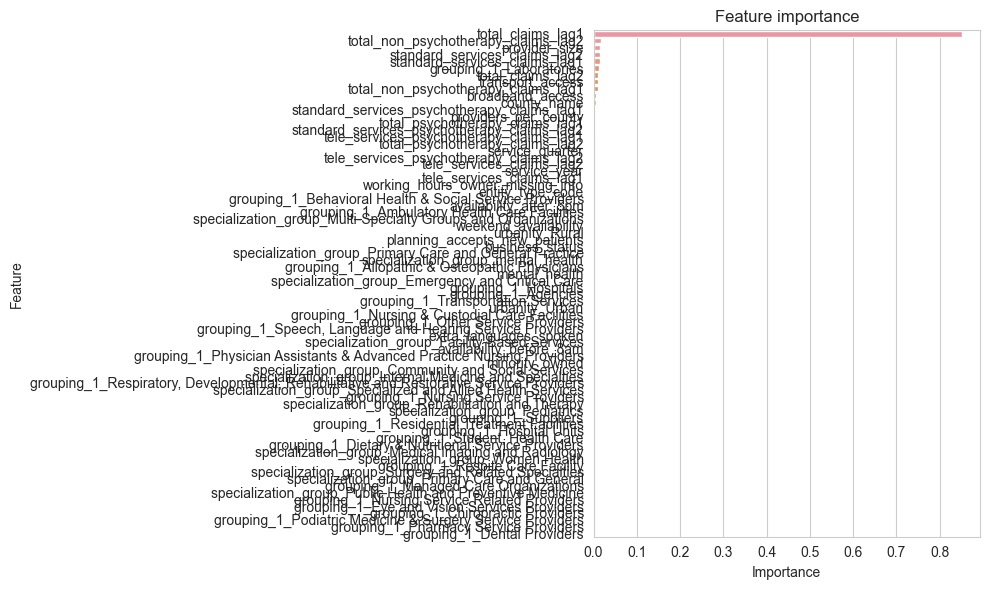

In [ ]:
rfr_importance_df = plot_feature_importances(rfr, X_train.columns)

The first lag of total claims appears to be the most important and the majority of features have little to no importance.

In [ ]:
rfr_importance_df_5 = rfr_importance_df.sort_values(by='Importance', ascending=False).head(5)  # take the first 15 most important features

In [ ]:
top_5_features = rfr_importance_df_5['Feature'].values

# Filter X_train and X_test based on the top 10 features
X_train_dom_5 = X_train[top_5_features]
X_test_dom_5 = X_test[top_5_features]

In [ ]:
rfr_importance_df_10 = rfr_importance_df.sort_values(by='Importance', ascending=False).head(10)  # take the first 10 most important features

In [ ]:
top_10_features = rfr_importance_df_10['Feature'].values

# Filter X_train and X_test based on the top 10 features
X_train_dom_10 = X_train[top_10_features]
X_test_dom_10 = X_test[top_10_features]

In [ ]:
rfr_importance_df_15 = rfr_importance_df.sort_values(by='Importance', ascending=False).head(15)  # take the first 15 most important features

In [ ]:
top_15_features = rfr_importance_df_15['Feature'].values

# Filter X_train and X_test based on the top 10 features
X_train_dom_15 = X_train[top_15_features]
X_test_dom_15 = X_test[top_15_features]

6.2.3 PCA

In [ ]:
pca = PCA(n_components=0.90)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

6.2.4 Correlation on top dominant features

In [ ]:
X_train_cor_dom_15 = X_train_dom_15.copy()
X_test_cor_dom_15 = X_test_dom_15.copy()

# Calculating the matrix
correlation_matrix = X_train_cor_dom_15.corr()

# Threshold for dropping features
threshold = 0.7

# Find and store pairs of highly correlated features
corr_pairs = correlation_matrix.unstack()
high_corr = corr_pairs[(abs(corr_pairs) > threshold) & (corr_pairs != 1.0)]

# Identify unique features to drop
to_drop = set()
for i, j in high_corr.index:
    if i not in to_drop and j not in to_drop:
        to_drop.add(j)  # Choose one of the features to drop

# Drop the features from the DataFrame
X_train_cor_dom_15 = X_train_cor_dom_15.drop(columns=to_drop)
X_test_cor_dom_15 = X_test_cor_dom_15.drop(columns=to_drop)

print(f"Dropped Columns: {to_drop}")
print(f"Remaining Columns: {X_train_cor_dom_15.columns}")
X_train_cor_dom_15.shape

Dropped Columns: {'total_non_psychotherapy_claims_lag2', 'standard_services_claims_lag1', 'standard_services_claims_lag2', 'total_non_psychotherapy_claims_lag1', 'total_claims_lag2', 'broadband_access', 'total_psychotherapy_claims_lag1'}
Remaining Columns: Index(['total_claims_lag1', 'provider_size', 'grouping_1_Laboratories',
       'transport_access', 'county_name', 'providers_per_county',
       'standard_services_psychotherapy_claims_lag1',
       'tele_services_psychotherapy_claims_lag1'],
      dtype='object')


(68348, 8)

6.2.5 Filtering on my instincts

In [ ]:
rfr_importance_df['Feature'].value_counts()

total_claims_lag1                                                                          1
specialization_group_Pediatrics                                                            1
grouping_1_Nursing Service Providers                                                       1
specialization_group_Specialized and Allied Health Services                                1
grouping_1_Respiratory, Developmental, Rehabilitative and Restorative Service Providers    1
                                                                                          ..
grouping_1_Behavioral Health & Social Service Providers                                    1
entity_type_code                                                                           1
tele_services_claims_lag1                                                                  1
tele_services_claims_lag2                                                                  1
grouping_1_Pharmacy Service Providers                                 

In [ ]:
X_train_filtered_new = X_train.drop(columns=['tele_services_claims_lag1','tele_services_claims_lag2','standard_services_claims_lag2', 'standard_services_claims_lag1', 'total_psychotherapy_claims_lag1', 'total_psychotherapy_claims_lag2', 'total_non_psychotherapy_claims_lag1', 'total_non_psychotherapy_claims_lag2', 'standard_services_psychotherapy_claims_lag1', 'standard_services_psychotherapy_claims_lag2'])
X_test_filtered_new = X_test.drop(columns=['tele_services_claims_lag1','tele_services_claims_lag2','standard_services_claims_lag2', 'standard_services_claims_lag1', 'total_psychotherapy_claims_lag1', 'total_psychotherapy_claims_lag2', 'total_non_psychotherapy_claims_lag1', 'total_non_psychotherapy_claims_lag2', 'standard_services_psychotherapy_claims_lag1', 'standard_services_psychotherapy_claims_lag2'])

#### 6.3 Random Forest Models

6.3.1 All features

In [ ]:
# Initialize the model
rfr = RandomForestRegressor(n_estimators=80, random_state=50, max_depth=15)

# Fit the model
rfr.fit(X_train, y_train)

# Predicting
y_train_pred = rfr.predict(X_train)
y_test_pred = rfr.predict(X_test)

# Printing results
print("Train data:")
print_regression_metrics(y_train, y_train_pred)

print("\nTest data:")
print_regression_metrics(y_test, y_test_pred)

Train data:
R2 Score: 0.9745221966586719
Mean Absolute Error: 12.195708911015249
Mean Squared Error: 1696.1112607326081
Root Mean Squared Error: 41.1838713665023

Test data:
R2 Score: 0.9123874731772508
Mean Absolute Error: 16.386917213967624
Mean Squared Error: 4594.181977119066
Root Mean Squared Error: 67.7803952269317


6.3.2 Correlation threshold

In [ ]:
# Initialize the model
rfr_cor = RandomForestRegressor(n_estimators=30, random_state=50, max_depth=4)

# Fit the model
rfr_cor.fit(X_train_cor, y_train)

# Predicting
y_train_pred_cor = rfr_cor.predict(X_train_cor)
y_test_pred_cor = rfr_cor.predict(X_test_cor)

# Printing results
print("Train data:")
print_regression_metrics(y_train, y_train_pred_cor)

print("\nTest data:")
print_regression_metrics(y_test, y_test_pred_cor)

Train data:
R2 Score: 0.9042846698208127
Mean Absolute Error: 27.2691125032069
Mean Squared Error: 6371.971993296522
Root Mean Squared Error: 79.82463274764577

Test data:
R2 Score: 0.8944819359078572
Mean Absolute Error: 27.18903891929037
Mean Squared Error: 5533.103608498402
Root Mean Squared Error: 74.38483453297722


6.3.3 Dominant features - 5

In [ ]:
# Initialize the model
rfr_dom = RandomForestRegressor(n_estimators=40, random_state=50, max_depth=12)

# Fit the model
rfr_dom.fit(X_train_dom_5, y_train)

# Predicting
y_train_pred_dom = rfr_dom.predict(X_train_dom_5)
y_test_pred_dom = rfr_dom.predict(X_test_dom_5)

# Printing results
print("Train data:")
print_regression_metrics(y_train, y_train_pred_dom)

print("\nTest data:")
print_regression_metrics(y_test, y_test_pred_dom)

Train data:
R2 Score: 0.9729935768669834
Mean Absolute Error: 13.71435916318619
Mean Squared Error: 1797.874713700934
Root Mean Squared Error: 42.40135273432835

Test data:
R2 Score: 0.9068909550116045
Mean Absolute Error: 16.422193909920114
Mean Squared Error: 4882.405654819939
Root Mean Squared Error: 69.87421308909273


6.3.4 Dominant features - 10

In [ ]:
# Initialize the model
rfr_dom = RandomForestRegressor(n_estimators=25, random_state=50, max_depth=10)

# Fit the model
rfr_dom.fit(X_train_dom_10, y_train)

# Predicting
y_train_pred_dom = rfr_dom.predict(X_train_dom_10)
y_test_pred_dom = rfr_dom.predict(X_test_dom_10)

# Printing results
print("Train data:")
print_regression_metrics(y_train, y_train_pred_dom)

print("\nTest data:")
print_regression_metrics(y_test, y_test_pred_dom)

Train data:
R2 Score: 0.968156464720648
Mean Absolute Error: 15.414088022403119
Mean Squared Error: 2119.891501055501
Root Mean Squared Error: 46.04227949456348

Test data:
R2 Score: 0.9153434733726747
Mean Absolute Error: 17.04122035585923
Mean Squared Error: 4439.176713435118
Root Mean Squared Error: 66.62714697054885


6.3.5 Dominant features - 15

In [ ]:
# Initialize the model
rfr_dom = RandomForestRegressor(n_estimators=25, random_state=50, max_depth=14)

# Fit the model
rfr_dom.fit(X_train_dom_15, y_train)

# Predicting
y_train_pred_dom = rfr_dom.predict(X_train_dom_15)
y_test_pred_dom = rfr_dom.predict(X_test_dom_15)

# Printing results
print("Train data:")
print_regression_metrics(y_train, y_train_pred_dom)

print("\nTest data:")
print_regression_metrics(y_test, y_test_pred_dom)

Train data:
R2 Score: 0.9723208640167611
Mean Absolute Error: 13.565538822769092
Mean Squared Error: 1842.6586311060425
Root Mean Squared Error: 42.92619982139163

Test data:
R2 Score: 0.9111048785803952
Mean Absolute Error: 17.022742175788217
Mean Squared Error: 4661.438032782715
Root Mean Squared Error: 68.27472469942823


6.3.6 Correlation on dominant features - 15

In [ ]:
# Initialize the model
rfr_cor_dom = RandomForestRegressor(n_estimators=30, random_state=50, max_depth=4)

# Fit the model
rfr_cor_dom.fit(X_train_cor_dom_15, y_train)

# Predicting
y_train_pred_cor_dom = rfr_cor_dom.predict(X_train_cor_dom_15)
y_test_pred_cor_dom = rfr_cor_dom.predict(X_test_cor_dom_15)

# Printing results
print("Train data:")
print_regression_metrics(y_train, y_train_pred_cor_dom)

print("\nTest data:")
print_regression_metrics(y_test, y_test_pred_cor_dom)

Train data:
R2 Score: 0.9041416272583553
Mean Absolute Error: 27.264983943028877
Mean Squared Error: 6381.494639252197
Root Mean Squared Error: 79.88425776867552

Test data:
R2 Score: 0.8955479386081785
Mean Absolute Error: 27.164098520203225
Mean Squared Error: 5477.205090661055
Root Mean Squared Error: 74.00814205654034


6.3.7 With recursive filtering and random forest regressor

In [ ]:
# Define the model
model = RandomForestRegressor(n_jobs=-1)  # n_jobs=-1 enables parallel processing

# Initialize RFECV with cross-validation
rfecv = RFECV(estimator=model, step=1, cv=5, n_jobs=-1)

# Fit RFECV to the data
rfecv.fit(X_train, y_train)

# Get the optimal number of features
optimal_num_features = rfecv.n_features_

# Get the selected features
selected_features = X_train.columns[rfecv.support_]

In [ ]:
# Filter the X_train and X_test datasets to include only the selected features
X_train_filtered = X_train[selected_features]
X_test_filtered = X_test[selected_features]

# Train the model with the selected features
model.fit(X_train_filtered, y_train)

# Predict in the test set
y_test_pred = model.predict(X_test_filtered)

# Evaluate the model with the selected features
print_regression_metrics(y_test, y_test_pred)

R2 Score: 0.8812785242844214
Mean Absolute Error: 17.038795115006213
Mean Squared Error: 6225.45752085152
Root Mean Squared Error: 78.90156855761182


In [ ]:
print(f"Optimal number of features: {optimal_num_features}")

Optimal number of features: 50


6.3.8 With recursive filtering and random forest with other hyperparameters

In [ ]:
# Define the model
model = RandomForestRegressor(n_jobs=-1, n_estimators=25, max_depth=14)

# Initialize RFECV with cross-validation
rfecv = RFECV(estimator=model, step=1, cv=5, n_jobs=-1)

# Fit RFECV to the data
rfecv.fit(X_train, y_train)

# Get the optimal number of features
optimal_num_features = rfecv.n_features_

# Get the selected features
selected_features = X_train.columns[rfecv.support_]

In [ ]:
# Filter the X_train and X_test datasets to include only the selected features
X_train_filtered = X_train[selected_features]
X_test_filtered = X_test[selected_features]

# Train the model with the selected features
model.fit(X_train_filtered, y_train)

# Predict in the test set
y_test_pred = model.predict(X_test_filtered)

# Evaluate the model with the selected features
print_regression_metrics(y_test, y_test_pred)

R2 Score: 0.913576596345939
Mean Absolute Error: 16.46342905053138
Mean Squared Error: 4531.8273295786
Root Mean Squared Error: 67.31884824904984


In [ ]:
print(f"Optimal number of features: {optimal_num_features}")

Optimal number of features: 38


6.3.9 PCA

In [ ]:
# Initialize the model
rfr_pca = RandomForestRegressor(n_estimators=40, random_state=50, max_depth=6)

# Fit the model
rfr_pca.fit(X_train_pca, y_train)

# Predicting
y_train_pred_pca = rfr_pca.predict(X_train_pca)
y_test_pred_pca = rfr_pca.predict(X_test_pca)

# Printing results
print("Train data:")
print_regression_metrics(y_train, y_train_pred_pca)

print("\nTest data:")
print_regression_metrics(y_test, y_test_pred_pca)

6.3.10 Removing other lag columns

In [ ]:
# Initialize the model
rfr_fil = RandomForestRegressor(n_estimators=40, random_state=50, max_depth=6)

# Fit the model
rfr_fil.fit(X_train_filtered_new, y_train)

# Predicting
y_train_pred = rfr_fil.predict(X_train_filtered_new)
y_test_pred = rfr_fil.predict(X_test_filtered_new)

# Printing results
print("Train data:")
print_regression_metrics(y_train, y_train_pred)

print("\nTest data:")
print_regression_metrics(y_test, y_test_pred)

Train data:
R2 Score: 0.9551003277144212
Mean Absolute Error: 17.405855875449685
Mean Squared Error: 2989.066158746952
Root Mean Squared Error: 54.672352782251394

Test data:
R2 Score: 0.8989700919323225
Mean Absolute Error: 17.98146184067209
Mean Squared Error: 5297.755921747942
Root Mean Squared Error: 72.7856848683032


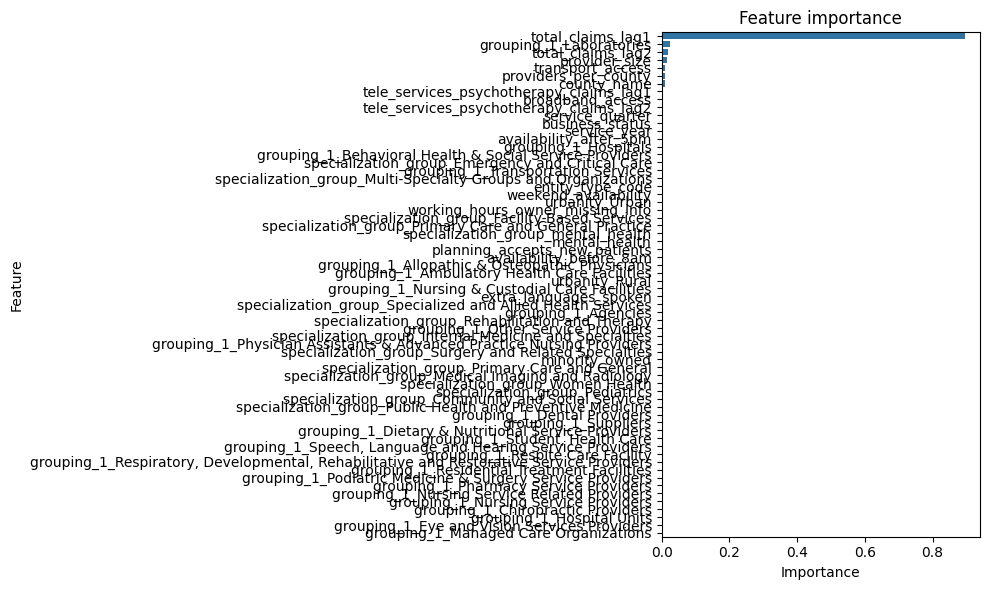

In [ ]:
rfr_importance_df_fil = plot_feature_importances(rfr_fil, X_train_filtered_new.columns)

In [ ]:
rfr_importance_df_fil_10 = rfr_importance_df_fil.sort_values(by='Importance', ascending=False).head(10)

In [ ]:
top_10_features_fil = rfr_importance_df_fil_10['Feature'].values

# Filter X_train and X_test based on the top 10 features
X_train_dom_10_fil = X_train[top_10_features_fil]
X_test_dom_10_fil = X_test[top_10_features_fil]

In [ ]:
# Initialize the model
rfr_fil = RandomForestRegressor(n_estimators=40, random_state=50, max_depth=6, n_jobs=-1)

# Fit the model
rfr_fil.fit(X_train_dom_10_fil, y_train)

# Predicting
y_train_pred = rfr_fil.predict(X_train_dom_10_fil)
y_test_pred = rfr_fil.predict(X_test_dom_10_fil)

# Printing results
print("Train data:")
print_regression_metrics(y_train, y_train_pred)

print("\nTest data:")
print_regression_metrics(y_test, y_test_pred)

Train data:
R2 Score: 0.954158230821316
Mean Absolute Error: 17.466544236059427
Mean Squared Error: 3051.7835417053575
Root Mean Squared Error: 55.24295015389165

Test data:
R2 Score: 0.9145910756243341
Mean Absolute Error: 17.87038670851935
Mean Squared Error: 4478.630571238407
Root Mean Squared Error: 66.92257146313497


6.3.11 Tunning hyperparameters with 5 features

In [ ]:
rfr_5 = random_forest_optuna(X_train_dom_5, y_train, X_test_dom_5, y_test, 10)

[I 2024-06-26 09:48:31,276] A new study created in memory with name: no-name-04659ea1-f924-487d-8c7c-f1295c313002
[I 2024-06-26 09:49:25,954] Trial 0 finished with value: 11548.86657538469 and parameters: {'n_estimators': 115, 'max_depth': 15, 'max_features': 0.728492739113846, 'bootstrap': False}. Best is trial 0 with value: 11548.86657538469.
[I 2024-06-26 09:49:43,692] Trial 1 finished with value: 11049.114886512312 and parameters: {'n_estimators': 96, 'max_depth': 28, 'max_features': 0.12225006526852417, 'bootstrap': False}. Best is trial 1 with value: 11049.114886512312.
[I 2024-06-26 09:50:03,686] Trial 2 finished with value: 10285.681890136057 and parameters: {'n_estimators': 30, 'max_depth': 37, 'max_features': 0.8511732836673889, 'bootstrap': True}. Best is trial 2 with value: 10285.681890136057.
[I 2024-06-26 09:50:46,425] Trial 3 finished with value: 10771.800866071602 and parameters: {'n_estimators': 65, 'max_depth': 38, 'max_features': 0.4807334551860044, 'bootstrap': Fals

Best params: {'n_estimators': 30, 'max_depth': 37, 'max_features': 0.8511732836673889, 'bootstrap': True}
R2 Score: 0.9120979439814587
Mean Absolute Error: 17.014690151875595
Mean Squared Error: 4609.364164659995
Root Mean Squared Error: 67.89229827204258


6.3.12 Features with 0.5%+ importance

In [ ]:
model1 = random_forest_optuna(X_train, y_train, X_test, y_test, 10)

[I 2024-06-27 02:38:20,143] A new study created in memory with name: no-name-92250dda-348d-4513-9bc4-d3a13e5965b9
[I 2024-06-27 02:38:28,159] Trial 0 finished with value: 10813.991228307417 and parameters: {'n_estimators': 50, 'max_depth': 44, 'max_features': 0.4207480649954401, 'bootstrap': False}. Best is trial 0 with value: 10813.991228307417.
[I 2024-06-27 02:38:50,530] Trial 1 finished with value: 9955.976420667066 and parameters: {'n_estimators': 128, 'max_depth': 46, 'max_features': 0.9447621279318427, 'bootstrap': True}. Best is trial 1 with value: 9955.976420667066.
[I 2024-06-27 02:39:12,657] Trial 2 finished with value: 9957.14071697414 and parameters: {'n_estimators': 134, 'max_depth': 41, 'max_features': 0.7849026042128607, 'bootstrap': True}. Best is trial 1 with value: 9955.976420667066.
[I 2024-06-27 02:39:37,474] Trial 3 finished with value: 14313.25319803427 and parameters: {'n_estimators': 110, 'max_depth': 22, 'max_features': 0.9537840691652106, 'bootstrap': False}.

Best params: {'n_estimators': 128, 'max_depth': 46, 'max_features': 0.9447621279318427, 'bootstrap': True}
R2 Score: 0.8985507184405811
Mean Absolute Error: 16.802928276289904
Mean Squared Error: 5319.74681970866
Root Mean Squared Error: 72.93659451680384
Manually calculated
Final r2 score: 0.8985507184405811
Final MAE score: 16.802928276289904
Final MSE score: 5319.74681970866
Final RMSE score: 72.93659451680384


In [ ]:
dump(model1, 'model1.joblib')

In [ ]:
model1_importances = plot_feature_importances(model1, X_train.columns) # change fig size to (10,6) to graph importances for fewer features

In [ ]:
feature_importance_dict = {feature: importance for feature, importance in zip(X_train.columns, model1_importances)}

important_columns = sorted([(feature, importance) for feature, importance in feature_importance_dict.items() if importance >= 0.005], key=lambda x: x[1], reverse=True)

for feature, importance in important_columns:
    print(f'{bold}{feature}{reset}: {round(importance*100, 2)}%')

In [ ]:
important_columns = [col[0] for col in important_columns]
X_train_important_both_lags = X_train[important_columns]
X_test_important_both_lags = X_test[important_columns]

In [ ]:
model1_important_features = random_forest_optuna(X_train_important_both_lags, y_train, X_test_important_both_lags, y_test, 20)

In [ ]:
model1_important_features_importances = plot_feature_importances(model1_important_features, X_train_important_both_lags.columns)

In [ ]:
dump(model1_important_features, 'model1_important_features.joblib')

6.3.13 Dropping the first lag of total claims

Experimenting with dropping the first lag of total claims to see if removing it significantly affects performance and then training another model with the important features.

In [ ]:
X_train1 = X_train.drop('total_claims_lag1', axis=1)
X_test1 = X_test.drop('total_claims_lag1', axis=1)
model1_without_lag1 = random_forest_optuna(X_train1, y_train, X_test1, y_test, 50)

In [ ]:
dump(model1_without_lag1, 'model1_without_lag1.joblib')

In [ ]:
model1_without_lag1_importances = plot_feature_importances(model1_without_lag1, X_train1.columns)

In [ ]:
# 1%+ importances
feature_importance_dict = {feature: importance for feature, importance in zip(X_train1.columns, model1_without_lag1_importances)}

important_columns = sorted([(feature, importance) for feature, importance in feature_importance_dict.items() if importance > 0.01], key=lambda x: x[1], reverse=True)

for feature, importance in important_columns:
    print(f'{bold}{feature}{reset}: {round(importance*100, 2)}%')

In [ ]:
important_columns = [col[0] for col in important_columns]
X_train_important_no_lag1 = X_train[important_columns]
X_test_important_no_lag1 = X_test[important_columns]

In [ ]:
model1_without_lag1_important_features = random_forest_optuna(X_train_important_no_lag1, y_train, X_test_important_no_lag1, y_test, 100)

In [ ]:
dump(model1_without_lag1_important_features, 'model1_without_lag1_important_features.joblib')

In [ ]:
model1_without_lag1_important_features_importances = plot_feature_importances(model1_without_lag1_important_features, X_train_important_no_lag1.columns)

6.3.14 Dropping the first and secong lag of total claims

The effect of removing the first lag on the performance is small. Below, we try to remove the second lag as well to see how the importances will get redistributed and whether the performance worsens.

In [ ]:
X_train2 = X_train1.drop('total_claims_lag2', axis=1)
X_test2 = X_test1.drop('total_claims_lag2', axis=1)
model1_without_lags = random_forest_optuna(X_train2, y_train, X_test2, y_test, 50)

In [ ]:
dump(model1_without_lags, 'model1_without_lags.joblib')

In [ ]:
model1_without_lags_importances = plot_feature_importances(model1_without_lags, X_train2.columns)

In [ ]:
feature_importance_dict = {feature: importance for feature, importance in zip(X_train2.columns, model1_without_lags_importances)}

important_columns = sorted([(feature, importance) for feature, importance in feature_importance_dict.items() if importance > 0.01], key=lambda x: x[1], reverse=True)

for feature, importance in important_columns:
    print(f'{bold}{feature}{reset}: {round(importance*100, 2)}%')

In [ ]:
important_columns = [col[0] for col in important_columns]
X_train_important_without_lags = X_train[important_columns]
X_test_important_without_lags = X_test[important_columns]

In [ ]:
model1_without_lags_important_features = random_forest_optuna(X_train_important_without_lags, y_train, X_test_important_without_lags, y_test, 20)
dump(model1_without_lags_important_features, 'model1_without_lags_important_features.joblib')

In [ ]:
model1_without_lags_important_features_importances = plot_feature_importances(model1_without_lags_important_features, X_train_important_without_lags.columns)

Plotting True vs Predicted Total claims, and then Residuals for **the model with both total claim lags**: full range of True Total Claims and then for up to 500 to see how the model predicts smaller values.

In [ ]:
plot_true_pred_claims(model1_important_features, X_test_important_both_lags, y_test, 25000)

In [ ]:
plot_true_pred_claims(model1_important_features, X_test_important_both_lags, y_test, 500)

In [ ]:
plot_residuals(model1_important_features, X_test_important_both_lags, y_test)

Plotting True vs Predicted Total claims, and then Residuals for **the model without total claim lags**: full range of True Total Claims and then for up to 500 to see how the model predicts smaller values.

In [ ]:
plot_true_pred_claims(model1_without_lags_important_features, X_test_important_without_lags, y_test, 25000)

In [ ]:
plot_true_pred_claims(model1_without_lags_important_features, X_test_important_without_lags, y_test, 500)

In [ ]:
plot_residuals(model1_without_lags_important_features, X_test_important_without_lags, y_test)

**Conclusion**: with or without lags, the performance of the models and the distribution of predictions vs true values are similar. 

6.3.15 Retrying with the best hyperparameters of a Random Forest model

In [ ]:
# Define the model
model = RandomForestRegressor(n_jobs=-1, n_estimators=103, max_depth=44, min_samples_split=3, min_samples_leaf=2, max_features=0.956816039262439, bootstrap=True)

# Initialize RFECV with cross-validation
rfecv = RFECV(estimator=model, step=1, cv=5, n_jobs=-1)

# Fit RFECV to the data
rfecv.fit(X_train, y_train)

# Get the optimal number of features
optimal_num_features = rfecv.n_features_

# Get the selected features
selected_features = X_train.columns[rfecv.support_]

In [ ]:
# Filter the X_train and X_test datasets to include only the selected features
X_train_filtered = X_train[selected_features]
X_test_filtered = X_test[selected_features]

# Train the model with the selected features
model.fit(X_train_filtered, y_train)

# Predict in the test set
y_test_pred = model.predict(X_test_filtered)

# Evaluate the model with the selected features
print_regression_metrics(y_test, y_test_pred)

R2 Score: 0.9209987226516436
Mean Absolute Error: 16.442718003702076
Mean Squared Error: 4142.629572794858
Root Mean Squared Error: 64.36326260216194


In [ ]:
print(f"Optimal number of features: {optimal_num_features}")

Optimal number of features: 68


In [ ]:
importances = model.feature_importances_

# Create a DataFrame for visualization
importances_df = pd.DataFrame({ 'Features': X_train_filtered.columns, 'Importances': importances })

# Sort by importances
importances_df = importances_df.sort_values('Importances', ascending=False)

# Select the top 15
top_15_features = importances_df['Features'][:15]

# print top 15 features
print(top_15_features)

14                              total_claims_lag1
5                                   provider_size
15                              total_claims_lag2
38                        grouping_1_Laboratories
16                  standard_services_claims_lag1
23            total_non_psychotherapy_claims_lag2
2                                     county_name
22            total_non_psychotherapy_claims_lag1
3                                transport_access
17                  standard_services_claims_lag2
4                                broadband_access
24    standard_services_psychotherapy_claims_lag1
20                total_psychotherapy_claims_lag1
25    standard_services_psychotherapy_claims_lag2
13                           providers_per_county
Name: Features, dtype: object


6.3.16 Best hyperparameters of a Random Forest model - 15 dominant features

In [ ]:
top_15_features_list = top_15_features.tolist()
X_train_15 = X_train[top_15_features_list]
X_test_15 = X_test[top_15_features_list]
model = RandomForestRegressor(n_jobs=-1, n_estimators=103, max_depth=44, min_samples_split=3, min_samples_leaf=2, max_features=0.956816039262439, bootstrap=True)

# Initialize RFECV with cross-validation
rfecv = RFECV(estimator=model, step=1, cv=5, n_jobs=-1)

# Fit RFECV to the data
rfecv.fit(X_train_15, y_train)

# Get the optimal number of features
optimal_num_features = rfecv.n_features_

# Get the selected features
selected_features = X_train_15.columns[rfecv.support_]

In [ ]:
# Filter the X_train and X_test datasets to include only the selected features
X_train_filtered = X_train_15[selected_features]
X_test_filtered = X_test_15[selected_features]

# Train the model with the selected features
model.fit(X_train_filtered, y_train)

# Predict in the test set
y_test_pred = model.predict(X_test_filtered)

# Evaluate the model with the selected features
print_regression_metrics(y_test, y_test_pred)

R2 Score: 0.9262344452241839
Mean Absolute Error: 16.87847760330486
Mean Squared Error: 3868.081364310654
Root Mean Squared Error: 62.193901343384574


In [ ]:
print(f"Optimal number of features: {optimal_num_features}")

Optimal number of features: 15


6.3.10 With recursive filtering and random forest with other hyperparameters - 10 dominant features


In [ ]:
importances = model.feature_importances_

# Create a DataFrame for visualization
importances_df = pd.DataFrame({ 'Features': X_train_filtered.columns, 'Importances': importances })

# Sort by importances
importances_df = importances_df.sort_values('Importances', ascending=False)

# Select the top 15
top_10_features = importances_df['Features'][:10]

# print top 15 features
print(top_10_features)

0                       total_claims_lag1
2                       total_claims_lag2
1                           provider_size
4           standard_services_claims_lag1
3                 grouping_1_Laboratories
8                        transport_access
9           standard_services_claims_lag2
6                             county_name
10                       broadband_access
7     total_non_psychotherapy_claims_lag1
Name: Features, dtype: object


6.3.17 Best hyperparameters of a Random Forest model - 10 dominant features

In [ ]:
top_10_features_list = top_10_features.tolist()
X_train_10 = X_train[top_10_features_list]
X_test_10 = X_test[top_10_features_list]
model = RandomForestRegressor(n_jobs=-1, n_estimators=103, max_depth=44, min_samples_split=3, min_samples_leaf=2, max_features=0.956816039262439, bootstrap=True)

# Initialize RFECV with cross-validation
rfecv = RFECV(estimator=model, step=1, cv=5, n_jobs=-1)

# Fit RFECV to the data
rfecv.fit(X_train_10, y_train)

# Get the optimal number of features
optimal_num_features = rfecv.n_features_

# Get the selected features
selected_features = X_train_10.columns[rfecv.support_]

In [ ]:
# Filter the X_train and X_test datasets to include only the selected features
X_train_filtered = X_train_10[selected_features]
X_test_filtered = X_test_10[selected_features]

# Train the model with the selected features
model.fit(X_train_filtered, y_train)

# Predict in the test set
y_test_pred = model.predict(X_test_filtered)

# Evaluate the model with the selected features
print_regression_metrics(y_test, y_test_pred)

R2 Score: 0.9204049278462708
Mean Absolute Error: 17.355120742974023
Mean Squared Error: 4173.766688591891
Root Mean Squared Error: 64.60469556148291


In [ ]:
print(f"Optimal number of features: {optimal_num_features}")

Optimal number of features: 9


In [ ]:
print(selected_features)

Index(['total_claims_lag1', 'total_claims_lag2', 'provider_size',
       'standard_services_claims_lag1', 'grouping_1_Laboratories',
       'transport_access', 'standard_services_claims_lag2', 'county_name',
       'total_non_psychotherapy_claims_lag1'],
      dtype='object')


6.3.18 Best hyperparameters of a Random Forest model - 8 dominant features

In [ ]:
eight_features = ['total_claims_lag1', 'total_claims_lag2', 'provider_size',
'standard_services_claims_lag1', 'grouping_1_Laboratories',
'transport_access', 'standard_services_claims_lag2', 'county_name'] # without total_non_psychotherapy_claims_lag1
X_train_filtered = X_train[eight_features]
X_test_filtered = X_test[eight_features]

In [ ]:
model_8_features = random_forest_optuna(X_train_filtered, y_train, X_test_filtered, y_test, 40)
dump(model_8_features, 'model_8_features.joblib')

[I 2024-06-26 22:32:05,875] A new study created in memory with name: no-name-9bd30ab2-c314-4352-b4b7-f701bae7469e
[I 2024-06-26 22:32:07,088] Trial 0 finished with value: 10143.93221405614 and parameters: {'n_estimators': 37, 'max_depth': 28, 'max_features': 0.6409098356604793, 'bootstrap': True}. Best is trial 0 with value: 10143.93221405614.
[I 2024-06-26 22:32:10,667] Trial 1 finished with value: 9674.938810131913 and parameters: {'n_estimators': 137, 'max_depth': 41, 'max_features': 0.6173518530046165, 'bootstrap': True}. Best is trial 1 with value: 9674.938810131913.
[I 2024-06-26 22:32:12,852] Trial 2 finished with value: 9494.235605326803 and parameters: {'n_estimators': 115, 'max_depth': 26, 'max_features': 0.44646414680348406, 'bootstrap': True}. Best is trial 2 with value: 9494.235605326803.
[I 2024-06-26 22:32:14,684] Trial 3 finished with value: 9928.271965951442 and parameters: {'n_estimators': 90, 'max_depth': 47, 'max_features': 0.42954961012771725, 'bootstrap': True}. B

Best params: {'n_estimators': 124, 'max_depth': 10, 'max_features': 0.6635239601266428, 'bootstrap': True}
R2 Score: 0.913297871267895
Mean Absolute Error: 17.234980271496212
Mean Squared Error: 4546.442976182557
Root Mean Squared Error: 67.4273162463297


,Feature,Importance
0,total_claims_lag1,0.600913
1,total_claims_lag2,0.174937
2,provider_size,0.077523
3,standard_services_claims_lag1,0.055812
6,standard_services_claims_lag2,0.038906
4,grouping_1_Laboratories,0.021369
5,transport_access,0.015963
7,county_name,0.014576


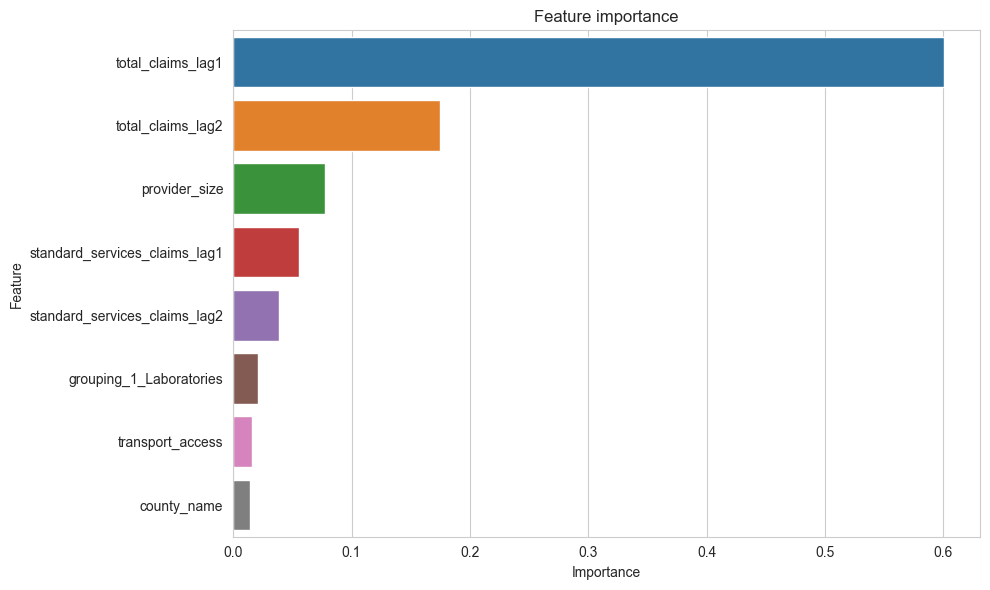

In [ ]:
plot_feature_importances(model_8_features,X_test_filtered.columns, height=6)

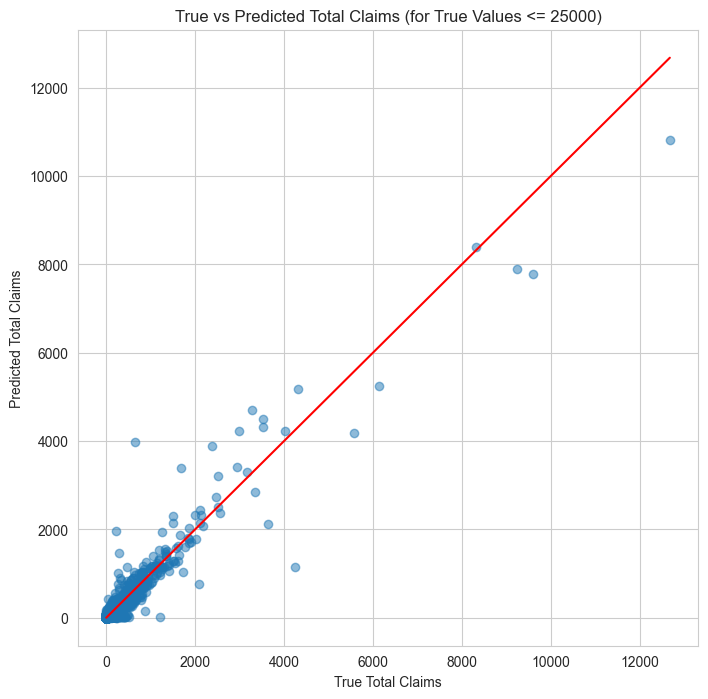

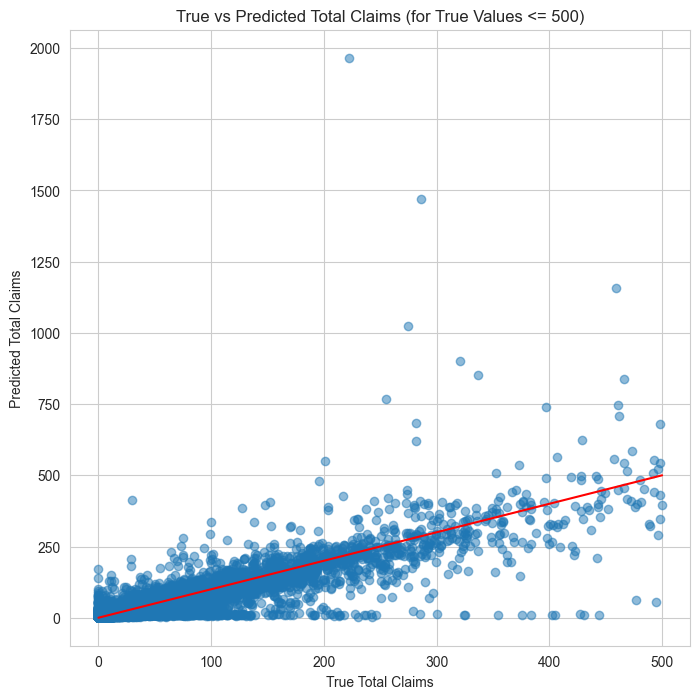

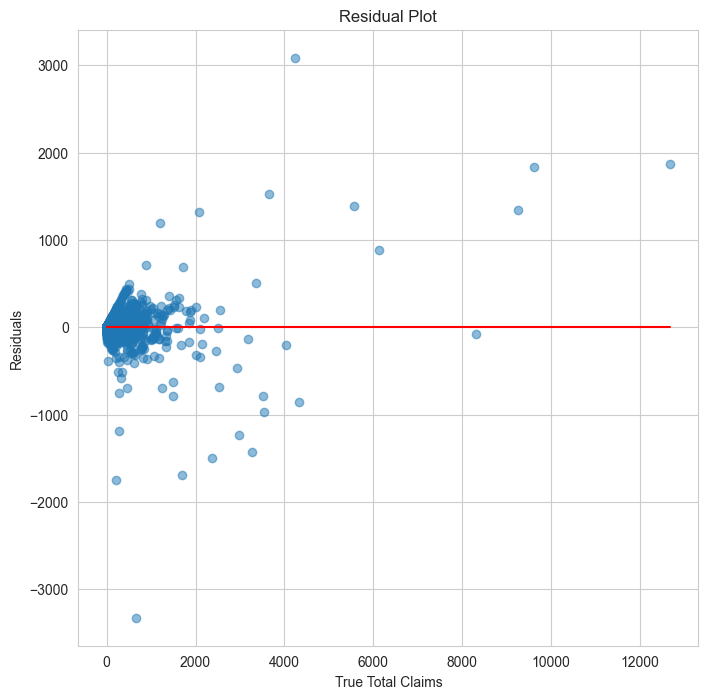

In [ ]:
plot_true_pred_claims(model_8_features, X_test_filtered, y_test, 25000)
plot_true_pred_claims(model_8_features, X_test_filtered, y_test, 500)
plot_residuals(model_8_features, X_test_filtered, y_test)

6.3.19 Attempt to explain the RF model with SHAP values

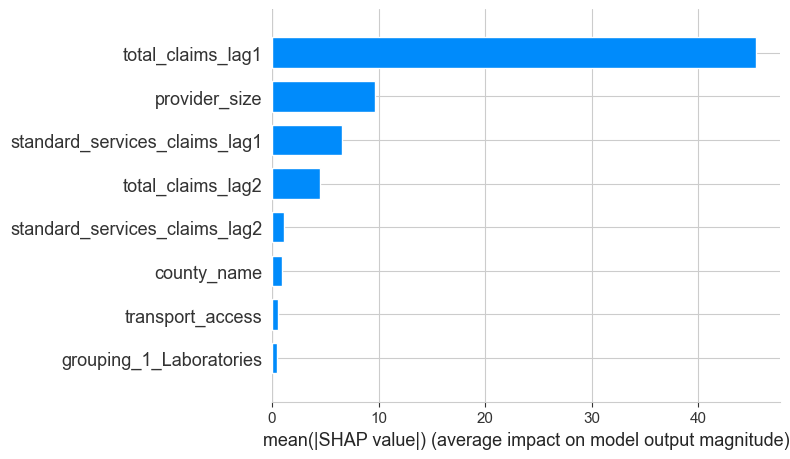

In [ ]:
model_8_features = load('model_8_features.joblib')
import shap

# Initialize JS for SHAP
shap.initjs()

# Create object that can calculate shap values
explainer = shap.TreeExplainer(model_8_features)

# Calculate Shap values
shap_values = explainer.shap_values(X_train_filtered)

# Plot summary plot
shap.summary_plot(shap_values, X_train_filtered, plot_type="bar")

In [ ]:
# Example object
i = 0  # Select instance i from your dataset

# Create force plot
shap.force_plot(explainer.expected_value, shap_values[i, :], X_train_filtered.iloc[i, :])

#### 6.4 XGBoost

 Unsuccessful - no increase in performance

6.4.1 With recursive filtering

In [ ]:
# Define the model
model = XGBRegressor(n_jobs=-1)  # n_jobs=-1 enables parallel processing

# Initialize RFECV with cross-validation
rfecv = RFECV(estimator=model, step=1, cv=5, n_jobs=-1)

# Fit RFECV to the data
rfecv.fit(X_train, y_train)

# Get the optimal number of features
optimal_num_features = rfecv.n_features_

# Get the selected features
selected_features = X_train.columns[rfecv.support_]

In [ ]:
# Filter the X_train and X_test datasets to include only the selected features
X_train_filtered = X_train[selected_features]
X_test_filtered = X_test[selected_features]

# Train the model with the selected features
model.fit(X_train_filtered, y_train)

# Predict in the test set
y_test_pred = model.predict(X_test_filtered)

# Evaluate the model with the selected features
print_regression_metrics(y_test, y_test_pred)

R2 Score: 0.8186191327973629
Mean Absolute Error: 17.314217424330938
Mean Squared Error: 9511.159434796837
Root Mean Squared Error: 97.52517333897354


In [ ]:
print(f"Optimal number of features: {optimal_num_features}")

Optimal number of features: 34


6.4.2 With hyperparameter optimizer

In [ ]:
from xgboost import XGBRegressor

def objectiveXGB(trial, X, y):
    n_estimators = trial.suggest_int("n_estimators", 100, 500)
    max_depth = trial.suggest_int("max_depth", 2, 25)
    learning_rate = trial.suggest_float("learning_rate", 0.01, 0.3)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 10)
    subsample = trial.suggest_float("subsample", 0.1, 1.0)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.1, 1.0)
    reg_alpha = trial.suggest_float("reg_alpha", 1e-8, 1.0, log=True)
    reg_lambda = trial.suggest_float("reg_lambda", 1e-8, 1.0, log=True)

    xgb = XGBRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        learning_rate=learning_rate,
        min_child_weight=min_child_weight,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        objective='reg:squarederror'
    )

    score = cross_val_score(xgb, X, y, cv=5, scoring="neg_mean_squared_error")
    return -1 * score.mean()

def xgboost_optuna(X_train, y_train, X_test, y_test, n_trials):
    study = optuna.create_study(direction="minimize")
    study.optimize(lambda trial:objectiveXGB(trial, X_train, y_train), n_trials=n_trials)
    best_params = study.best_params

    model = XGBRegressor(**best_params, objective='reg:squarederror')
    model.fit(X_train, y_train)

    preds = model.predict(X_test)
    r2, mae, mse, rmse = regression_metrics(y_test, preds)

    print(f"Best params: {best_params}")
    print_regression_metrics(y_test, preds)

    return model

In [ ]:
model2 = xgboost_optuna(X_train, y_train, X_test, y_test, 10)
dump(model2, 'model2.joblib')

In [ ]:
import matplotlib.pyplot as plt

features = X_train.columns  # replace it to your actual features
importances = model2.feature_importances_

importances_percentage = importances / importances.sum()

indices = np.argsort(importances_percentage)
plt.figure(figsize=(10, 12)) # increase the second value here for a taller figure

plt.title('Feature Importance Percentages')
plt.barh(range(len(indices)), importances_percentage[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance in Percentage')
plt.show()

In [ ]:
feature_importance_dict = {feature: importance for feature, importance in zip(X_train.columns, model2.feature_importances_)}

important_columns = sorted([(feature, importance) for feature, importance in feature_importance_dict.items() if importance > 0.005], key=lambda x: x[1], reverse=True)

for feature, importance in important_columns:
    print(f'{bold}{feature}{reset}: {round(importance*100, 2)}%')

In [ ]:
important_columns = [col[0] for col in important_columns]
X_train_important = X_train[important_columns]
X_test_important = X_test[important_columns]

model2_more_important_features = random_forest_optuna(X_train_important, y_train, X_test_important, y_test, 20)

6.4.3 Integrating a hybrid loss function

In [ ]:
import xgboost as xgb
import numpy as np
import optuna
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

def hybrid_loss(y_true, y_pred):
    threshold = 200  # Setthing the threshold
    mse = (y_true - y_pred) ** 2
    mae = np.abs(y_true - y_pred)
    return np.mean(np.where(y_true <= threshold, mse, mae))

def objective_hybrid(trial, X, y):
    n_estimators = trial.suggest_int("n_estimators", 200, 500)
    max_depth = trial.suggest_int("max_depth", 2, 10)
    learning_rate = trial.suggest_float("learning_rate", 0.01, 0.1)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 10)
    subsample = trial.suggest_float("subsample", 0.5, 1.0)
    gamma = trial.suggest_float("gamma", 0, 0.5)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.5, 1.0)

    params = {
        'objective': 'reg:squarederror',
        'n_estimators': n_estimators,
        'max_depth': max_depth,
        'learning_rate': learning_rate,
        'min_child_weight': min_child_weight,
        'subsample': subsample,
        'gamma': gamma,
        'colsample_bytree': colsample_bytree
    }

    gbm = xgb.XGBRegressor(**params)
    gbm.fit(X, y)
    preds = gbm.predict(X)

    return hybrid_loss(y, preds)

def xgboost_optuna(X_train, y_train, X_test, y_test, n_trials=100):
    study = optuna.create_study()
    study.optimize(lambda trial: objective_hybrid(trial, X_train, y_train), n_trials=n_trials)

    best_params = study.best_params
    best_params["objective"] = 'reg:squarederror'
    print(f"Best params: {best_params}")

    model = xgb.XGBRegressor(**best_params)
    model.fit(X_train, y_train)

    preds = model.predict(X_test)

    r2 = r2_score(y_test, preds)
    mae = mean_absolute_error(y_test, preds)
    mse = mean_squared_error(y_test, preds)
    rmse = math.sqrt(mse)

    print(f"Final r2 score: {r2}")
    print(f"Final MAE score: {mae}")
    print(f"Final MSE score: {mse}")
    print(f"Final RMSE score: {rmse}")

    return model

In [ ]:
model3_1 = xgboost_optuna(X_train, y_train, X_test, y_test, 20)
dump(model3_1, 'model3_1.joblib')

In [ ]:
plot_true_pred_claims(model3_1, X_test, y_test, 25000)
plot_true_pred_claims(model3_1, X_test, y_test, 500)
plot_residuals(model3_1, X_test, y_test)

In [ ]:
import matplotlib.pyplot as plt

features = X_train.columns  # replace it to your actual features
importances = model3_1.feature_importances_

importances_percentage = importances / importances.sum()

indices = np.argsort(importances_percentage)
plt.figure(figsize=(10, 12)) # increase the second value here for a taller figure

plt.title('Feature Importance Percentages')
plt.barh(range(len(indices)), importances_percentage[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance in Percentage')
plt.show()

In [ ]:
feature_importance_dict = {feature: importance for feature, importance in zip(X_train.columns, model3_1.feature_importances_)}

important_columns = sorted([(feature, importance) for feature, importance in feature_importance_dict.items() if importance > 0.005], key=lambda x: x[1], reverse=True)

for feature, importance in important_columns:
    print(f'{bold}{feature}{reset}: {round(importance*100, 2)}%')

Using the important features from the Random Forest model, used for initial importance-based feature selection

In [ ]:
important_variables = [
    "total_claims_lag1",
    "total_claims_lag2",
    "provider_size",
    "total_non_psychotherapy_claims_lag1",
    "total_psychotherapy_claims_lag1",
    "standard_services_claims_lag1",
    "standard_services_claims_lag2",
    "grouping_1_Laboratories",
    "total_non_psychotherapy_claims_lag2",
    "broadband_access",
    "county_name",
    "transport_access"
]
X_train_important = X_train[important_variables]
X_test_important = X_test[important_variables]

model3_1_imp_f_with_lags1 = xgboost_optuna(X_train_important, y_train, X_test_important, y_test, 20)
dump(model3_1_imp_f_with_lags1, 'model3_1_imp_f_with_lags1.joblib')

In [ ]:
plot_true_pred_claims(model3_1_imp_f, X_test_important, y_test, 25000)
plot_true_pred_claims(model3_1_imp_f, X_test_important, y_test, 500)
plot_residuals(model3_1_imp_f, X_test_important, y_test)

6.4.4 Log-transform the target

In [ ]:
from sklearn.metrics import mean_squared_log_error

def hybrid_loss(y_true, y_pred):
    threshold = 200  # Set your own threshold
    mse = (y_true - y_pred) ** 2
    mae = np.abs(y_true - y_pred)
    return np.mean(np.where(y_true <= threshold, mse, mae))

def objective_hybrid(trial, X, y):
    n_estimators = trial.suggest_int("n_estimators", 200, 500)
    max_depth = trial.suggest_int("max_depth", 2, 10)
    learning_rate = trial.suggest_float("learning_rate", 0.01, 0.1)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 10)
    subsample = trial.suggest_float("subsample", 0.5, 1.0)
    gamma = trial.suggest_float("gamma", 0, 0.5)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.5, 1.0)

    params = {
        'objective': 'reg:squarederror',
        'n_estimators': n_estimators,
        'max_depth': max_depth,
        'learning_rate': learning_rate,
        'min_child_weight': min_child_weight,
        'subsample': subsample,
        'gamma': gamma,
        'colsample_bytree': colsample_bytree
    }

    gbm = xgb.XGBRegressor(**params)
    gbm.fit(X, np.log1p(y))  # Apply log transformation to y
    preds = np.expm1(gbm.predict(X))
    preds = np.clip(preds, 0, None)  # ensure no negative predictions
    return mean_squared_log_error(y, preds)

def xgboost_optuna_log(X_train, y_train, X_test, y_test, n_trials=100):
    study = optuna.create_study()
    study.optimize(lambda trial: objective_hybrid(trial, X_train, y_train), n_trials=n_trials)

    best_params = study.best_params
    best_params["objective"] = 'reg:squarederror'
    print(f"Best params: {best_params}")

    model = xgb.XGBRegressor(**best_params)
    model.fit(X_train, y_train)

    preds = model.predict(X_test)

    r2 = r2_score(y_test, preds)
    mae = mean_absolute_error(y_test, preds)
    mse = mean_squared_error(y_test, preds)
    rmse = math.sqrt(mse)

    print(f"Final r2 score: {r2}")
    print(f"Final MAE score: {mae}")
    print(f"Final MSE score: {mse}")
    print(f"Final RMSE score: {rmse}")

    return model

In [ ]:
log_model = xgboost_optuna_log(X_train, y_train, X_test, y_test, 20)
dump(log_model, 'log_model.joblib')

In [ ]:
plot_true_pred_claims(log_model, X_test, y_test, 25000)
plot_true_pred_claims(log_model, X_test, y_test, 500)
plot_residuals(log_model, X_test, y_test)

6.4.5 Box-cox transformation on the target

In [ ]:
from scipy.stats import boxcox
from scipy.special import inv_boxcox

def objective_hybrid_box(trial, X, y):
    n_estimators = trial.suggest_int("n_estimators", 200, 500)
    max_depth = trial.suggest_int("max_depth", 2, 10)
    learning_rate = trial.suggest_float("learning_rate", 0.01, 0.1)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 10)
    subsample = trial.suggest_float("subsample", 0.5, 1.0)
    gamma = trial.suggest_float("gamma", 0, 0.5)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.5, 1.0)

    params = {
        'objective': 'reg:squarederror',
        'n_estimators': n_estimators,
        'max_depth': max_depth,
        'learning_rate': learning_rate,
        'min_child_weight': min_child_weight,
        'subsample': subsample,
        'gamma': gamma,
        'colsample_bytree': colsample_bytree
    }

    gbm = xgb.XGBRegressor(**params)

    # Calculate the optimal lambda on log1p transformed target
    y_transformed, lambda_ = boxcox(np.log1p(y + 1))
    # Fit model on transformed target
    gbm.fit(X, y_transformed)

    # Predict with model, note that outputs will be on the transformed space
    preds_transformed = gbm.predict(X)

    # Use inverse Box-Cox transformation to bring predictions back to original target space
    preds = np.expm1(inv_boxcox(preds_transformed, lambda_))
    return mean_squared_log_error(y, preds)

def xgboost_optuna_box(X_train, y_train, X_test, y_test, n_trials=100):
    study = optuna.create_study()
    study.optimize(lambda trial: objective_hybrid_box(trial, X_train, y_train), n_trials=n_trials)

    best_params = study.best_params
    best_params["objective"] = 'reg:squarederror'
    print(f"Best params: {best_params}")

    model = xgb.XGBRegressor(**best_params)
    model.fit(X_train, y_train)

    preds = model.predict(X_test)

    r2 = r2_score(y_test, preds)
    mae = mean_absolute_error(y_test, preds)
    mse = mean_squared_error(y_test, preds)
    rmse = math.sqrt(mse)

    print(f"Final r2 score: {r2}")
    print(f"Final MAE score: {mae}")
    print(f"Final MSE score: {mse}")
    print(f"Final RMSE score: {rmse}")

    return model

In [ ]:
boxcox_model = xgboost_optuna_box(X_train, y_train, X_test, y_test, 20)
dump(boxcox_model, 'boxcox_model.joblib')

In [ ]:
plot_true_pred_claims(boxcox_model, X_test, y_test, 25000)
plot_true_pred_claims(boxcox_model, X_test, y_test, 500)
plot_residuals(boxcox_model, X_test, y_test)

In [ ]:
# LASSO SEARCH CV - NO IMPROVEMENT
import numpy as np
import pandas as pd
from sklearn.linear_model import Lasso
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from scipy.stats import uniform

# Filter the columns according to 'lasso_list'
X_train_new = X_train[lasso_list]
X_test_new = X_test[lasso_list]

# Filter the rows where 'grouping_1_Laboratories' is not 1
non_labs_train = X_train['grouping_1_Laboratories'] != 1
non_labs_test = X_test['grouping_1_Laboratories'] != 1

# Drop 'grouping_1_Laboratories' column
X_train_new = X_train_new[non_labs_train].drop(['grouping_1_Laboratories'], axis=1)
X_test_new = X_test_new[non_labs_test].drop(['grouping_1_Laboratories'], axis=1)

# Filter y_train and y_test according to the same conditions
y_train = y_train[non_labs_train]
y_test = y_test[non_labs_test]

# Scale the features
scaler = StandardScaler()
scaler.fit(X_train_new)

X_train_scaled = scaler.transform(X_train_new)
X_test_scaled = scaler.transform(X_test_new)

# Define the parameter distribution for alpha
param_dist = {'alpha': uniform(loc=1.85, scale=10)}

# Initialize the Lasso model
lasso = Lasso(max_iter=6000)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(lasso, param_distributions=param_dist, n_iter=20, cv=10, scoring='neg_mean_squared_error', random_state=8)

# Fit RandomizedSearchCV
random_search.fit(X_train_scaled, y_train)

# Get the best model
best_lasso = random_search.best_estimator_
print(random_search.best_params_)

# Predict
train_pred = best_lasso.predict(X_train_scaled)
y_pred = best_lasso.predict(X_test_scaled)
train_pred = np.clip(train_pred, a_min=0, a_max=None)
y_pred = np.clip(y_pred, a_min=0, a_max=None)

train_pred_rounded = np.round(train_pred)
y_pred_rounded = np.round(y_pred)

print(bold + "Train metrics" + reset)
regression_metrics(y_train, train_pred_rounded)
print(bold + "Test metrics" + reset)
regression_metrics(y_test, y_pred_rounded)

{'alpha': 1.963988042774299}
Train metrics
R2 Score: 0.9464317745559229
Mean Absolute Error: 16.432995254489626
Mean Squared Error: 3145.5929096492046
Root Mean Squared Error: 56.085585578196515
Test metrics
R2 Score: 0.9659138263868301
Mean Absolute Error: 17.299876640125603
Mean Squared Error: 3077.1271728159695
Root Mean Squared Error: 55.471859287533974


---

# 6.5.v2 Additional Linear Models <a id='linear'></a>

6.5.1 With recursive filtering

In [ ]:
# Define the model
model = LinearRegression(n_jobs=-1)  # n_jobs=-1 enables parallel processing

# Initialize RFECV with cross-validation
rfecv = RFECV(estimator=model, step=1, cv=5, n_jobs=-1)

# Fit RFECV to the data
rfecv.fit(X_train, y_train)

# Get the optimal number of features
optimal_num_features = rfecv.n_features_

# Get the selected features
selected_features = X_train.columns[rfecv.support_]

In [ ]:
# Filter the X_train and X_test datasets to include only the selected features
X_train_filtered = X_train[selected_features]
X_test_filtered = X_test[selected_features]

# Train the model with the selected features
model.fit(X_train_filtered, y_train)

# Predict in the test set
y_test_pred = model.predict(X_test_filtered)

# Evaluate the model with the selected features
print(f"R2 test: {r2_score(y_test, y_test_pred)}")

R2 test: 0.9146077831436422


In [ ]:
print(f"Optimal number of features: {optimal_num_features}")

Optimal number of features: 67


In [ ]:
from sklearn.linear_model import Lasso

6.5.2 With top 10 features

In [ ]:
# Define the model
model = LinearRegression()

# Fit the model
model.fit(X_train_dom_10, y_train)

# Predictions
train_pred = model.predict(X_train_dom_10)
y_pred = model.predict(X_test_dom_10)

train_pred = np.clip(train_pred, a_min=0, a_max=None)
y_pred = np.clip(y_pred, a_min=0, a_max=None)

print(bold+"Train metrics"+reset)
regression_metrics(y_train, train_pred)
print(bold+"Test metrics"+reset)
regression_metrics(y_test, y_pred)

Train metrics
R2 Score: 0.8959426631231588
Mean Absolute Error: 17.67230077603536
Mean Squared Error: 6927.317024712402
Root Mean Squared Error: 83.23050537340502
Test metrics
R2 Score: 0.914080775181389
Mean Absolute Error: 16.87912434466482
Mean Squared Error: 4505.389451308573
Root Mean Squared Error: 67.12219790284414


In [ ]:
# Assuming your X_train_dom_10 is a DataFrame
feature_names = X_train_dom_10.columns
coefficients = model.coef_

# Creating a DataFrame to display feature names and corresponding coefficients
coef_df = pd.DataFrame({'feature': feature_names, 'coefficient': coefficients})

# Sorting the DataFrame by absolute coefficient value in descending order
coef_df = coef_df.reindex(coef_df.coefficient.abs().sort_values(ascending=False).index)

print(coef_df)

                               feature  coefficient
5              grouping_1_Laboratories  1170.547892
2                        provider_size   182.148773
7                     transport_access   -21.622773
9                     broadband_access    11.572367
0                    total_claims_lag1     1.161369
8  total_non_psychotherapy_claims_lag1    -0.386219
1  total_non_psychotherapy_claims_lag2     0.322357
6                    total_claims_lag2    -0.303424
4        standard_services_claims_lag1     0.179680
3        standard_services_claims_lag2     0.090589


In [ ]:
X_train_dom_10.columns

Index(['total_claims_lag1', 'total_non_psychotherapy_claims_lag2',
       'provider_size', 'standard_services_claims_lag2',
       'standard_services_claims_lag1', 'grouping_1_Laboratories',
       'total_claims_lag2', 'transport_access',
       'total_non_psychotherapy_claims_lag1', 'broadband_access'],
      dtype='object')

In [ ]:
column_list = ['total_claims_lag1', 'total_non_psychotherapy_claims_lag2',
               'provider_size', 'standard_services_claims_lag2',
               'standard_services_claims_lag1', 'grouping_1_Laboratories',
               'total_claims_lag2',
               'total_non_psychotherapy_claims_lag1']

In [ ]:
X_train_new = X_train_dom_10[column_list]
X_test_new = X_test_dom_10[column_list]

# Fit the model
model.fit(X_train_new, y_train)

# Predictions
train_pred = model.predict(X_train_new)
y_pred = model.predict(X_test_new)

train_pred = np.clip(train_pred, a_min=0, a_max=None)
y_pred = np.clip(y_pred, a_min=0, a_max=None)

print(bold+"Train metrics"+reset)
regression_metrics(y_train, train_pred)
print(bold+"Test metrics"+reset)
regression_metrics(y_test, y_pred)

Train metrics
R2 Score: 0.895904738266425
Mean Absolute Error: 17.6383717972493
Mean Squared Error: 6929.841762646285
Root Mean Squared Error: 83.24567113457783
Test metrics
R2 Score: 0.914021816644664
Mean Absolute Error: 16.860753201661105
Mean Squared Error: 4508.4810896466315
Root Mean Squared Error: 67.14522387814812


Predictions rounded (the code below shows that rounding predictions does not affect the metrics, but it is reasonable to provide rounded predictions of total claims).

In [ ]:
X_train_new = X_train_dom_10[column_list]
X_test_new = X_test_dom_10[column_list]

# Fit the model
model.fit(X_train_new, y_train)

# Predictions
train_pred = model.predict(X_train_new)
y_pred = model.predict(X_test_new)

train_pred = np.clip(train_pred, a_min=0, a_max=None)
y_pred = np.clip(y_pred, a_min=0, a_max=None)

train_pred_rounded = np.round(train_pred)
y_pred_rounded = np.round(y_pred)

print(bold+"Train metrics"+reset)
regression_metrics(y_train, train_pred_rounded)
print(bold+"Test metrics"+reset)
regression_metrics(y_test, y_pred_rounded)

Train metrics
R2 Score: 0.8959013072854848
Mean Absolute Error: 17.64338385907415
Mean Squared Error: 6930.07017030491
Root Mean Squared Error: 83.24704301237918
Test metrics
R2 Score: 0.9140204917884145
Mean Absolute Error: 16.863529962546817
Mean Squared Error: 4508.550561797752
Root Mean Squared Error: 67.14574120372603


#### 6.6 Linear regression without rows with original NaN values for lags (feature selection with RF)

In [ ]:
# Initialize the model
rfr = RandomForestRegressor(n_estimators=80, random_state=50, max_depth=15)

# Fit the model
rfr.fit(X_train, y_train)

# Predicting
y_train_pred = rfr.predict(X_train)
y_test_pred = rfr.predict(X_test)

# Printing results
print("Train data:")
regression_metrics(y_train, y_train_pred)

print("\nTest data:")
regression_metrics(y_test, y_test_pred)

Train data:
R2 Score: 0.979341936950192
Mean Absolute Error: 11.46945441360818
Mean Squared Error: 1489.1783293399367
Root Mean Squared Error: 38.589873404041334

Test data:
R2 Score: 0.9529430922808101
Mean Absolute Error: 17.176523762023656
Mean Squared Error: 4430.159622674868
Root Mean Squared Error: 66.55944427859106


(0.9529430922808101, 17.176523762023656, 4430.159622674868, 66.55944427859106)

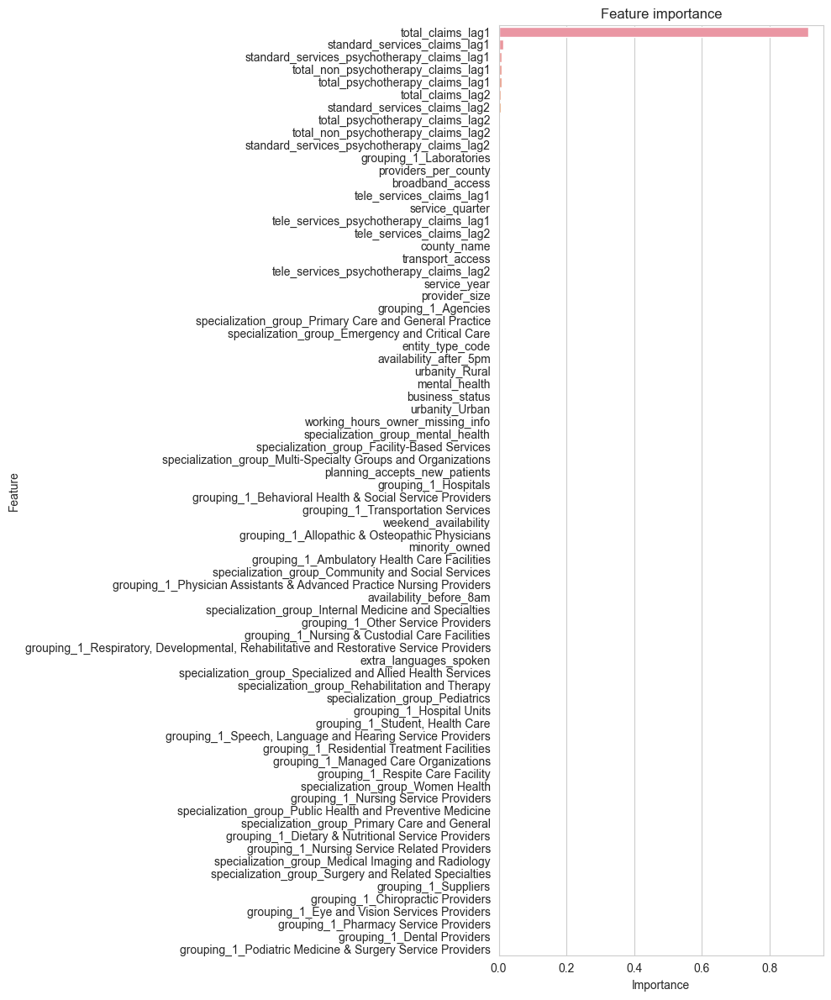

In [ ]:
rfr_importance_df = plot_feature_importances(rfr, X_train.columns, 12)

In [ ]:
rfr_importance_df_10 = rfr_importance_df.sort_values(by='Importance', ascending=False).head(10)  # take the first 10 most important features

In [ ]:
top_10_features = rfr_importance_df_10['Feature'].values

# Filter X_train and X_test based on the top 10 features
X_train_dom_10 = X_train[top_10_features]
X_test_dom_10 = X_test[top_10_features]

In [ ]:
X_train_dom_10.columns

Index(['total_claims_lag1', 'standard_services_claims_lag1',
       'standard_services_psychotherapy_claims_lag1',
       'total_non_psychotherapy_claims_lag1',
       'total_psychotherapy_claims_lag1', 'total_claims_lag2',
       'standard_services_claims_lag2', 'total_psychotherapy_claims_lag2',
       'total_non_psychotherapy_claims_lag2',
       'standard_services_psychotherapy_claims_lag2'],
      dtype='object')

In [ ]:
column_list = ['total_claims_lag1', 'standard_services_claims_lag1',
               'standard_services_psychotherapy_claims_lag1',
               'total_non_psychotherapy_claims_lag1',
               'total_psychotherapy_claims_lag1', 'total_claims_lag2',
               'standard_services_claims_lag2', 'standard_services_psychotherapy_claims_lag2','grouping_1_Laboratories']

In [ ]:
X_train_new = X_train[column_list]
X_test_new = X_test[column_list]

model = LinearRegression()

# Fit the model
model.fit(X_train_new, y_train)

# Predictions
train_pred = model.predict(X_train_new)
y_pred = model.predict(X_test_new)

train_pred = np.clip(train_pred, a_min=0, a_max=None)
y_pred = np.clip(y_pred, a_min=0, a_max=None)

train_pred_rounded = np.round(train_pred)
y_pred_rounded = np.round(y_pred)

print(bold+"Train metrics"+reset)
regression_metrics(y_train, train_pred_rounded)
print(bold+"Test metrics"+reset)
regression_metrics(y_test, y_pred_rounded)

Train metrics
R2 Score: 0.9492967742154683
Mean Absolute Error: 17.14512525929472
Mean Squared Error: 3655.0447582575393
Root Mean Squared Error: 60.45696616815584
Test metrics
R2 Score: 0.9553378887315391
Mean Absolute Error: 17.3750598372427
Mean Squared Error: 4204.7021700973355
Root Mean Squared Error: 64.84367486576726


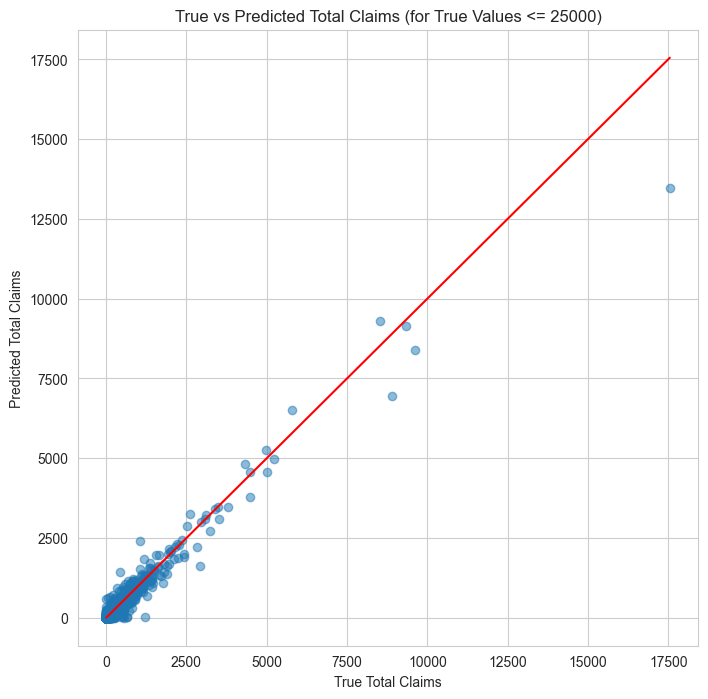

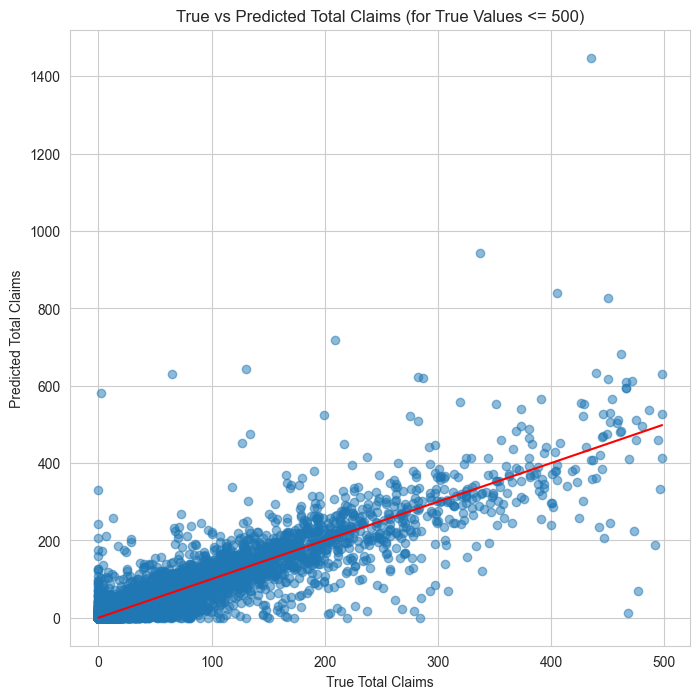

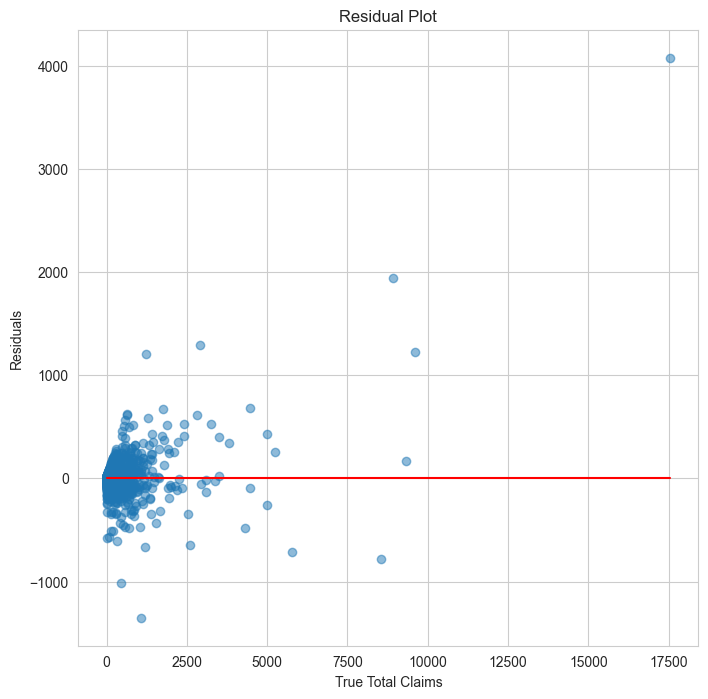

In [ ]:
new_plot_true_pred_claims(y_pred_rounded, y_test, 25000)
new_plot_true_pred_claims(y_pred_rounded, y_test, 500)
new_plot_residuals(y_pred_rounded, y_test)

6.6.1 With scaling (did not help)

In [ ]:
from sklearn.preprocessing import StandardScaler

X_train_new = X_train[column_list]
X_test_new = X_test[column_list]

scaler = StandardScaler()
scaler.fit(X_train_new)

# Transform both train and test data
X_train_scaled_new = scaler.transform(X_train_new)
X_test_scaled_new = scaler.transform(X_test_new)

# Fit the model
model.fit(X_train_scaled_new, y_train)

# Predictions
train_pred = model.predict(X_train_scaled_new)
y_pred = model.predict(X_test_scaled_new)

train_pred = np.clip(train_pred, a_min=0, a_max=None)
y_pred = np.clip(y_pred, a_min=0, a_max=None)

train_pred_rounded = np.round(train_pred)
y_pred_rounded = np.round(y_pred)

print(bold+"Train metrics"+reset)
regression_metrics(y_train, train_pred_rounded)
print(bold+"Test metrics"+reset)
regression_metrics(y_test, y_pred_rounded)

Train metrics
R2 Score: 0.9492956951250998
Mean Absolute Error: 17.150630285623105
Mean Squared Error: 3655.1225466730493
Root Mean Squared Error: 60.45760950180754
Test metrics
R2 Score: 0.9549649122248439
Mean Absolute Error: 17.388942077549068
Mean Squared Error: 4239.815940641455
Root Mean Squared Error: 65.11386903449568


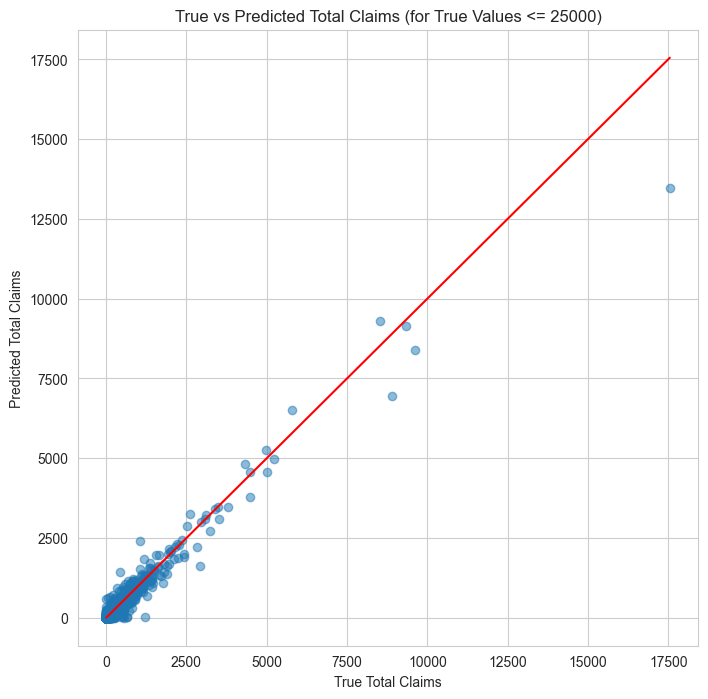

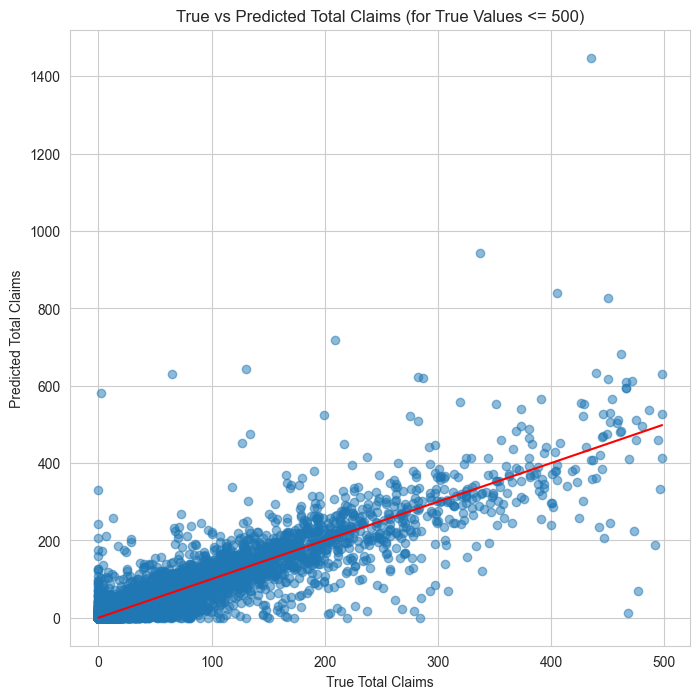

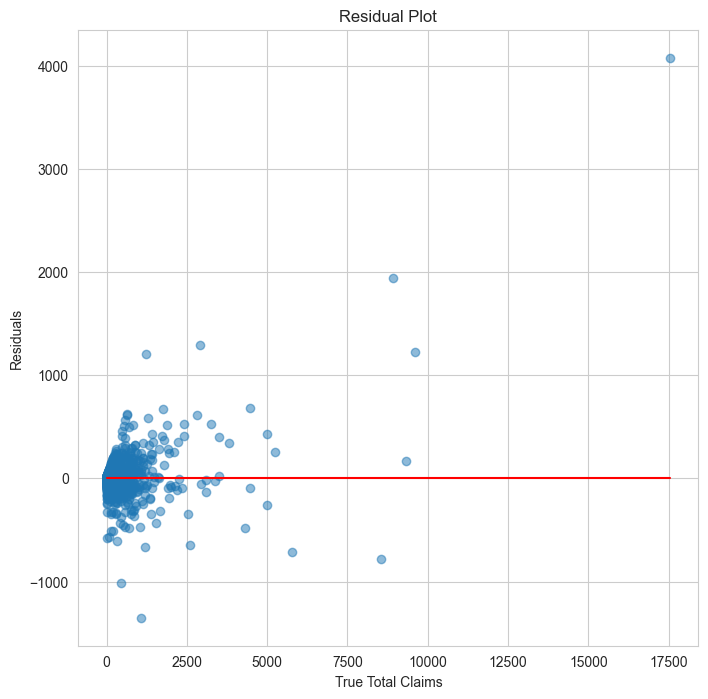

In [ ]:
new_plot_true_pred_claims(y_pred_rounded, y_test, 25000)
new_plot_true_pred_claims(y_pred_rounded, y_test, 500)
new_plot_residuals(y_pred_rounded, y_test)

6.6.2 With Lasso + additional manual feature selection

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit on the training data
scaler.fit(X_train)

# Transform both train and test data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
model = Lasso(max_iter = 6000)

# Fit the model using scaled data
model.fit(X_train_scaled, y_train)

# Predictions, don't forget to use the scaled data
train_pred = model.predict(X_train_scaled)
y_pred = model.predict(X_test_scaled)

train_pred = np.clip(train_pred, a_min=0, a_max=None)
y_pred = np.clip(y_pred, a_min=0, a_max=None)

train_pred_rounded = np.round(train_pred)
y_pred_rounded = np.round(y_pred)

print(bold+"Train metrics"+reset)
regression_metrics(y_train, train_pred_rounded)
print(bold+"Test metrics"+reset)
regression_metrics(y_test, y_pred_rounded)

Train metrics
R2 Score: 0.9489393686945226
Mean Absolute Error: 16.851184777405457
Mean Squared Error: 3680.809059358545
Root Mean Squared Error: 60.669671660217055
Test metrics
R2 Score: 0.9576102008701656
Mean Absolute Error: 16.994255624700813
Mean Squared Error: 3990.7759693633316
Root Mean Squared Error: 63.17258874989477


In [ ]:
# Getting feature names
feature_names = X_train.columns

# Getting coefficients
coefficients = model.coef_

# Combining feature names and their corresponding coefficients in a dataframe.
feature_importance = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Features with non-zero coefficients are chosen by Lasso.
chosen_features = feature_importance[feature_importance['Coefficient'] != 0]

# Convert "Feature" column of chosen_features DataFrame to a list
chosen_features_list = chosen_features['Feature'].tolist()

print(chosen_features)
print(chosen_features_list)

                                        Feature  Coefficient
0                                  service_year     1.205983
1                               service_quarter    -0.688849
5                                 provider_size     6.100272
12                       extra_languages_spoken     0.634149
14                            total_claims_lag1   255.646231
15                            total_claims_lag2    -7.111727
16                standard_services_claims_lag1    12.184642
19                    tele_services_claims_lag2   -12.557940
23          total_non_psychotherapy_claims_lag2    -6.929755
24  standard_services_psychotherapy_claims_lag1    11.325100
40                         grouping_1_Hospitals    -1.512611
41                      grouping_1_Laboratories     8.459838
56           grouping_1_Transportation Services     1.159153
['service_year', 'service_quarter', 'provider_size', 'extra_languages_spoken', 'total_claims_lag1', 'total_claims_lag2', 'standard_services_claims

In [ ]:
lasso_list = ['provider_size',  'total_claims_lag1',
              'total_claims_lag2', 'standard_services_claims_lag1', 'tele_services_claims_lag2',
               'standard_services_psychotherapy_claims_lag1',
               'grouping_1_Laboratories']

In [ ]:
# ADDITIONAL MODEL FOR LABS
X_train_new = X_train[lasso_list]
X_test_new = X_test[lasso_list]

scaler.fit(X_train_new)

# Transform both train and test data
X_train_scaled_new = scaler.transform(X_train_new)
X_test_scaled_new = scaler.transform(X_test_new)

model = Lasso(max_iter = 6000) 

# Fit the model
model.fit(X_train_scaled_new, y_train)

# Predictions
train_pred = model.predict(X_train_scaled_new)
y_pred = model.predict(X_test_scaled_new)

train_pred = np.clip(train_pred, a_min=0, a_max=None)
y_pred = np.clip(y_pred, a_min=0, a_max=None)

train_pred_rounded = np.round(train_pred)
y_pred_rounded = np.round(y_pred)

print(bold+"Train metrics"+reset)
regression_metrics(y_train, train_pred_rounded)
print(bold+"Test metrics"+reset)
regression_metrics(y_test, y_pred_rounded)

Train metrics
R2 Score: 0.9487089787505035
Mean Absolute Error: 16.81394606669858
Mean Squared Error: 3697.4171852561035
Root Mean Squared Error: 60.8063909902249
Test metrics
R2 Score: 0.9576468098825912
Mean Absolute Error: 16.941838200095738
Mean Squared Error: 3987.3294239668103
Root Mean Squared Error: 63.14530405316622


In [ ]:
count = X_test_new[X_test_new['grouping_1_Laboratories'] == 1].shape[0]
print(f"Number of rows where 'grouping_1_Laboratories' is 1: {count}")

Number of rows where 'grouping_1_Laboratories' is 1: 5


In [ ]:
# BEFORE THE INDEX ISSUE WAS FIXED: MATCHING 7 ROWS INSTEAD OF 5 BUT STILL SHOWING HIGH ERRORS
lab_rows_test_X = X_test_new[X_test_new['grouping_1_Laboratories'] == 1]
lab_rows_indexes = lab_rows_test_X.index

lab_pred_rounded = pd.Series(y_pred_rounded, index=y_test.index) 
lab_rows_pred_rounded = lab_pred_rounded.loc[lab_rows_indexes]

lab_rows_test_y = y_test.loc[lab_rows_indexes]

# Calculate residuals
residuals = lab_rows_test_y - lab_rows_pred_rounded

# Create a DataFrame to hold the results
results_df = pd.DataFrame({'True Values': lab_rows_test_y, 'Predicted Values': lab_rows_pred_rounded, 'Residuals': residuals})
print(results_df)

       True Values  Predicted Values  Residuals
npi                                            
10371         4988            5232.0     -244.0
10807            2             541.0     -539.0
7367           130             600.0     -470.0
7367            65             587.0     -522.0
8920         17551           13625.0     3926.0
7367           130             600.0     -470.0
7367            65             587.0     -522.0


6.6.3 Without grouping_1_Laboratories

In [ ]:
# Filter rows where 'service_year' is 2020, 'service_quarter' is 4 and 'grouping_1_Laboratories' is 1
filtered_rows = data_encoded[(data_encoded['service_year'] == 2020) & (data_encoded['service_quarter'] == 4) & (data_encoded['grouping_1_Laboratories'] == 1)]

# Sum of 'total_claims' for these rows
total_claims_filtered = filtered_rows['total_claims'].sum()
print(f"Sum of total_claims: {total_claims_filtered}")

# Filter rows where 'service_year' is 2020 and 'service_quarter' is 4
all_rows = data_encoded[(data_encoded['service_year'] == 2020) & (data_encoded['service_quarter'] == 4)]

# Sum of 'total_claims' for all rows
total_claims_all = all_rows['total_claims'].sum()
print(f"Total sum of total_claims: {total_claims_all}")

# Calculate the ratio
ratio = total_claims_filtered / total_claims_all
print(f"Ratio of total_claims: {round(ratio,2)}")

#Number of records where 'service_year' is 2020 and 'service_quarter' is 4 
num_records = filtered_rows.shape[0]
print(f"Number of records: {num_records}")

Sum of total_claims: 27997
Total sum of total_claims: 641717
Ratio of total_claims: 0.04
Number of records: 3


# FIRST_MODEL, RANDOM TEST SET

**Resetting index to be able to perform aggregations later with the original variables**

In [ ]:
data_encoded_with_index = data_encoded.copy()
data_encoded_with_index.reset_index(level='npi', inplace=True)

In [ ]:
X = data_encoded_with_index.drop(columns='total_claims')
y = data_encoded_with_index['total_claims']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
lasso_list = ['provider_size',  'total_claims_lag1', 'total_claims_lag2', 
              'tele_services_claims_lag2',
              'standard_services_psychotherapy_claims_lag1', 'grouping_1_Laboratories']

In [ ]:
X_train_new = X_train[lasso_list]
X_test_new = X_test[lasso_list]

# Filter the columns where 'grouping_1_Laboratories' is not 1
non_labs_train = X_train['grouping_1_Laboratories'] != 1
non_labs_test = X_test['grouping_1_Laboratories'] != 1

# Drop 'grouping_1_Laboratories' column
X_train_new = X_train_new[non_labs_train].drop(['grouping_1_Laboratories'], axis=1)
X_test_new = X_test_new[non_labs_test].drop(['grouping_1_Laboratories'], axis=1)

# Filter y_train and y_test according to the same conditions
y_train = y_train[non_labs_train]
y_test = y_test[non_labs_test]

# Now that 'grouping_1_Laboratories' is already removed from the features, we can scale them
scaler.fit(X_train_new)

X_train_scaled = scaler.transform(X_train_new)
X_test_scaled = scaler.transform(X_test_new)


# Fit the model
model = Lasso(max_iter=6000)
model.fit(X_train_scaled, y_train)

# Predict
train_pred = model.predict(X_train_scaled)
y_pred = model.predict(X_test_scaled)
train_pred = np.clip(train_pred, a_min=0, a_max=None)
y_pred = np.clip(y_pred, a_min=0, a_max=None)

train_pred_rounded = np.round(train_pred)
y_pred_rounded = np.round(y_pred)

# Print metrics
print(bold + "Train metrics" + reset)
regression_metrics(y_train, train_pred_rounded)
print(bold + "Test metrics" + reset)
regression_metrics(y_test, y_pred_rounded)

Train metrics
R2 Score: 0.9482326340204069
Mean Absolute Error: 16.544640185144544
Mean Squared Error: 3212.9539532749436
Root Mean Squared Error: 56.68292470643116
Test metrics
R2 Score: 0.9586017877065629
Mean Absolute Error: 16.5256604677149
Mean Squared Error: 2808.303136722803
Root Mean Squared Error: 52.993425410354476


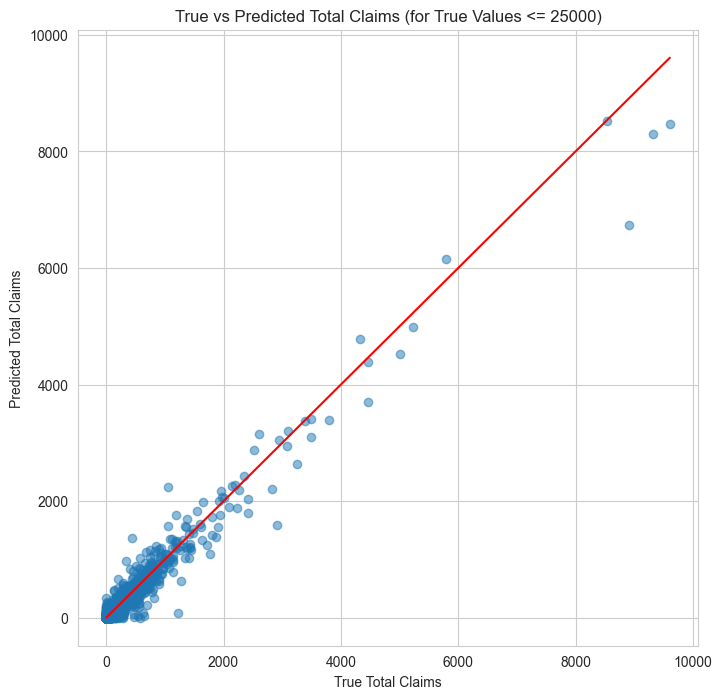

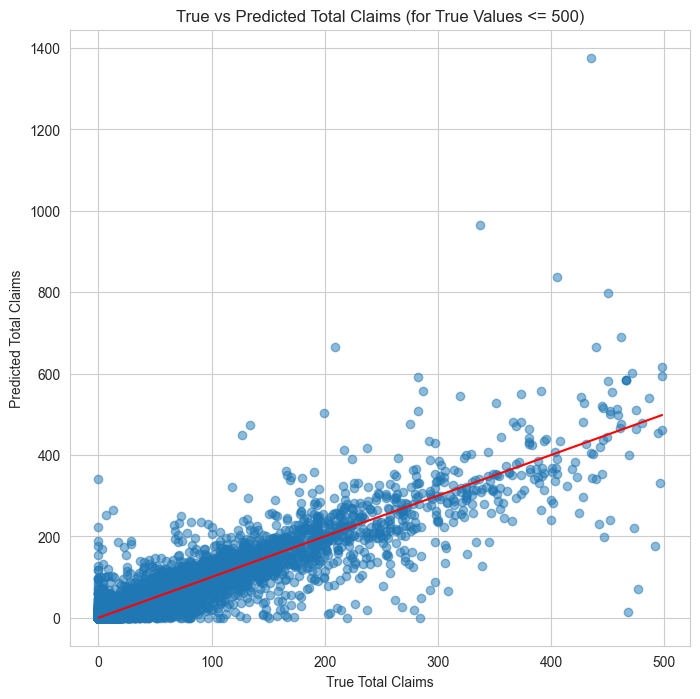

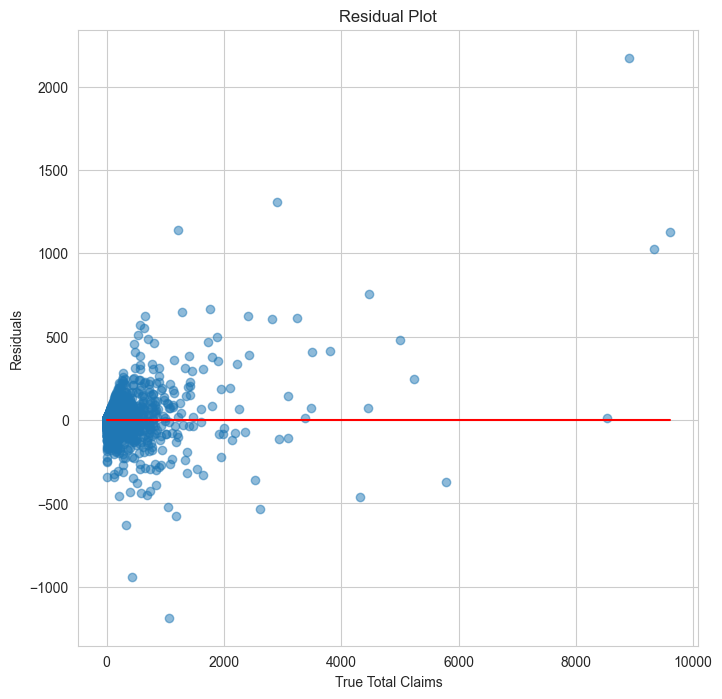

In [ ]:
new_plot_true_pred_claims(y_pred_rounded, y_test_new_nolabs, 25000)
new_plot_true_pred_claims(y_pred_rounded, y_test_new_nolabs, 500)
new_plot_residuals(y_pred_rounded, y_test_new_nolabs)

# WITH THE LABS

In [ ]:
# Define the condition for the test set
test_condition = (data_encoded_with_index['service_year'] == 2020) & (data_encoded_with_index['service_quarter'] == 4)

# Split the data into train and test sets based on the condition
X_train = X[~test_condition]
X_test = X[test_condition]
y_train = y[~test_condition]
y_test = y[test_condition]

# Print the shapes of the resulting datasets to verify the split
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")
print(f"test size %: {y_test.shape[0] / y.shape[0] * 100}")

X_train shape: (53750, 75)
X_test shape: (8920, 75)
y_train shape: (53750,)
y_test shape: (8920,)
test size %: 14.233285463539175


In [ ]:
lasso_list = ['provider_size', 'total_claims_lag1', 'total_claims_lag2', 'tele_services_claims_lag2',
              'standard_services_claims_lag1',
              'standard_services_psychotherapy_claims_lag1',
              'grouping_1_Laboratories']

In [ ]:
# LASSO 
X_train_new = X_train[lasso_list]
X_test_new = X_test[lasso_list]

scaler = StandardScaler()
scaler.fit(X_train_new)

X_train_scaled = scaler.transform(X_train_new)
X_test_scaled = scaler.transform(X_test_new)

# Fit the model
from sklearn.linear_model import Lasso
model = Lasso(max_iter=6000, alpha=3) # adjust alpha as needed
model.fit(X_train_scaled, y_train)

# Predict
train_pred = model.predict(X_train_scaled)
y_pred = model.predict(X_test_scaled)
train_pred = np.clip(train_pred, a_min=0, a_max=None)
y_pred = np.clip(y_pred, a_min=0, a_max=None)

train_pred_rounded = np.round(train_pred)
y_pred_rounded = np.round(y_pred)

# Print metrics
print(bold + "Train metrics" + reset)
regression_metrics(y_train, train_pred_rounded)
print(bold + "Test metrics" + reset)
regression_metrics(y_test, y_pred_rounded)

# Extract and display coefficients
coefficients = model.coef_
features = X_train_new.columns

# Combine the feature names and coefficients into a DataFrame for better visualization
coeff_df = pd.DataFrame({
    'Feature': features,
    'Coefficient': coefficients
})

print("\nCoefficients for each feature:")
print(coeff_df)

Train metrics
R2 Score: 0.947318414040895
Mean Absolute Error: 16.66701395348837
Mean Squared Error: 3445.484688372093
Root Mean Squared Error: 58.69825115258625
Test metrics
R2 Score: 0.9584564128375798
Mean Absolute Error: 18.094843049327356
Mean Squared Error: 5952.162780269058
Root Mean Squared Error: 77.15026105120486

Coefficients for each feature:
                                       Feature  Coefficient
0                                provider_size     0.371845
1                            total_claims_lag1   228.913333
2                            total_claims_lag2     0.000000
3                    tele_services_claims_lag2    -4.265758
4                standard_services_claims_lag1    12.655371
5  standard_services_psychotherapy_claims_lag1    10.293564
6                      grouping_1_Laboratories     1.681492


#### Experiments with interaction terms

In [ ]:
# LASSO 

# Define an empty list to store the names of interaction features
interaction_features = []

# Generate interaction features
for i in range(len(lasso_list)):
    for j in range(i+1, len(lasso_list)):
        # For interaction term, create a new column that is a product of two columns
        X_train[lasso_list[i] + "_" + lasso_list[j] + "_interaction"] = X_train[lasso_list[i]] * X_train[lasso_list[j]]
        X_test[lasso_list[i] + "_" + lasso_list[j] + "_interaction"] = X_test[lasso_list[i]] * X_test[lasso_list[j]]
        interaction_features.append(lasso_list[i] + "_" + lasso_list[j] + "_interaction")

# Add interaction features to lasso list
lasso_list_extended = lasso_list + interaction_features

scaler = StandardScaler()
scaler.fit(X_train_new)

X_train_scaled = scaler.transform(X_train_new)
X_test_scaled = scaler.transform(X_test_new)

# Fit the model
# (Previous code remains the same...)

# Fit the model
model = Lasso(max_iter=6000, alpha=1.9)  # adjust alpha as needed
model.fit(X_train_scaled, y_train)

# (Predictions and metric printing code remains the same...)

# Extract and display coefficients
coefficients = model.coef_
features = X_train_new.columns

# Combine the feature names and coefficients into a DataFrame for better visualization
coeff_df = pd.DataFrame({
    'Feature': features,
    'Coefficient': coefficients
})
# Now, fit an OLS model using these exact same features and check their p-values
import statsmodels.api as sm

# First, add the constant column to the scaled train data
X2 = sm.add_constant(X_train_scaled)

# Fit the OLS model
est = sm.OLS(y_train, X2)
est2 = est.fit()

# Generate a sorted DataFrame of features and their respective p-values
p_values_df = pd.DataFrame({
    'Feature': features,
    'p_value': est2.pvalues[1:]  # Skip the constant
})

In [ ]:
# Features with 'significant' p-values (under 0.05 threshold)
significant_features = p_values_df[p_values_df['p_value'] <= 0.05]['Feature']

# Prepare a mask for coefficients that are both non-zero and absolute value above 0.001
# Only include the significant features based on the p_values
coef_mask = (model.coef_ != 0) & (np.abs(model.coef_) > 0.001) & np.isin(X_train_new.columns, significant_features)

# Use the mask to get the name of Features and corresponding coefficients
significant_coef = model.coef_[coef_mask]
significant_feature_names = X_train_new.columns[coef_mask]

# Filter the p_values_df for only those rows where the feature is in the list of significant_feature_names
significant_pvalues_df = p_values_df[p_values_df['Feature'].isin(significant_feature_names)]

print("\nSignificant p-values for features with absolute coefficients above 0.001:")
print(significant_pvalues_df)


Significant p-values for features with absolute coefficients above 0.001:
                                        Feature        p_value
x1                                provider_size   1.236170e-13
x2                            total_claims_lag1   0.000000e+00
x4                    tele_services_claims_lag2  2.029993e-188
x5                standard_services_claims_lag1   9.383686e-26
x6  standard_services_psychotherapy_claims_lag1  1.369255e-130
x7                      grouping_1_Laboratories   1.438391e-68


No interaction terms seem to matter when Labs are included, and all original variables are considered important.

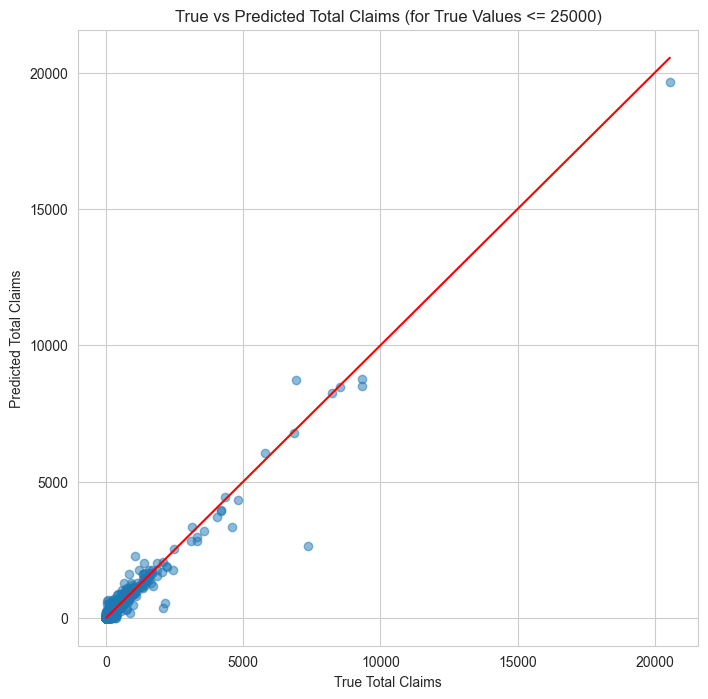

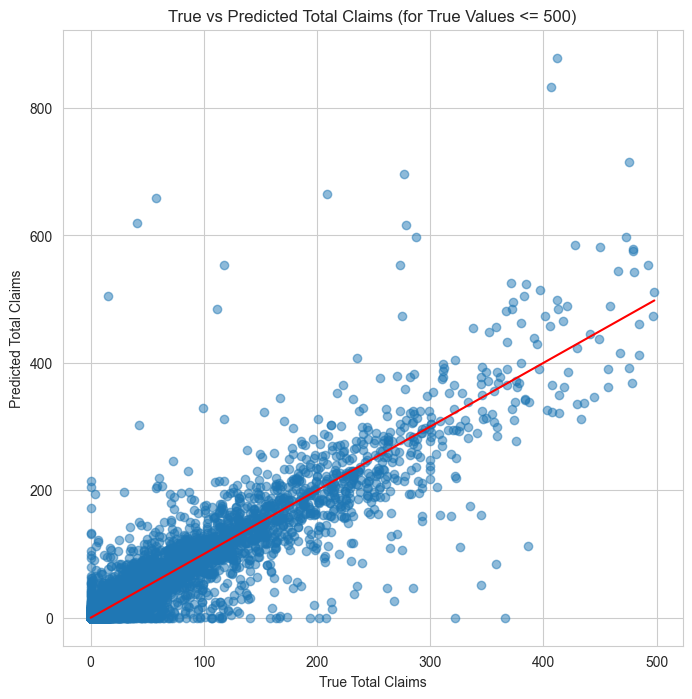

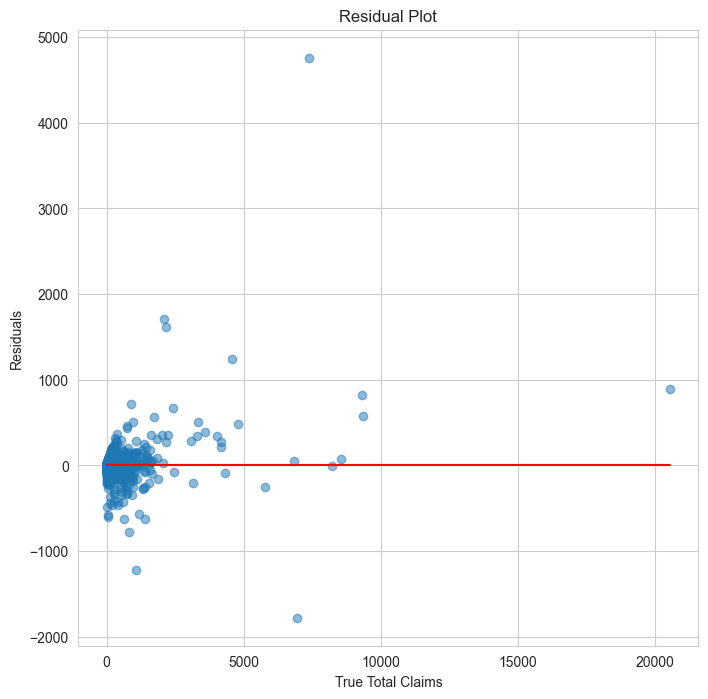

In [ ]:
new_plot_true_pred_claims(y_pred_rounded, y_test, 25000)
new_plot_true_pred_claims(y_pred_rounded, y_test, 500)
new_plot_residuals(y_pred_rounded, y_test)

In [ ]:
# Create a DataFrame with actual and predicted values
df_Labs = pd.DataFrame({
    'grouping_1_Laboratories': X_test_new['grouping_1_Laboratories'], 
    'Actual': y_test,
    'Predicted': y_pred_rounded
})

# Calculate residuals
df_Labs['Residuals'] = df_Labs['Actual'] - df_Labs['Predicted']

# Filter rows where the absolute value of residuals is more than 500
df_above_500 = df_Labs[df_Labs['Residuals'].abs() > 500]

df_above_500

,grouping_1_Laboratories,Actual,Predicted,Residuals
10065,False,41,620.0,-579.0
41915,False,58,659.0,-601.0
53363,False,962,453.0,509.0
53371,False,2152,541.0,1611.0
53381,False,878,158.0,720.0
53721,False,1183,1754.0,-571.0
53793,False,1058,2278.0,-1220.0
53915,False,1389,2017.0,-628.0
54309,False,648,1269.0,-621.0
54349,False,823,1594.0,-771.0


Including the labs leads to more very high residuals of 500+ total claims, some of which, especially one of the three labs that exist in our test set, is extremely high, accounting for a considerable increase in the MSE of this model.